In [98]:
f_peak = '190718_122631.vital'
pickle.load(open(peak_path+'ECG_100Hz_preop_all/'+f_peak, 'rb'))

[28,
 110,
 194,
 277,
 360,
 578,
 605,
 686,
 767,
 849,
 932,
 1014,
 1095,
 1177,
 1260,
 1344,
 1430,
 1516,
 1602,
 1689,
 1775,
 1861,
 1947,
 2032,
 2118,
 2205,
 2293,
 2380,
 2469,
 2557,
 2644,
 2732,
 2817,
 2898,
 2979,
 3062,
 3148,
 3235,
 3323,
 3410,
 3499,
 3590,
 3682,
 3774,
 3863,
 3951,
 4039,
 4127,
 4214,
 4301,
 4388,
 4475,
 4561,
 4649,
 4737,
 4825,
 4912,
 4999,
 5086,
 5172,
 5257,
 5343,
 5429,
 5515,
 5602,
 5691,
 5778,
 5867,
 5957,
 6047,
 6136,
 6223,
 6308,
 6394,
 6479,
 6565,
 6650,
 6735,
 6822,
 6908,
 6996,
 7086,
 7177,
 7269,
 7361,
 7452,
 7545,
 7636,
 7726,
 7816,
 7905,
 7992,
 8079,
 8165,
 8252,
 8426,
 8512,
 8600,
 8687,
 8773,
 8859,
 8946,
 9031,
 9117,
 9204,
 9289,
 9375,
 9462,
 9549,
 9636,
 9723,
 9808,
 9893,
 9978,
 10064,
 10150,
 10236,
 10339,
 10497,
 10668,
 10754,
 10837,
 10916,
 10996,
 11077,
 11160,
 11244,
 11331,
 11418,
 11507,
 11597,
 11688,
 11777,
 11868,
 11958,
 12047,
 12136,
 12227,
 12317,
 12407,
 12498

In [60]:
import pandas as pd

ppg_val = vitaldb.vital_recs(vital_path+'preop_vital/'+f_vital, ['SNUADC/PLETH'], interval = 1/100).flatten()
ppg_val = pd.DataFrame(ppg_val).fillna(method='ffill', axis=0).fillna(method='bfill', axis=0).values.flatten()
minlist, maxlist = arr.detect_peaks(ppg_val, 100)
minlist, maxlist

([154,
  221,
  335,
  357,
  502,
  601,
  704,
  774,
  845,
  910,
  989,
  1060,
  1133,
  1204,
  1274,
  1344,
  1416,
  1485,
  1554,
  1628,
  1698,
  1772,
  1844,
  1915,
  1983,
  2050,
  2119,
  2191,
  2259,
  2335,
  2407,
  2479,
  2550,
  2622,
  2692,
  2764,
  2835,
  2905,
  2960,
  3010,
  3088,
  3133,
  3195,
  3309,
  3353,
  3455,
  3488,
  3580,
  3648,
  3715,
  3782,
  3848,
  3915,
  3978,
  4032,
  4189,
  4259,
  4329,
  4395,
  4464,
  4532,
  4599,
  4669,
  4739,
  4808,
  4877,
  4942,
  5018,
  5091,
  5160,
  5226,
  5294,
  5361,
  5438,
  5475,
  5573,
  5635,
  5702,
  5772,
  5839,
  5905,
  5974,
  6039,
  6116,
  6188,
  6261,
  6334,
  6404,
  6477,
  6529,
  6618,
  6684,
  6764,
  6838,
  6912,
  6984,
  7055,
  7122,
  7187,
  7257,
  7329,
  7405,
  7486,
  7568,
  7648,
  7724,
  7800,
  7842,
  7959,
  8035,
  8112,
  8189,
  8262,
  8335,
  8410,
  8486,
  8560,
  8634,
  8706,
  8779,
  8851,
  8922,
  8992,
  9062,
  9130,
  9202,
  9

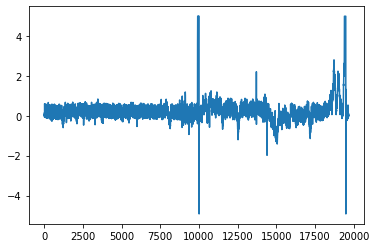

In [10]:
import matplotlib.pyplot as plt


plt.plot(ecg_val[40000:60000])
#plt.plot(ecg_peak[0], ecg_val[ecg_peak[0]])

# Loading model

## GPU setting

In [4]:
import tensorflow as tf

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        # Currently, memory growth needs to be the same across GPUs
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Memory growth must be set before GPUs have been initialized
        print(e)

4 Physical GPUs, 4 Logical GPUs


# Apply

In [69]:
import os, sys, pickle
sys.path.append('../../cranberry2/Preprocessing/')
from pyvital2 import vitaldb, arr
from scipy import signal
import statsmodels.api as sm
import pandas as pd


def linear_connection(list, idx):
    '''
        피크 사이 wave를 모두 같은 length로 만들기 위한 함수
    '''
    int_idx = int(idx)
    return list[int_idx] + (list[int_idx+1] - list[int_idx]) * (idx - int_idx)


# Lowess filter
def smooth(y):
    #return savitzky_golay(y, window_size=2001, order=3)
    return lowess(y)

def lowess(y, f=0.2):
    x = np.arange(0, len(y))
    return sm.nonparametric.lowess(y, x, frac=f, it=0)[:, 1].T



# input 설정
LEN_INPUT = 20 # input 10s
OVERLAP = 10
#SRATE = 250


vital_path = '../../cranberry2/Preprocessing/vital_data/'
peak_path = '../../cranberry2/Preprocessing/cache/peaks/'
#for (root, dirs, files) in os.walk(vital_path + '/preop_vital')
#vitaldb.vital_recs(vital_path)
#ppg_val = vitaldb.vital_recs(vital_path+'/'+f_vital, ['SNUADC/ECG_II'], interval = 0.0025).flatten()


idx += 1
f_vital_list = os.listdir(vital_path+'preop_full_vital')
f_vital = f_vital_list[idx]
f_peak = f_vital.split('_',1)[1]
print('idx: {},  preop file:'.format(idx), f_vital)


x_input = []
y_pred = []

while True:
    '''
    # peaks가 없는 경우는 ECG나 PPG data가 없는 case들
    if not os.path.exists(peak_path+'PPG_100Hz_preop_all/'+f_peak):
        print('no existing PPG peaks: ', f_vital)
        break
    if not os.path.exists(peak_path+'ECG_250Hz_preop_all/'+f_peak):
        print('no existing ECG peaks: ', f_vital)
        break


    # PPG peaks
    ppg_peak = (pickle.load(open(peak_path+'PPG_100Hz_preop_all/'+f_peak, 'rb')))
    ppg_peak = np.array([ppg_peak])
    # ECG peaks
    ecg_peak = np.array(pickle.load(open(peak_path+'ECG_100Hz_preop_all/'+f_peak, 'rb')))
    ecg_peak = np.array([ecg_peak])
    '''
    
    # CO2
    vital_co2 = vitaldb.vital_recs(vital_path+'preop_full_vital/'+f_vital, ['Datex-Ohmeda/CO2'], interval = 1/25).flatten()
    vital_co2 = np.array(pd.DataFrame(vital_co2).fillna(method='ffill', axis=0).fillna(method='bfill', axis=0).values.flatten())
    if len(vital_co2) <= 1:
        print('no vital co2')
        break
    else:
        print('existing CO2 curve...', end='')
        vital_co2[vital_co2<=0] = 0
    
    
    
    
    # loading vital data
    ppg_val = vitaldb.vital_recs(vital_path+'preop_full_vital/'+f_vital, ['SNUADC/PLETH'], interval = 1/100).flatten()
    ecg_val = vitaldb.vital_recs(vital_path+'preop_full_vital/'+f_vital, ['SNUADC/ECG_II'], interval = 1/100).flatten()
    ecg_samp = vitaldb.vital_recs(vital_path+'preop_full_vital/'+f_vital, ['SNUADC/ECG_II'], interval = 1/250).flatten()
    #ppg_val = pd.DataFrame(ppg_val).fillna(method='ffill', axis=0).fillna(method='bfill', axis=0).values.flatten()
    #ppg_samp = signal.resample(ppg_val, len(ecg_samp))
    
    if len(ppg_val) <=1:
        print('no ppg')
        break
        
    if  len(ecg_val) <=1:
        print('no ecg')
        break
    print('existing PPG, ECG data')
    
    # 100Hz PPG의 peak detection
    print('detecting PPG peak...', end='')
    if os.path.exists(peak_path+'preop_full/PPG_100Hz_preop/'+f_peak):
        _, ppg_peak = pickle.load(open(peak_path+'preop_full/PPG_100Hz_preop/'+f_peak, 'rb'))
        
    else:
        min_ppg, ppg_peak = arr.detect_peaks((pd.DataFrame(ppg_val).fillna(method='ffill').fillna(method='bfill').values.flatten()), 100)
        pickle.dump((min_ppg, ppg_peak), open(peak_path+'preop_full/PPG_100Hz_preop/'+f_peak, 'wb'))
    ppg_peak = np.array([ppg_peak])
    print('done..detecting ECG peak', end='')

    
    # 100Hz ECG의 peak detection
    if os.path.exists(peak_path+'preop_full/ECG_100Hz_preop/'+f_peak):
        ecg_peak = pickle.load(open(peak_path+'preop_full/ECG_100Hz_preop/'+f_peak, 'rb'))
                
    else:
        ecg_peak = arr.detect_qrs((pd.DataFrame(ecg_val).fillna(method='ffill').fillna(method='bfill').values.flatten()),100)
        pickle.dump(ecg_peak, open(peak_path+'preop_full/ECG_100Hz_preop/'+f_peak, 'wb'))
    ecg_peak = np.array([ecg_peak])   
    print('done')
    
    
    # 각 window마다 전처리 후 모델에 값을 집어넣어 계산
    n_window = (len(ecg_samp)//250-LEN_INPUT)//OVERLAP + 1
    for i in range(n_window-1):
        
        print('input {} ...'.format(i), end='')    
        SRATE = 100
        bool_process = False
        frac = 0.2 # lowess fraction 계쑤
        
        
        # 전처리 과정
        while True:
            start_idx = i*OVERLAP*SRATE # 2500i
            end_idx = (i*OVERLAP + LEN_INPUT)*SRATE # 2500i + 5000


            seg_ppg, seg_ecg = [np.nan for j in range(LEN_INPUT*SRATE)], [np.nan for j in range(LEN_INPUT*SRATE)] 
            seg_ppg = np.copy(ppg_val[start_idx:end_idx])
            seg_ecg = np.copy(ecg_val[start_idx:end_idx])
            
            
            seg_ppg = seg_ppg - lowess(pd.DataFrame(seg_ppg).fillna(method='ffill', axis=0).fillna(method='bfill', axis=0).values.flatten(), frac)
            seg_ecg = seg_ecg - lowess(pd.DataFrame(seg_ecg).fillna(method='ffill', axis=0).fillna(method='bfill', axis=0).values.flatten(), frac)

            ### 1. 결측치 처리 ###              
            # df.isnull().sum() 하면 더 간단하게 가능하나 애초에 NRS에 해당하는 vital data가 120초 보다 짧은 경우
            nan_ppg_list = np.isnan(seg_ppg)
            nan_ecg_list = np.isnan(seg_ecg)
            nan_ppg_perc = np.sum(nan_ppg_list) / LEN_INPUT / SRATE
            nan_ecg_perc = np.sum(nan_ecg_list) / LEN_INPUT / SRATE

            # ECG, PPG 둘다 결측치인 부분
            nan_both_perc = 0
            for j in range(len(seg_ppg)):
                if nan_ppg_list[j] and  nan_ecg_list[j]:
                    nan_both_perc += 1
            nan_both_perc /= (LEN_INPUT*SRATE)

            # segment의 결측치 비율 정보
            nan_info = [nan_ppg_perc, nan_ecg_perc, nan_both_perc]

            # 결측치가 많은 경우, noise 확인할 것도 없이 False -  이 경우의 noise_info는 -1로 처리
            if nan_ppg_perc > 0.2 or nan_ecg_perc > 0.2:
                print('nan out...', end='')
                break



            ### 2. Noise 처리 ###
            # 10초 segment 내의 ppg, ecg peak idx
            #seg_ppg_min = ppg_min[(start_idx<=np.array(ppg_min)) & (np.array(ppg_min)<end_idx)]
            idx_ppg_peak = ppg_peak[(start_idx<=ppg_peak) & (ppg_peak<end_idx)] - start_idx
            idx_ecg_peak = ecg_peak[(start_idx<=ecg_peak) & (ecg_peak<end_idx)] - start_idx

            # peak가 5개 이하는 noise가 많이 낀 상황 (20초 구간 중 peak가 18초 이상 없으면 문제 -> 즉 peak 개수 범위는 18/2 ~ 18/0.4)
            # 따라서 peak가 18초 이상 있어야하고 이때 최소 peak 개수는 9개
            # peak 개수가 기준 미달이면 noise 계산 자세히 할 필요없이 False - 이 경우의 noise_info는 -2로 처리
            if len(idx_ppg_peak)<=9 or len(idx_ecg_peak)<=9:
                print('peak out...', end='')
                break


            # 10초 segment 내의 ppg, ecg peak value
            #print(len(seg_ppg), idx_ppg_peak)
            val_ppg_peak = [seg_ppg[k] for k in idx_ppg_peak]
            val_ecg_peak = [seg_ecg[k] for k in idx_ecg_peak]

            # peak와 peak 사이 interval에 대한 noise 여부 -> 따라서 길이는 peak - 1
            bool_noise_ppg = [False for k in range(len(idx_ppg_peak)-1)]
            bool_noise_ecg = [False for k in range(len(idx_ecg_peak)-1)]

            #  2.1 peak 간격 이상한 noise (HR 30~150 -> HBI 0.4s ~ 2s로 SRATE 곱해주면 40~200)
            for k in range(len(bool_noise_ppg)):
                if not 40 < idx_ppg_peak[k+1] - idx_ppg_peak[k] < 200:
                    bool_noise_ppg[k] = True
            for k in range(len(bool_noise_ecg)):
                if not 40 < idx_ecg_peak[k+1] - idx_ecg_peak[k] < 200:
                    bool_noise_ecg[k] = True

            # 2.2 모양 이상한 noise
            # wave interval into same length(2s(500))
            len_wave = 500
            norm_seg_ppg, norm_seg_ecg = [], []

            for k in range(len(bool_noise_ppg)):
                len_interval_ppg = idx_ppg_peak[k+1] - idx_ppg_peak[k]

                # peak 사이 wave를 모두 같은 길이로 변환
                norm_seg_ppg.append([linear_connection(seg_ppg[idx_ppg_peak[k]:idx_ppg_peak[k+1]+1], n/len_wave*len_interval_ppg) for n in range(len_wave)])

            for k in range(len(bool_noise_ecg)):
                len_interval_ecg = idx_ecg_peak[k+1] - idx_ecg_peak[k]

                # peak 사이 wave를 모두 같은 길이로 변환
                norm_seg_ecg.append([linear_connection(seg_ecg[idx_ecg_peak[k]:idx_ecg_peak[k+1]+1], n/len_wave*len_interval_ecg) for n in range(len_wave)])


            # wave interval 사이 correlation 계산 - PPG
            mean_wave_ppg = np.nanmean(norm_seg_ppg, axis = 0)
            mean_wave_ppg = pd.DataFrame(mean_wave_ppg).fillna(method='ffill', axis=0).fillna(method='bfill', axis=0).values.flatten()
            norm_seg_ppg = pd.DataFrame(norm_seg_ppg).fillna(method='ffill', axis=1).fillna(method='bfill', axis=1).values
            for k in range(len(bool_noise_ppg)):
                if np.corrcoef(norm_seg_ppg[k], mean_wave_ppg)[0,1] < 0.9:
                    bool_noise_ppg[k] = True
            noise_ppg_perc = np.sum(bool_noise_ppg) / len(bool_noise_ppg)

            # wave interval 사이 correlation 계산 - ECG                
            mean_wave_ecg = np.nanmean(norm_seg_ecg, axis = 0)
            mean_wave_ecg = pd.DataFrame(mean_wave_ecg).fillna(method='ffill', axis=0).fillna(method='bfill', axis=0).values.flatten()
            norm_seg_ecg = pd.DataFrame(norm_seg_ecg).fillna(method='ffill', axis=1).fillna(method='bfill', axis=1).values
            for k in range(len(bool_noise_ecg)):
                if np.corrcoef(norm_seg_ecg[k], mean_wave_ecg)[0,1] < 0.9:
                    bool_noise_ecg[k] = True
            noise_ecg_perc = np.sum(bool_noise_ecg) / len(bool_noise_ecg)

            # segment의 noise 비율 정보
            noise_info = [noise_ppg_perc, noise_ecg_perc]

            # segment를 input으로 써도 되는지
            if nan_ppg_perc < 0.2 and nan_ecg_perc < 0.2 and noise_ppg_perc < 0.3 and noise_ecg_perc < 0.3:
                bool_process = True
                print('pass')
                break
            else:
                print('noise out...ppg{}, ecg{}'.format(noise_ppg_perc, noise_ecg_perc), end='')
                break

        
        # 전처리 실패한 경우
        if not bool_process:
            print('failed')
            x_input.append(np.nan)
            continue
        
        
        # 전처리 통과한 경우 모델어 넣을 input 뽑기
        SRATE = 250
        start_idx2 = i*OVERLAP*SRATE # 2500i
        end_idx2 = (i*OVERLAP + LEN_INPUT)*SRATE # 2500i + 5000
        
        #seg_ppg, seg_ecg = [np.nan for j in range(LEN_INPUT*SRATE)], [np.nan for j in range(LEN_INPUT*SRATE)] 
        seg_ppg = np.copy(ppg_val[start_idx:end_idx])
        seg_ppg = pd.DataFrame(seg_ppg).fillna(method='ffill', axis=0).fillna(method='bfill', axis=0).values.flatten()
        seg_ppg = signal.resample(seg_ppg, LEN_INPUT*SRATE)

        seg_ecg = np.copy(ecg_samp[start_idx2:end_idx2])
        seg_ecg = pd.DataFrame(seg_ecg).fillna(method='ffill', axis=0).fillna(method='bfill', axis=0).values.flatten()
        

        seg_ppg = seg_ppg - smooth(seg_ppg)
        seg_ecg = seg_ecg - smooth(seg_ecg)
        
        seg_ppg = seg_ppg - np.mean(seg_ppg)
        
        seg_ecg = (seg_ecg - np.mean(seg_ecg)) / np.std(seg_ecg)
        
        x_input.append([seg_ppg,seg_ecg])
        #y_pred.append(model.predict([seg_ppg, seg_ecg]).flatten())

        #break

    break





idx: 23,  preop file: D4_200605_124255.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...noise out...ppg1.0, ecg0.08failed
input 1 ...noise out...ppg1.0, ecg0.0failed
input 2 ...noise out...ppg1.0, ecg0.0failed
input 3 ...noise out...ppg0.9444444444444444, ecg0.0failed
input 4 ...pass
input 5 ...pass
input 6 ...pass
input 7 ...noise out...ppg0.3333333333333333, ecg0.06896551724137931failed
input 8 ...pass
input 9 ...pass
input 10 ...pass
input 11 ...noise out...ppg0.12, ecg1.0failed
input 12 ...noise out...ppg0.2, ecg1.0failed
input 13 ...noise out...ppg0.4583333333333333, ecg0.4444444444444444failed
input 14 ...noise out...ppg0.6190476190476191, ecg0.41379310344827586failed
input 15 ...noise out...ppg0.5714285714285714, ecg0.7037037037037037failed
input 16 ...noise out...ppg0.95, ecg0.2857142857142857failed
input 17 ...noise out...ppg0.5294117647058824, ecg0.0failed
input 18 ...noise out...ppg0.7777777777777778, ecg0.0failed

## x_model

In [70]:
mask = [~np.isnan(x).all() for x in x_input]

x_model = []
for x in x_input:
    if not np.isnan(x).all():
        x_model.append(x)

x_model= np.transpose(x_model, [0,2,1])

print('x_input length:', len(x_input))
print('x_model.shape:', x_model.shape)

x_input length: 117
x_model.shape: (68, 5000, 2)


## Loading model

In [6]:
from keras.models import model_from_json
import os
import tensorflow as tf


def best_model_path(models_dir):
    roc_list = []
    model_list = os.listdir(models_dir)
    for f_model in model_list:
        if f_model[0:3]=='roc':
            roc_list.append(f_model[3:9])
        else:
            roc_list.append(0)


    roc_list = np.array(roc_list)
    return os.path.join(models_dir,model_list[np.argmax(roc_list)])

### ECG + PPG

In [71]:
strategy = tf.distribute.MirroredStrategy(devices=["/gpu:1"])
with strategy.scope():
    
    models_dir = '1D-CNN_ECG+PPG/NRS>=4/1D_CNN_5layers_sample-weighted_3class_lowess_filtered'
    load_path = best_model_path(models_dir)
    load_weight_path = load_path+'/weights.hdf5'

    print('best model:', load_path)
    print('loading model...', flush=True, end='')
    with open(load_path+"/model.json", 'r') as f_json:
        loaded_model_json = f_json.read()

    model = model_from_json(loaded_model_json)
    print('done')
    print('loading weights...', flush=True, end='')
    model.load_weights(load_weight_path)
    print('done')

    y_pred = model.predict(x_model).flatten()
    #tf.keras.backend.clear_session()
    
y = np.array([-1. for i in range(len(x_input))])
y[mask] = y_pred*10

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:1',)
best model: 1D-CNN_ECG+PPG/NRS>=4/1D_CNN_5layers_sample-weighted_3class_lowess_filtered/RE_roc0.7242_prc0.8063_roc0.7372_prc0.8120_batch=512,c1=64,c2=512,c3=0,c4=0,c5=0,filt1=5,filt2=7,filt3=0,filt4=0,filt5=0,str1=3,str2=2,str3=0,str4=0,str5=0,conv_double=False,globalpool=ave,dropout=0.1,dnodes=0,dropout=0.5_acc0.75
loading model...done
loading weights...done


### PPG

In [95]:
strategy = tf.distribute.MirroredStrategy(devices=["/gpu:1"])
with strategy.scope():
    
    models_dir = '1D-CNN_PPG/NRS>=4/1D_CNN_5layers_sample-weighted_2class_lowess_filtered'
    load_path = best_model_path(models_dir)
    load_weight_path = load_path+'/weights.hdf5'

    print('best model:', load_path)
    print('loading model...', flush=True, end='')
    with open(load_path+"/model.json", 'r') as f_json:
        loaded_model_json = f_json.read()

    model_ppg = model_from_json(loaded_model_json)
    print('done')
    print('loading weights...', flush=True, end='')
    model_ppg.load_weights(load_weight_path)
    print('done')

    y_ppg_pred = model_ppg.predict(x_model[:,:,0:1]).flatten()
    #tf.keras.backend.clear_session()
    
y_ppg = np.array([-1. for i in range(len(x_input))])
y_ppg[mask] = y_ppg_pred*10

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:1',)
best model: 1D-CNN_PPG/NRS>=4/1D_CNN_5layers_sample-weighted_2class_lowess_filtered/roc0.7538_prc0.8207_batch=512,c1=128,c2=128,c3=0,c4=0,c5=0,filt1=7,filt2=3,filt3=0,filt4=0,filt5=0,str1=1,str2=4,str3=0,str4=0,str5=0,conv_double=True,globalpool=ave,dropout=0.3,dnodes=16,dropout=0_acc0.79
loading model...done
loading weights...done


## Plotting y_pred and CO2

idx: 23 -  D4_200605_124255.vital


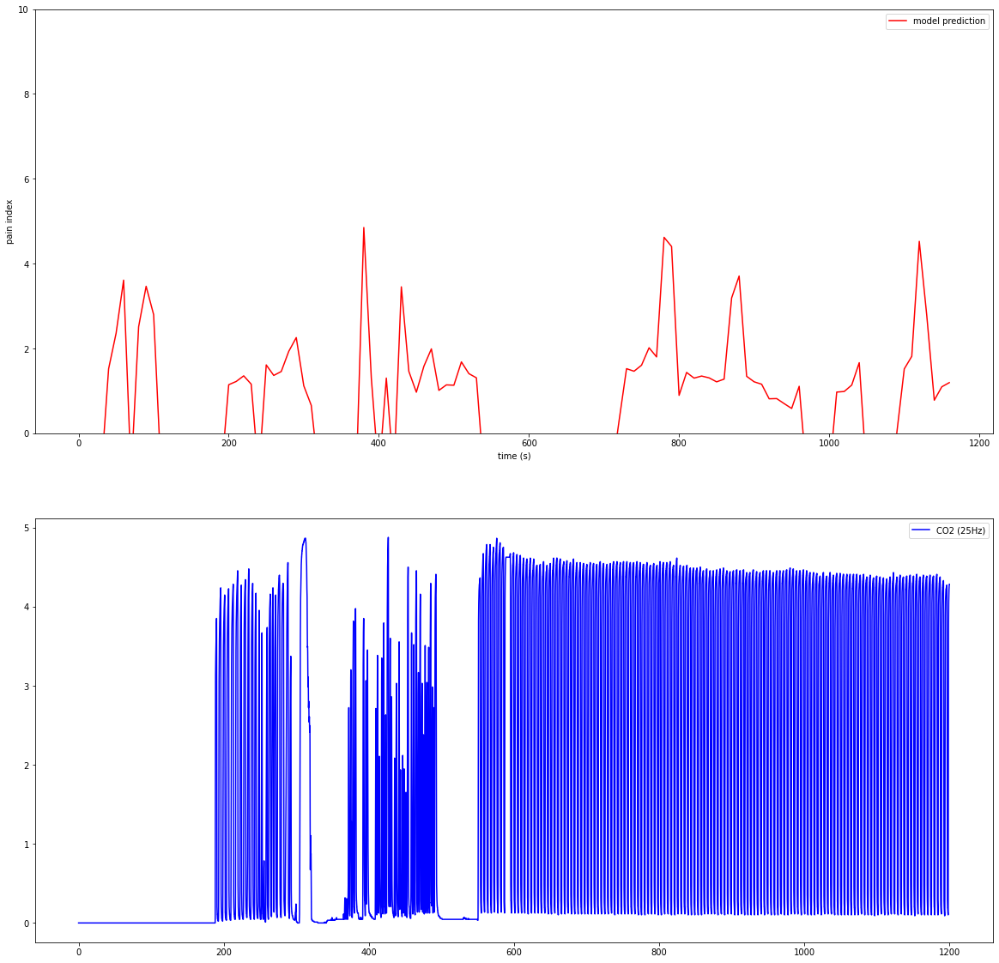

In [72]:
import matplotlib.pyplot as plt


print('idx:',idx, '- ', f_vital)
# CO2
vital_co2 = vitaldb.vital_recs(vital_path+'preop_full_vital/'+f_vital, ['Datex-Ohmeda/CO2'], interval = 1/25).flatten()
vital_co2 = np.array(pd.DataFrame(vital_co2).fillna(method='ffill', axis=0).fillna(method='bfill', axis=0).values.flatten())
if len(vital_co2) <= 1:
    print('no vital co2')
else:
    vital_co2[vital_co2<=0] = 0


# plotting
fig = plt.figure(figsize=(20,20))
ax1 = fig.add_subplot(2,1,1)
ax1.plot([i*10 for i in range(len(x_input))], y, 'r', label='model prediction')
#ax1.set_xticks([i*5 for i in range(len(x_input))])
ax1.set_ylim(0, 10)
ax1.set_ylabel('pain index')
ax1.set_xlabel('time (s)')
ax1.legend(loc='best')


ax2 = fig.add_subplot(2,1,2)
ax2.plot([i/25 for i in range(len(vital_co2))], vital_co2, 'b', label='CO2 (25Hz)')
#ax2.plot([i/250 for i in range(len(ecg_samp))], ecg_samp, 'b', label='ECG (250Hz)')

ax2.legend(loc='best')
#ax2.plot(np.reshape(ecg_samp,[-1,])

plt.show()

## Automoatic

idx: 15,  preop file: E2_190820_075051.vital
no vital co2
idx: 16,  preop file: R2_200710_120753.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...noise out...ppg0.03571428571428571, ecg0.9failed
input 1 ...noise out...ppg0.03225806451612903, ecg0.8888888888888888failed
input 2 ...noise out...ppg0.0, ecg1.0failed
input 3 ...noise out...ppg0.03125, ecg0.9545454545454546failed
input 4 ...noise out...ppg0.25, ecg0.4642857142857143failed
input 5 ...noise out...ppg0.2413793103448276, ecg0.7037037037037037failed
input 6 ...pass
input 7 ...pass
input 8 ...pass
input 9 ...pass
input 10 ...pass
input 11 ...pass
input 12 ...pass
input 13 ...pass
input 14 ...pass
input 15 ...pass
input 16 ...pass
input 17 ...pass
input 18 ...pass
input 19 ...pass
input 20 ...pass
input 21 ...pass
input 22 ...pass
input 23 ...pass
input 24 ...pass
input 25 ...pass
input 26 ...pass
input 27 ...pass
input 28 ...pass
input 29 ...pass
input 30 ...pass
input 

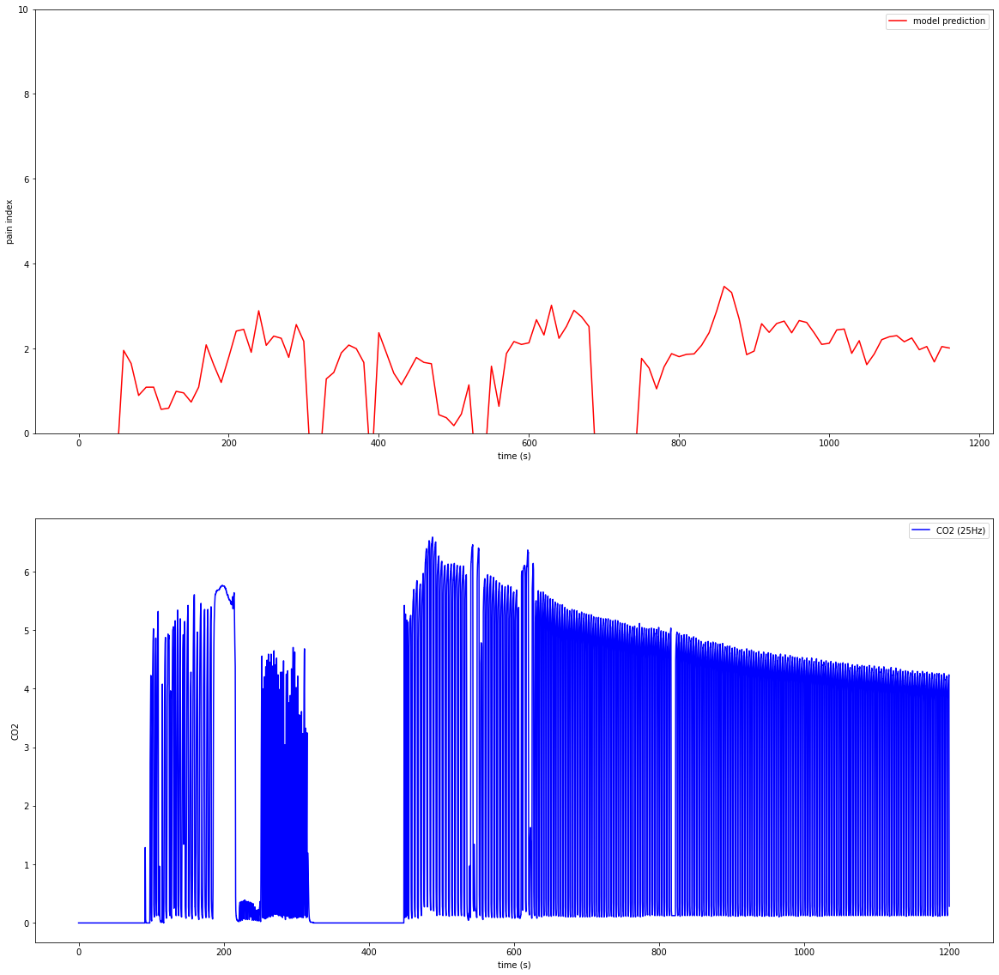

idx: 17,  preop file: E4_200514_151538.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...noise out...ppg0.9230769230769231, ecg1.0failed
input 1 ...noise out...ppg0.9333333333333333, ecg1.0failed
input 2 ...noise out...ppg0.9285714285714286, ecg0.8333333333333334failed
input 3 ...noise out...ppg0.6428571428571429, ecg0.8148148148148148failed
input 4 ...noise out...ppg0.3333333333333333, ecg0.3103448275862069failed
input 5 ...noise out...ppg0.3333333333333333, ecg0.26666666666666666failed
input 6 ...noise out...ppg0.9285714285714286, ecg0.7333333333333333failed
input 7 ...noise out...ppg1.0, ecg0.8709677419354839failed
input 8 ...noise out...ppg1.0, ecg0.7037037037037037failed
input 9 ...noise out...ppg1.0, ecg0.8076923076923077failed
input 10 ...noise out...ppg1.0, ecg0.6551724137931034failed
input 11 ...noise out...ppg0.8666666666666667, ecg0.7037037037037037failed
input 12 ...noise out...ppg0.8, ecg0.6923076923076923failed


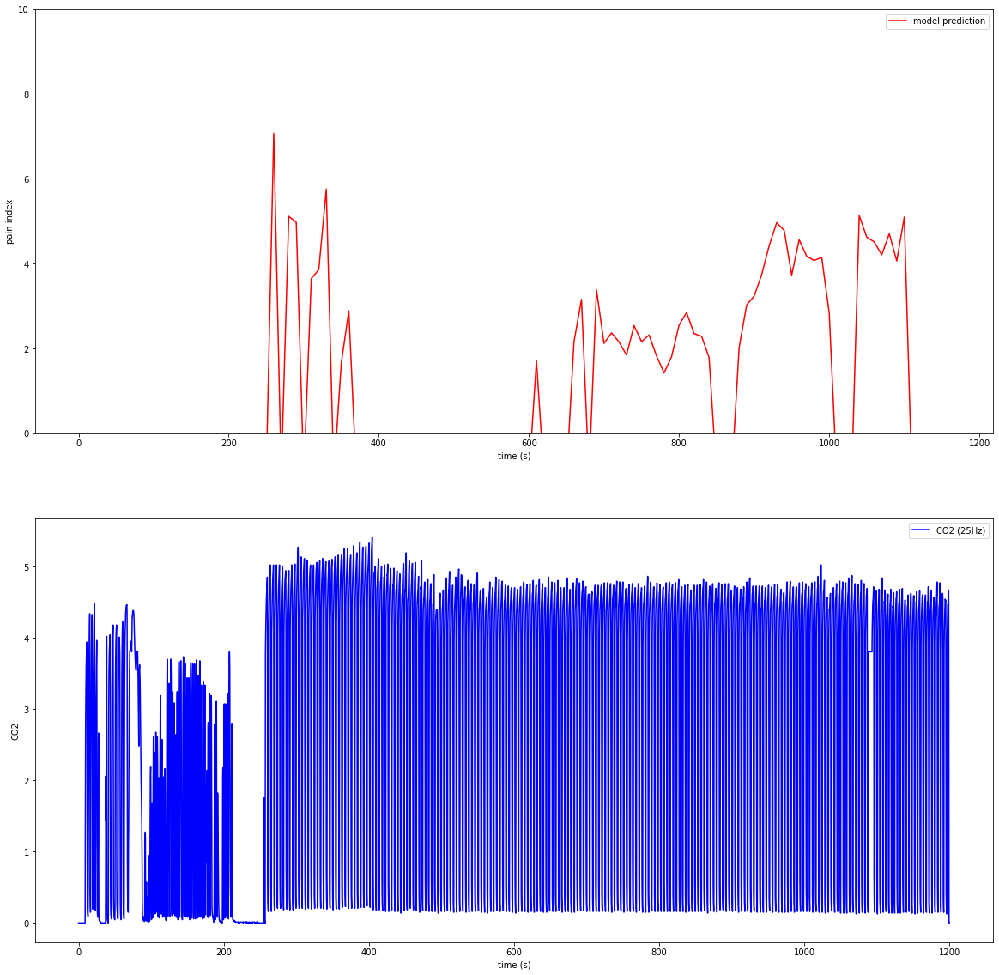

idx: 18,  preop file: D3_190830_140039.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...noise out...ppg0.0, ecg0.7777777777777778failed
input 1 ...noise out...ppg0.05263157894736842, ecg1.0failed
input 2 ...noise out...ppg0.21052631578947367, ecg1.0failed
input 3 ...noise out...ppg0.3888888888888889, ecg0.6666666666666666failed
input 4 ...noise out...ppg0.05263157894736842, ecg1.0failed
input 5 ...noise out...ppg0.0, ecg1.0failed
input 6 ...noise out...ppg0.0, ecg1.0failed
input 7 ...noise out...ppg0.0, ecg1.0failed
input 8 ...noise out...ppg0.0, ecg1.0failed
input 9 ...noise out...ppg0.0, ecg1.0failed
input 10 ...noise out...ppg0.0, ecg1.0failed
input 11 ...noise out...ppg0.0, ecg1.0failed
input 12 ...noise out...ppg0.0, ecg1.0failed
input 13 ...noise out...ppg0.0, ecg1.0failed
input 14 ...noise out...ppg0.0, ecg1.0failed
input 15 ...noise out...ppg0.0, ecg1.0failed
input 16 ...noise out...ppg0.0, ecg1.0failed
input 17 ...n

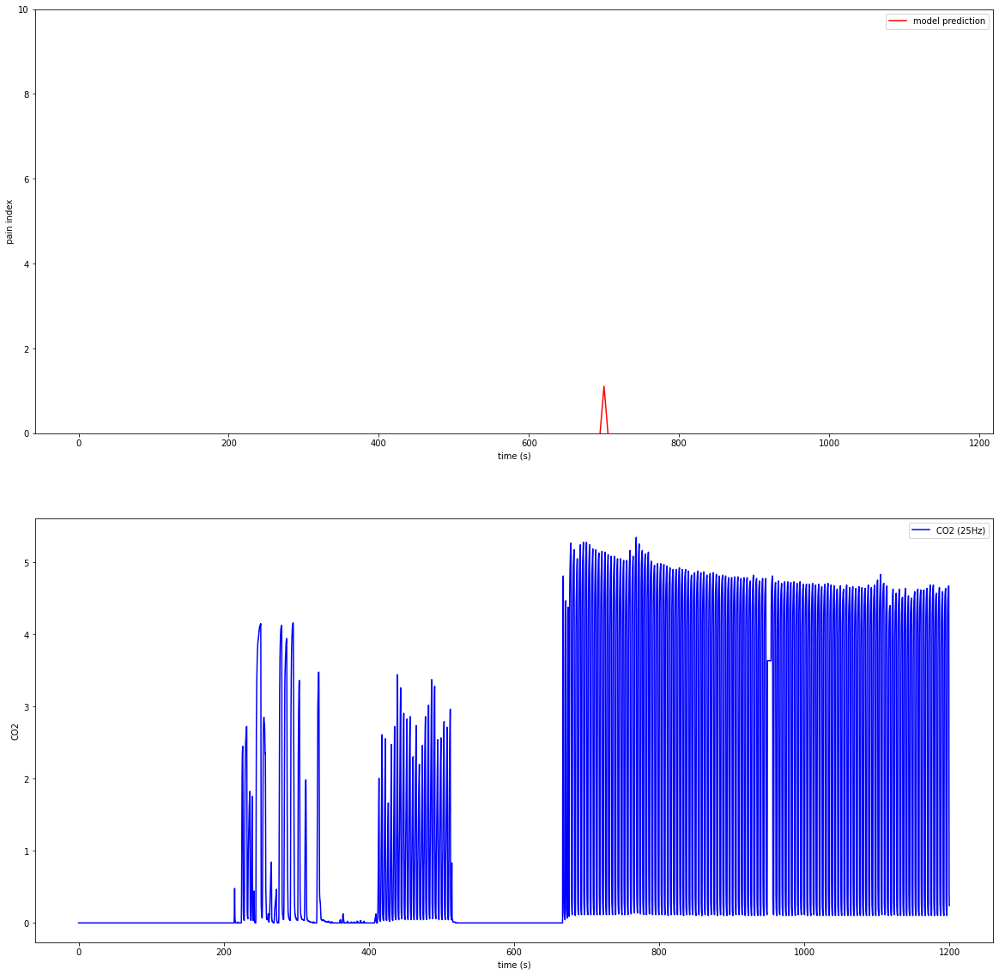

idx: 19,  preop file: R6_200717_075408.vital
no vital co2
idx: 20,  preop file: F3_190517_124228.vital
no vital co2
idx: 21,  preop file: R4_200305_102255.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...nan out...failed
input 1 ...noise out...ppg0.21052631578947367, ecg0.9473684210526315failed
input 2 ...noise out...ppg0.0, ecg0.7failed
input 3 ...noise out...ppg0.15, ecg0.4failed
input 4 ...pass
input 5 ...noise out...ppg0.0, ecg0.5789473684210527failed
input 6 ...noise out...ppg0.0, ecg0.45failed
input 7 ...noise out...ppg0.0, ecg0.5263157894736842failed
input 8 ...noise out...ppg0.0, ecg1.0failed
input 9 ...noise out...ppg0.15, ecg1.0failed
input 10 ...noise out...ppg0.15, ecg0.9473684210526315failed
input 11 ...noise out...ppg0.0, ecg0.5failed
input 12 ...pass
input 13 ...pass
input 14 ...pass
input 15 ...pass
input 16 ...pass
input 17 ...pass
input 18 ...noise out...ppg0.0, ecg0.42105263157894735failed
input 19 ...nois

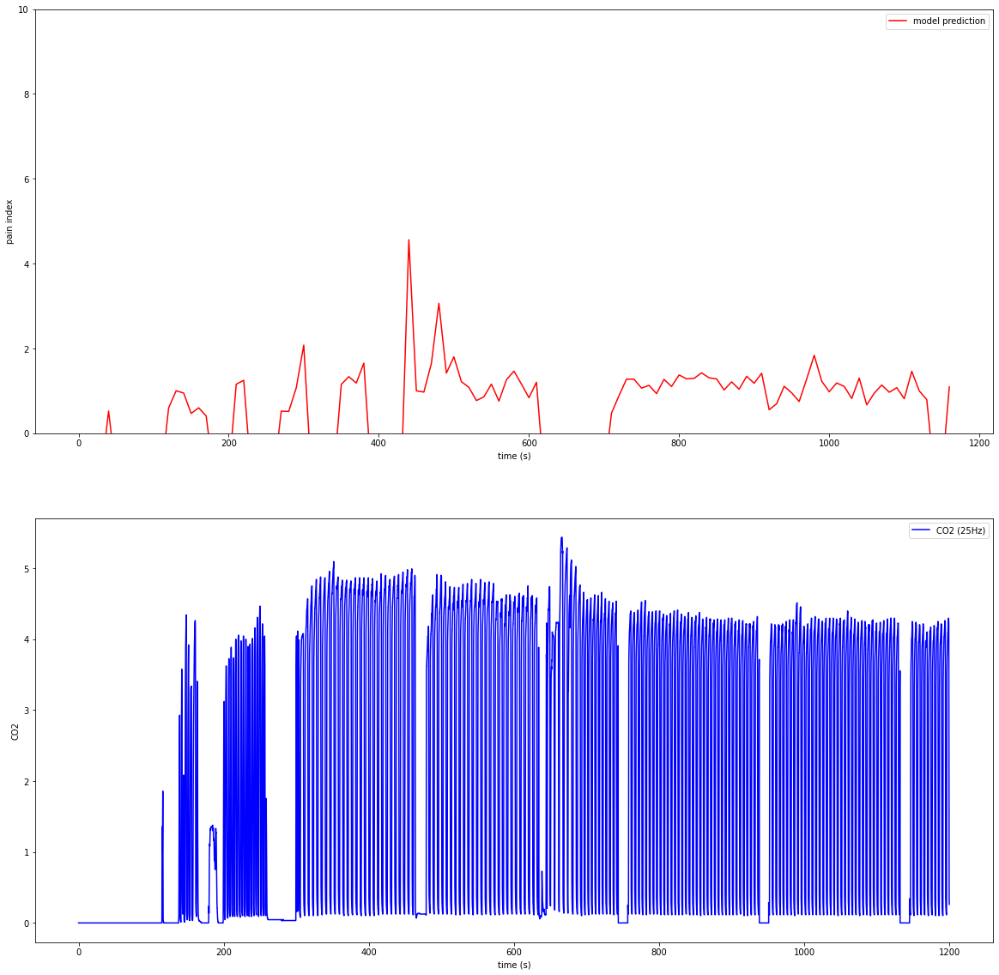

idx: 22,  preop file: R1_200819_121938.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...nan out...failed
input 1 ...noise out...ppg0.08695652173913043, ecg0.9130434782608695failed
input 2 ...noise out...ppg0.18181818181818182, ecg1.0failed
input 3 ...noise out...ppg0.0, ecg0.9523809523809523failed
input 4 ...noise out...ppg0.0, ecg0.8571428571428571failed
input 5 ...noise out...ppg0.0, ecg0.85failed
input 6 ...noise out...ppg0.0, ecg0.8failed
input 7 ...noise out...ppg0.0, ecg0.9047619047619048failed
input 8 ...noise out...ppg0.05263157894736842, ecg0.85failed
input 9 ...noise out...ppg0.2631578947368421, ecg0.8failed
input 10 ...noise out...ppg0.14285714285714285, ecg0.8571428571428571failed
input 11 ...noise out...ppg0.2857142857142857, ecg0.9failed
input 12 ...noise out...ppg0.23809523809523808, ecg0.85failed
input 13 ...noise out...ppg0.2, ecg0.85failed
input 14 ...noise out...ppg0.16666666666666666, ecg0.944444444444444

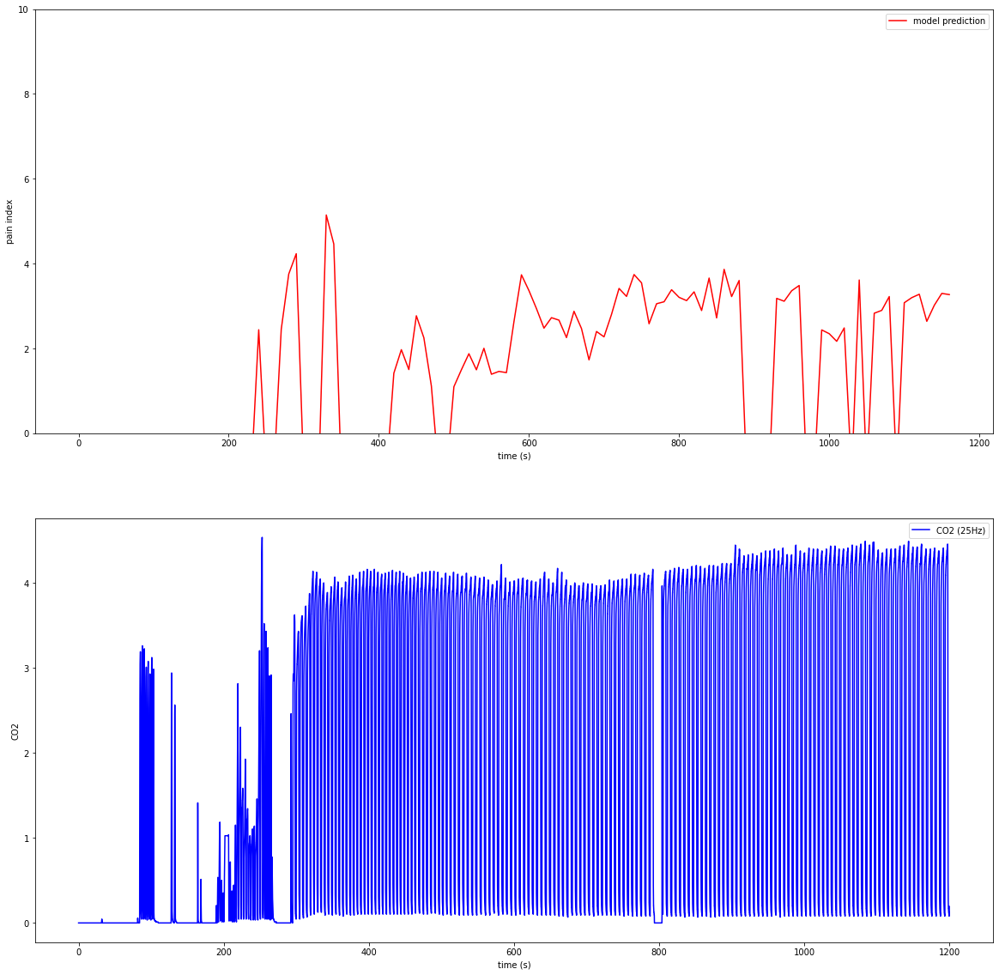

idx: 23,  preop file: D4_200605_124255.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...noise out...ppg1.0, ecg0.08failed
input 1 ...noise out...ppg1.0, ecg0.0failed
input 2 ...noise out...ppg1.0, ecg0.0failed
input 3 ...noise out...ppg0.9444444444444444, ecg0.0failed
input 4 ...pass
input 5 ...pass
input 6 ...pass
input 7 ...noise out...ppg0.3333333333333333, ecg0.06896551724137931failed
input 8 ...pass
input 9 ...pass
input 10 ...pass
input 11 ...noise out...ppg0.12, ecg1.0failed
input 12 ...noise out...ppg0.2, ecg1.0failed
input 13 ...noise out...ppg0.4583333333333333, ecg0.4444444444444444failed
input 14 ...noise out...ppg0.6190476190476191, ecg0.41379310344827586failed
input 15 ...noise out...ppg0.5714285714285714, ecg0.7037037037037037failed
input 16 ...noise out...ppg0.95, ecg0.2857142857142857failed
input 17 ...noise out...ppg0.5294117647058824, ecg0.0failed
input 18 ...noise out...ppg0.7777777777777778, ecg0.0failed

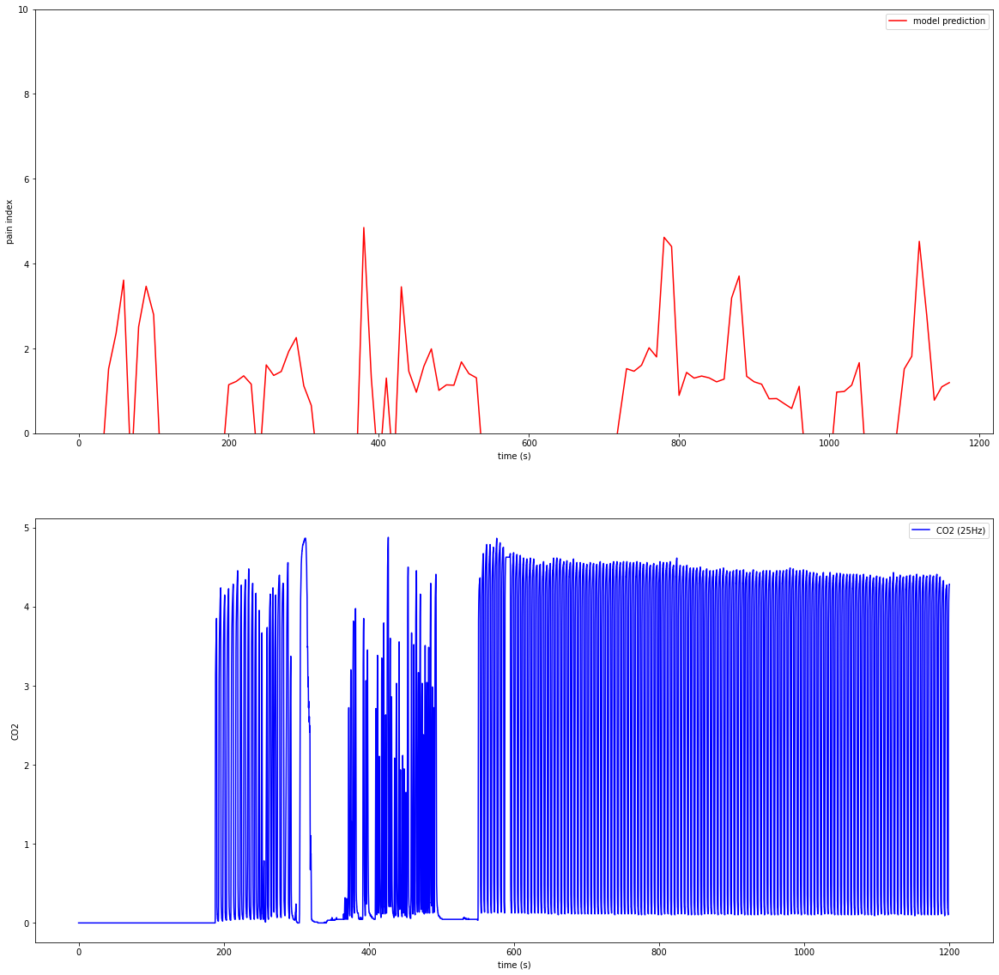

idx: 24,  preop file: E1_201007_162338.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...nan out...failed
input 1 ...noise out...ppg0.5238095238095238, ecg0.9047619047619048failed
input 2 ...noise out...ppg0.2608695652173913, ecg0.6818181818181818failed
input 3 ...noise out...ppg0.08333333333333333, ecg0.75failed
input 4 ...noise out...ppg0.3181818181818182, ecg0.875failed
input 5 ...noise out...ppg0.5714285714285714, ecg0.7083333333333334failed
input 6 ...noise out...ppg0.7894736842105263, ecg0.5652173913043478failed
input 7 ...noise out...ppg0.7647058823529411, ecg0.8947368421052632failed
input 8 ...noise out...ppg0.6111111111111112, ecg0.8888888888888888failed
input 9 ...noise out...ppg0.8421052631578947, ecg0.8947368421052632failed
input 10 ...noise out...ppg0.3157894736842105, ecg0.9473684210526315failed
input 11 ...noise out...ppg0.0, ecg0.8947368421052632failed
input 12 ...noise out...ppg0.0, ecg0.7failed
input 13 ...n

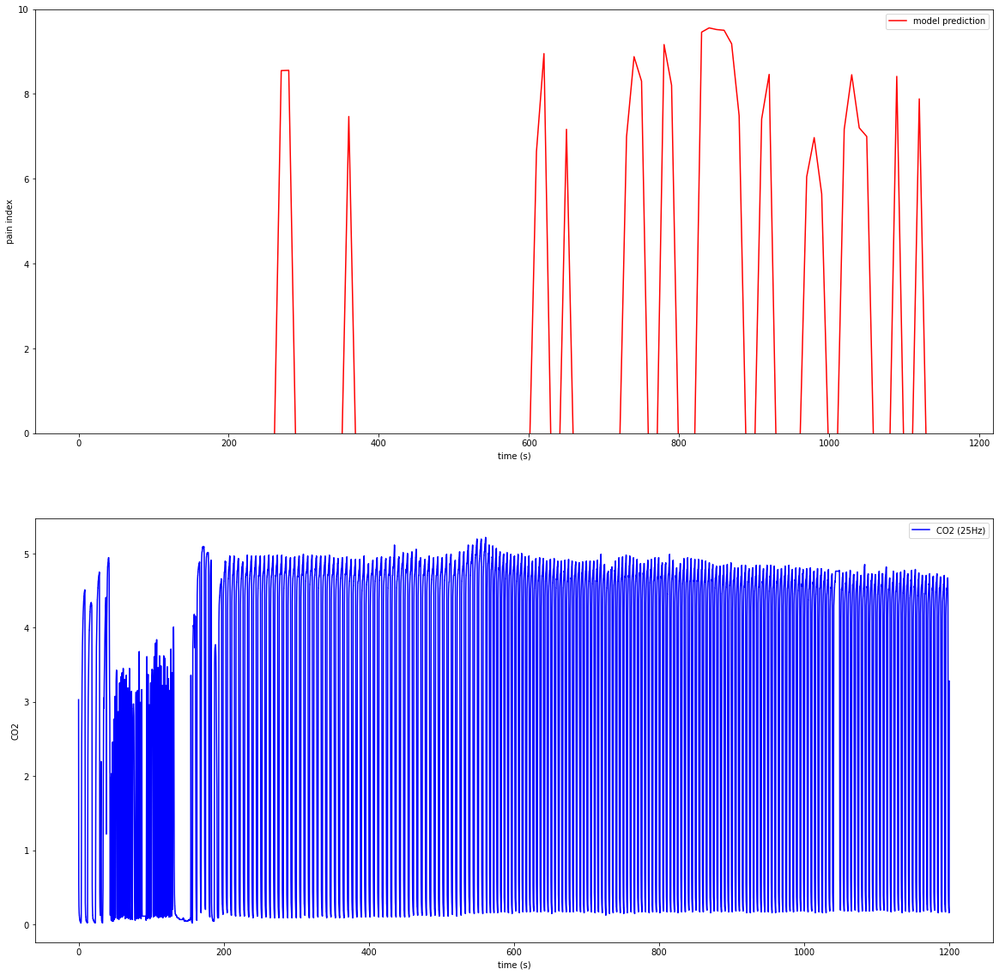

idx: 25,  preop file: D2_200210_155446.vital
no vital co2
idx: 26,  preop file: R1_200806_091357.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...noise out...ppg0.0, ecg1.0failed
input 1 ...pass
input 2 ...pass
input 3 ...noise out...ppg1.0, ecg0.045454545454545456failed
input 4 ...noise out...ppg0.9333333333333333, ecg0.045454545454545456failed
input 5 ...pass
input 6 ...pass
input 7 ...pass
input 8 ...pass
input 9 ...pass
input 10 ...noise out...ppg1.0, ecg0.13636363636363635failed
input 11 ...noise out...ppg1.0, ecg0.0failed
input 12 ...noise out...ppg0.5, ecg0.0failed
input 13 ...noise out...ppg0.4375, ecg0.0failed
input 14 ...pass
input 15 ...pass
input 16 ...pass
input 17 ...pass
input 18 ...pass
input 19 ...pass
input 20 ...pass
input 21 ...pass
input 22 ...pass
input 23 ...pass
input 24 ...pass
input 25 ...pass
input 26 ...pass
input 27 ...pass
input 28 ...pass
input 29 ...pass
input 30 ...pass
input 31 ...pass
input

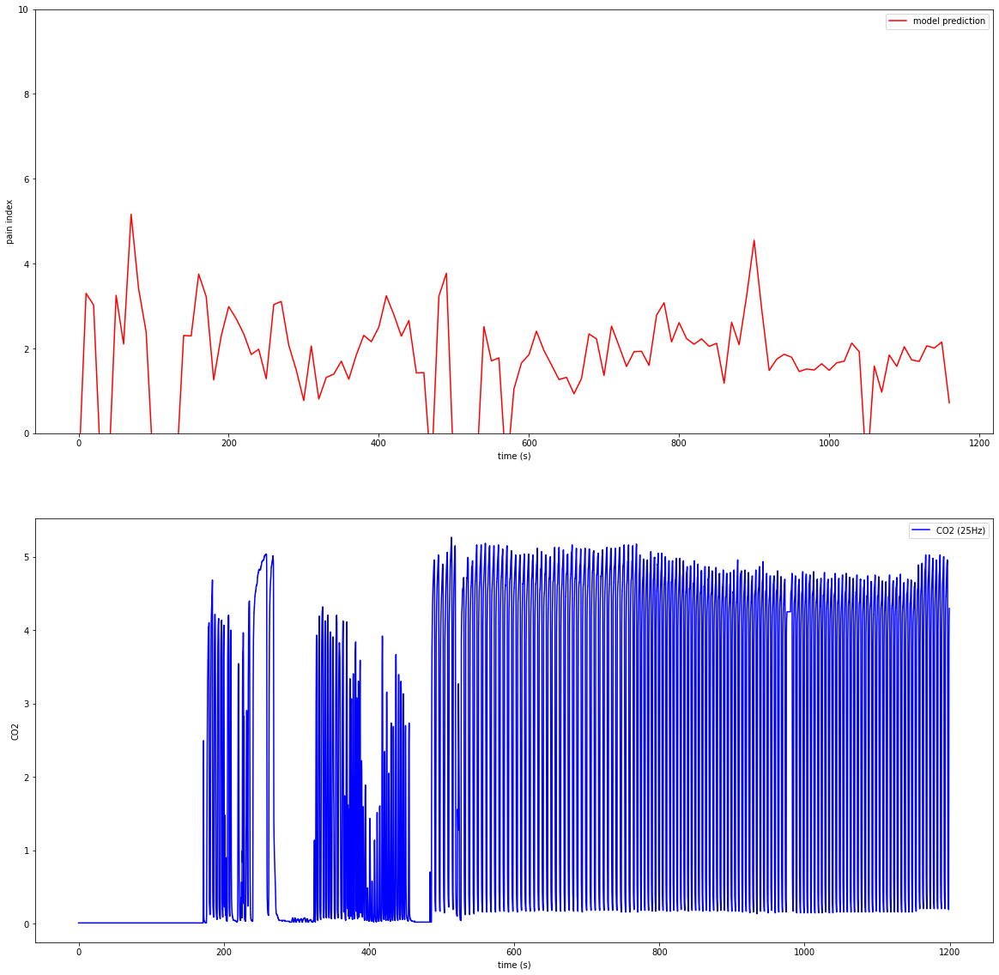

idx: 27,  preop file: R3_200512_075018.vital
no vital co2
idx: 28,  preop file: R2_200221_075003.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...noise out...ppg0.0, ecg1.0failed
input 1 ...noise out...ppg0.0, ecg1.0failed
input 2 ...noise out...ppg0.09090909090909091, ecg1.0failed
input 3 ...noise out...ppg0.3, ecg1.0failed
input 4 ...noise out...ppg0.19047619047619047, ecg1.0failed
input 5 ...noise out...ppg0.041666666666666664, ecg1.0failed
input 6 ...noise out...ppg0.0, ecg1.0failed
input 7 ...noise out...ppg0.0, ecg1.0failed
input 8 ...noise out...ppg0.0, ecg1.0failed
input 9 ...noise out...ppg0.0, ecg1.0failed
input 10 ...noise out...ppg0.0, ecg1.0failed
input 11 ...noise out...ppg0.0, ecg1.0failed
input 12 ...noise out...ppg0.0, ecg1.0failed
input 13 ...noise out...ppg0.0, ecg1.0failed
input 14 ...noise out...ppg0.23809523809523808, ecg1.0failed
input 15 ...noise out...ppg0.35, ecg1.0failed
input 16 ...noise out...ppg

input 54 ...pass
input 55 ...pass
input 56 ...pass
input 57 ...pass
input 58 ...pass
input 59 ...pass
input 60 ...pass
input 61 ...pass
input 62 ...pass
input 63 ...pass
input 64 ...pass
input 65 ...pass
input 66 ...pass
input 67 ...pass
input 68 ...pass
input 69 ...pass
input 70 ...pass
input 71 ...pass
input 72 ...pass
input 73 ...pass
input 74 ...pass
input 75 ...pass
input 76 ...pass
input 77 ...pass
input 78 ...pass
input 79 ...pass
input 80 ...pass
input 81 ...pass
input 82 ...pass
input 83 ...pass
input 84 ...pass
input 85 ...pass
input 86 ...pass
input 87 ...pass
input 88 ...pass
input 89 ...pass
input 90 ...pass
input 91 ...pass
input 92 ...pass
input 93 ...pass
input 94 ...pass
input 95 ...pass
input 96 ...pass
input 97 ...pass
input 98 ...pass
input 99 ...pass
input 100 ...noise out...ppg0.0, ecg0.3888888888888889failed
input 101 ...pass
input 102 ...pass
input 103 ...pass
input 104 ...pass
input 105 ...pass
input 106 ...pass
input 107 ...pass
input 108 ...pass
input 109 ...

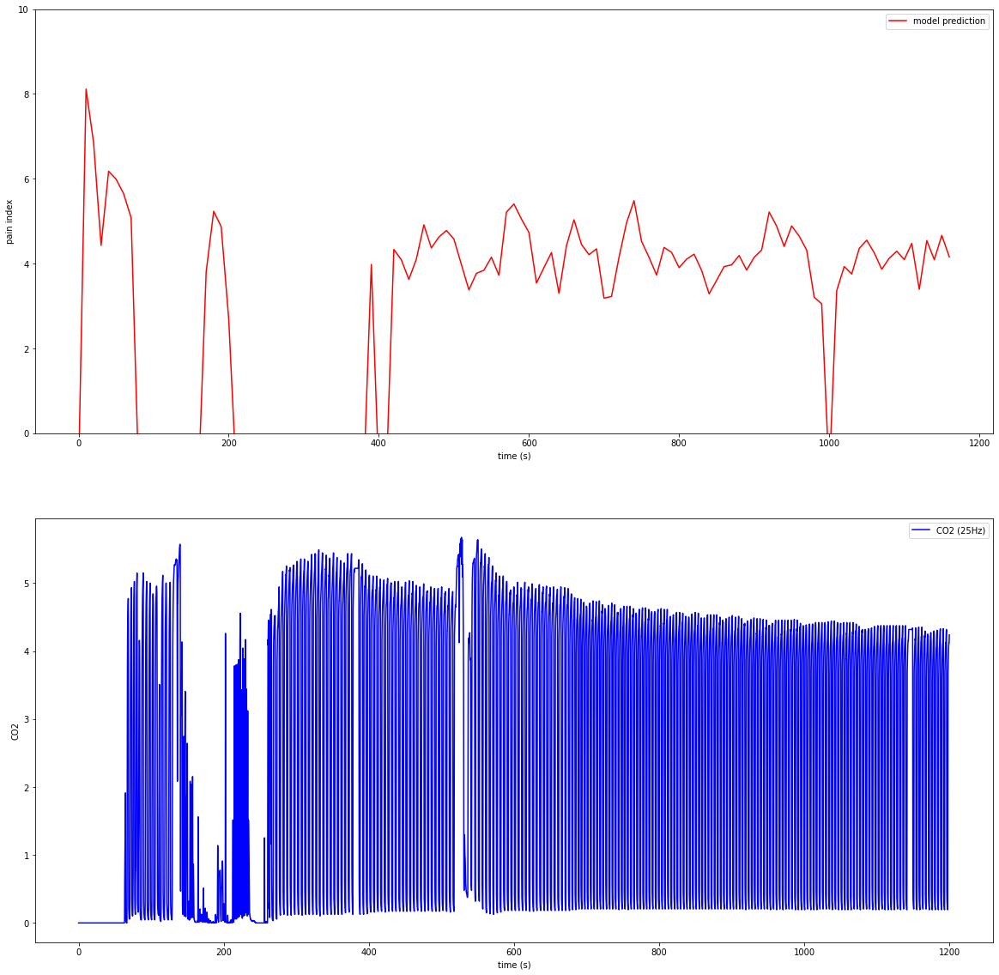

idx: 32,  preop file: R5_200330_075034.vital
no vital co2
idx: 33,  preop file: E4_190514_074705.vital
no vital co2
idx: 34,  preop file: D3_200707_145537.vital
no vital co2
idx: 35,  preop file: R4_200521_075622.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...nan out...failed
input 1 ...noise out...ppg0.0, ecg0.3157894736842105failed
input 2 ...noise out...ppg0.0, ecg0.3157894736842105failed
input 3 ...pass
input 4 ...pass
input 5 ...pass
input 6 ...noise out...ppg0.0, ecg0.35failed
input 7 ...noise out...ppg0.0, ecg0.5failed
input 8 ...pass
input 9 ...pass
input 10 ...pass
input 11 ...pass
input 12 ...pass
input 13 ...noise out...ppg0.0, ecg0.4failed
input 14 ...noise out...ppg0.0, ecg0.375failed
input 15 ...pass
input 16 ...pass
input 17 ...pass
input 18 ...pass
input 19 ...pass
input 20 ...pass
input 21 ...noise out...ppg0.0, ecg0.35714285714285715failed
input 22 ...noise out...ppg0.0, ecg0.35714285714285715failed
input

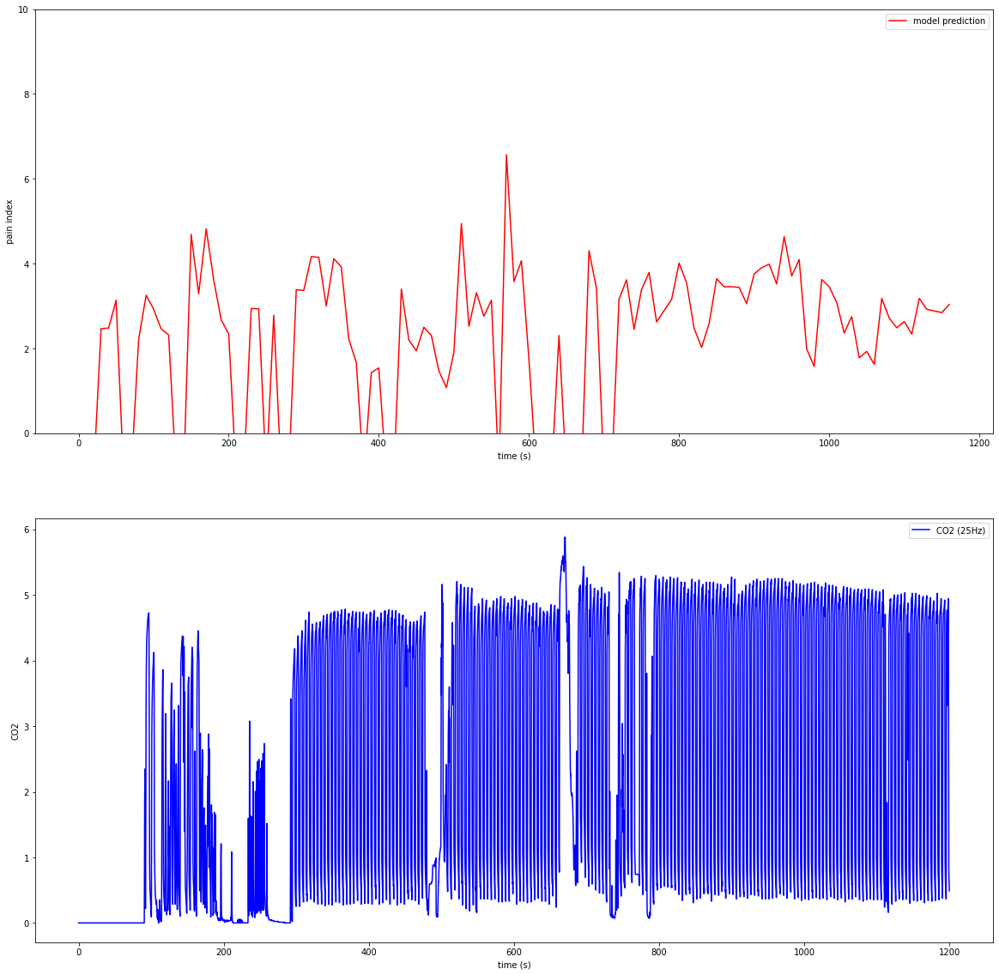

idx: 36,  preop file: E6_200302_132017.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...noise out...ppg0.0, ecg1.0failed
input 1 ...noise out...ppg0.09090909090909091, ecg0.8947368421052632failed
input 2 ...noise out...ppg0.09523809523809523, ecg0.5833333333333334failed
input 3 ...pass
input 4 ...pass
input 5 ...pass
input 6 ...pass
input 7 ...pass
input 8 ...pass
input 9 ...pass
input 10 ...pass
input 11 ...pass
input 12 ...pass
input 13 ...pass
input 14 ...pass
input 15 ...pass
input 16 ...pass
input 17 ...pass
input 18 ...pass
input 19 ...pass
input 20 ...pass
input 21 ...pass
input 22 ...pass
input 23 ...pass
input 24 ...noise out...ppg0.0, ecg0.7727272727272727failed
input 25 ...noise out...ppg0.3888888888888889, ecg0.7692307692307693failed
input 26 ...noise out...ppg0.26666666666666666, ecg0.37037037037037035failed
input 27 ...noise out...ppg1.0, ecg0.34615384615384615failed
input 28 ...noise out...ppg0.238095238095238

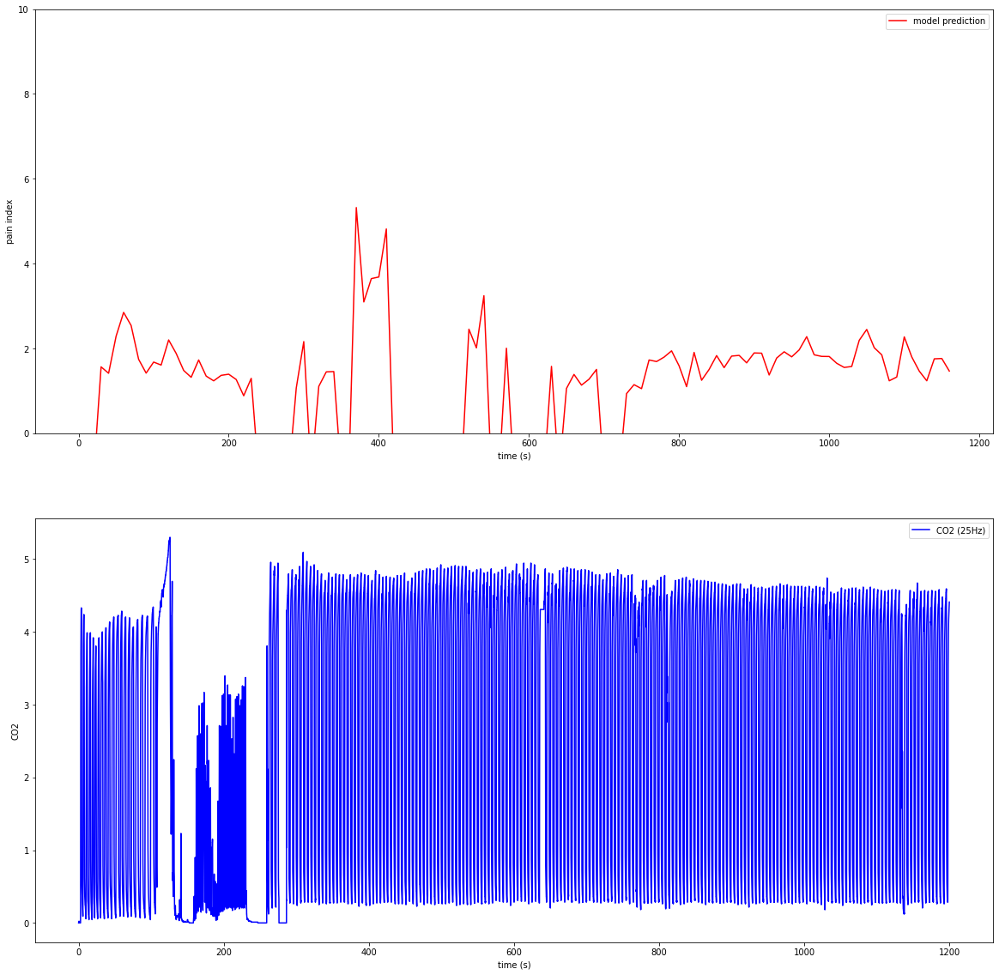

idx: 37,  preop file: C5_190527_204738.vital
no vital co2
idx: 38,  preop file: F3_200103_074501.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...noise out...ppg0.0, ecg1.0failed
input 1 ...noise out...ppg0.0, ecg1.0failed
input 2 ...noise out...ppg0.0, ecg1.0failed
input 3 ...noise out...ppg0.034482758620689655, ecg1.0failed
input 4 ...noise out...ppg0.034482758620689655, ecg1.0failed
input 5 ...noise out...ppg0.0, ecg1.0failed
input 6 ...noise out...ppg0.0, ecg1.0failed
input 7 ...noise out...ppg0.0, ecg1.0failed
input 8 ...noise out...ppg0.0, ecg1.0failed
input 9 ...noise out...ppg0.0, ecg1.0failed
input 10 ...noise out...ppg0.0, ecg1.0failed
input 11 ...noise out...ppg0.0, ecg0.7777777777777778failed
input 12 ...noise out...ppg0.0, ecg1.0failed
input 13 ...noise out...ppg0.0, ecg1.0failed
input 14 ...noise out...ppg0.0, ecg1.0failed
input 15 ...noise out...ppg0.0, ecg1.0failed
input 16 ...noise out...ppg0.0, ecg1.0failed

input 52 ...noise out...ppg0.0, ecg1.0failed
input 53 ...noise out...ppg0.0, ecg1.0failed
input 54 ...noise out...ppg0.0, ecg1.0failed
input 55 ...noise out...ppg0.0, ecg1.0failed
input 56 ...noise out...ppg0.0, ecg1.0failed
input 57 ...noise out...ppg0.0, ecg1.0failed
input 58 ...noise out...ppg0.0, ecg1.0failed
input 59 ...noise out...ppg0.13333333333333333, ecg1.0failed
input 60 ...noise out...ppg0.2, ecg1.0failed
input 61 ...noise out...ppg0.0, ecg1.0failed
input 62 ...noise out...ppg0.26666666666666666, ecg1.0failed
input 63 ...noise out...ppg1.0, ecg1.0failed
input 64 ...noise out...ppg0.21428571428571427, ecg1.0failed
input 65 ...noise out...ppg0.0, ecg1.0failed
input 66 ...noise out...ppg0.0, ecg1.0failed
input 67 ...noise out...ppg0.0, ecg1.0failed
input 68 ...noise out...ppg0.0, ecg1.0failed
input 69 ...noise out...ppg0.0, ecg1.0failed
input 70 ...noise out...ppg0.0, ecg1.0failed
input 71 ...noise out...ppg0.0, ecg1.0failed
input 72 ...noise out...ppg0.0, ecg0.933333333333333

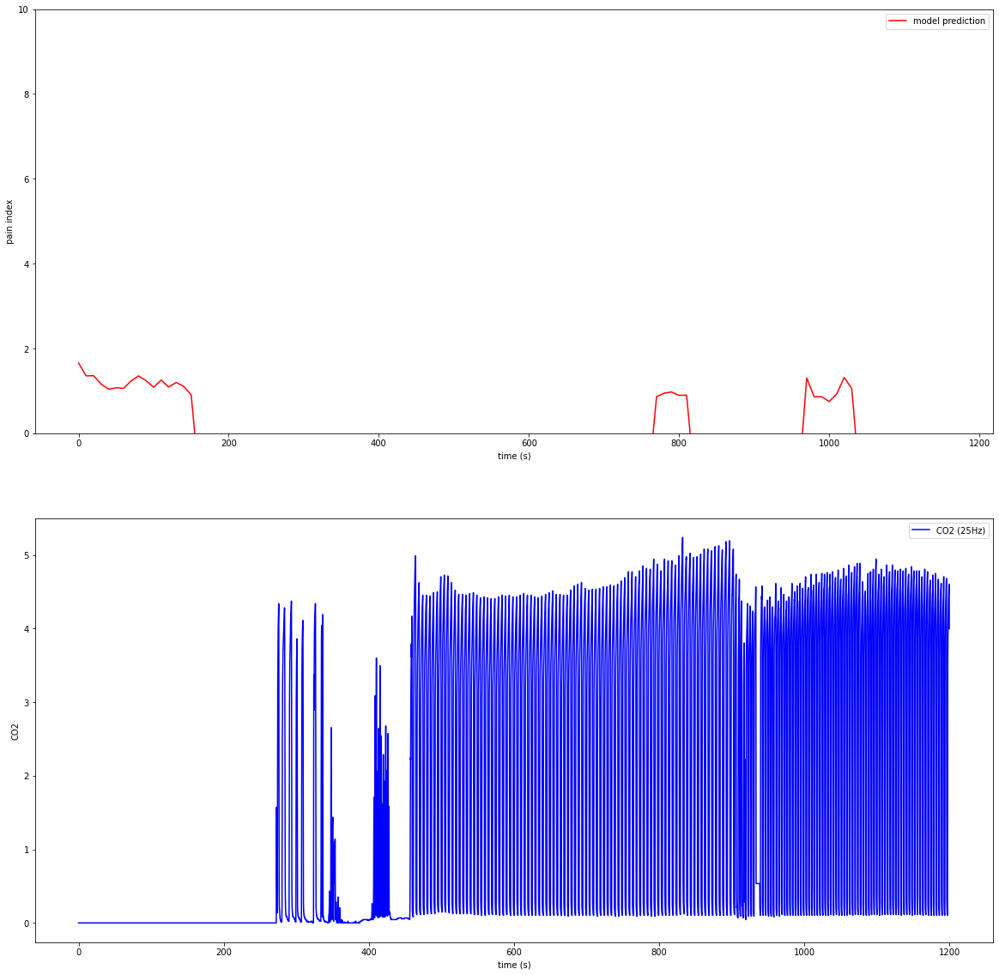

idx: 40,  preop file: E5_200918_113847.vital
no vital co2
idx: 41,  preop file: R10_200528_142351.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...noise out...ppg1.0, ecg1.0failed
input 1 ...noise out...ppg1.0, ecg0.9090909090909091failed
input 2 ...noise out...ppg1.0, ecg0.8461538461538461failed
input 3 ...noise out...ppg0.8823529411764706, ecg0.6428571428571429failed
input 4 ...noise out...ppg1.0, ecg1.0failed
input 5 ...noise out...ppg1.0, ecg1.0failed
input 6 ...noise out...ppg0.8333333333333334, ecg1.0failed
input 7 ...noise out...ppg0.7368421052631579, ecg1.0failed
input 8 ...noise out...ppg0.3181818181818182, ecg1.0failed
input 9 ...noise out...ppg0.17391304347826086, ecg0.9583333333333334failed
input 10 ...noise out...ppg0.12, ecg0.95failed
input 11 ...noise out...ppg0.038461538461538464, ecg0.8421052631578947failed
input 12 ...pass
input 13 ...pass
input 14 ...noise out...ppg0.0, ecg0.3076923076923077failed
input 15

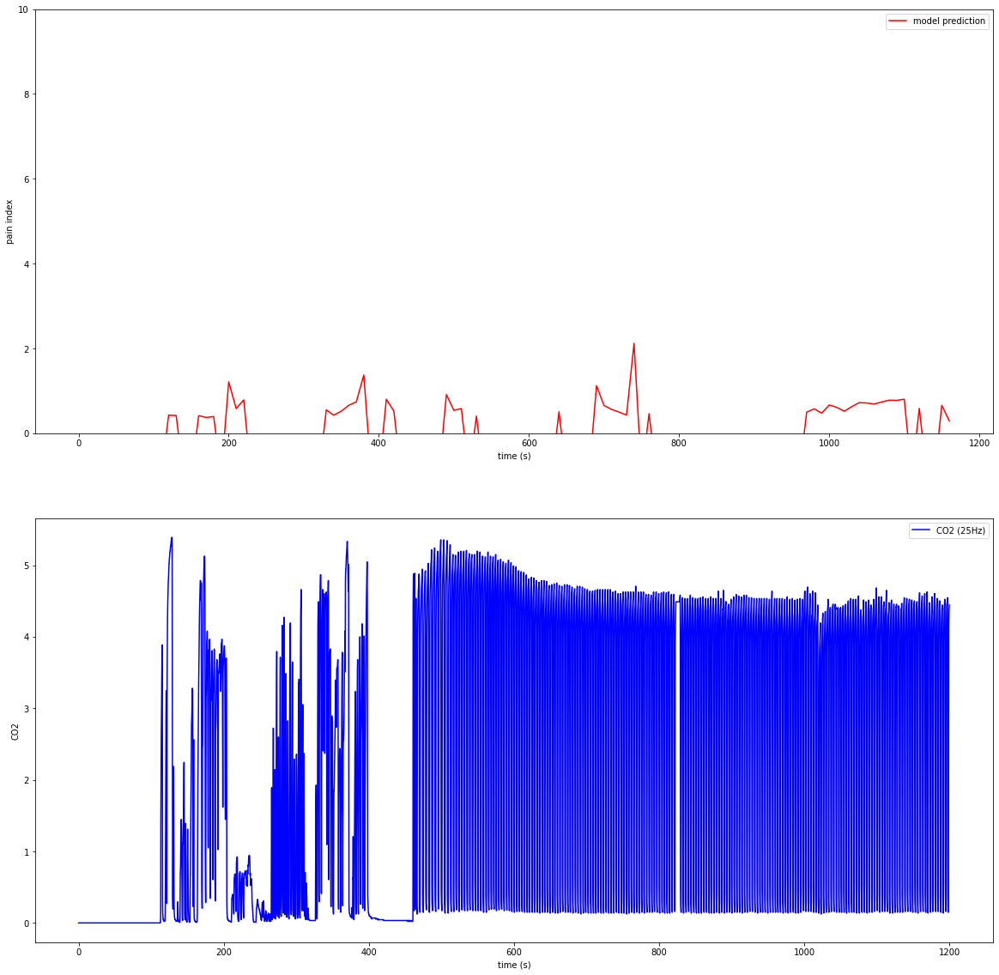

idx: 42,  preop file: B4_201027_145843.vital
existing CO2 curve...no ppg
idx: 43,  preop file: D1_200108_090959.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...noise out...ppg0.19047619047619047, ecg1.0failed
input 1 ...noise out...ppg0.16, ecg1.0failed
input 2 ...noise out...ppg0.08695652173913043, ecg1.0failed
input 3 ...noise out...ppg0.08, ecg1.0failed
input 4 ...noise out...ppg0.07142857142857142, ecg1.0failed
input 5 ...noise out...ppg0.0, ecg1.0failed
input 6 ...noise out...ppg0.0, ecg1.0failed
input 7 ...noise out...ppg0.0, ecg1.0failed
input 8 ...noise out...ppg0.0, ecg0.9failed
input 9 ...noise out...ppg0.0, ecg0.8947368421052632failed
input 10 ...noise out...ppg0.06896551724137931, ecg1.0failed
input 11 ...noise out...ppg0.06666666666666667, ecg0.5238095238095238failed
input 12 ...noise out...ppg0.0, ecg0.5454545454545454failed
input 13 ...noise out...ppg0.0, ecg1.0failed
input 14 ...noise out...ppg0.0, ecg0.6666

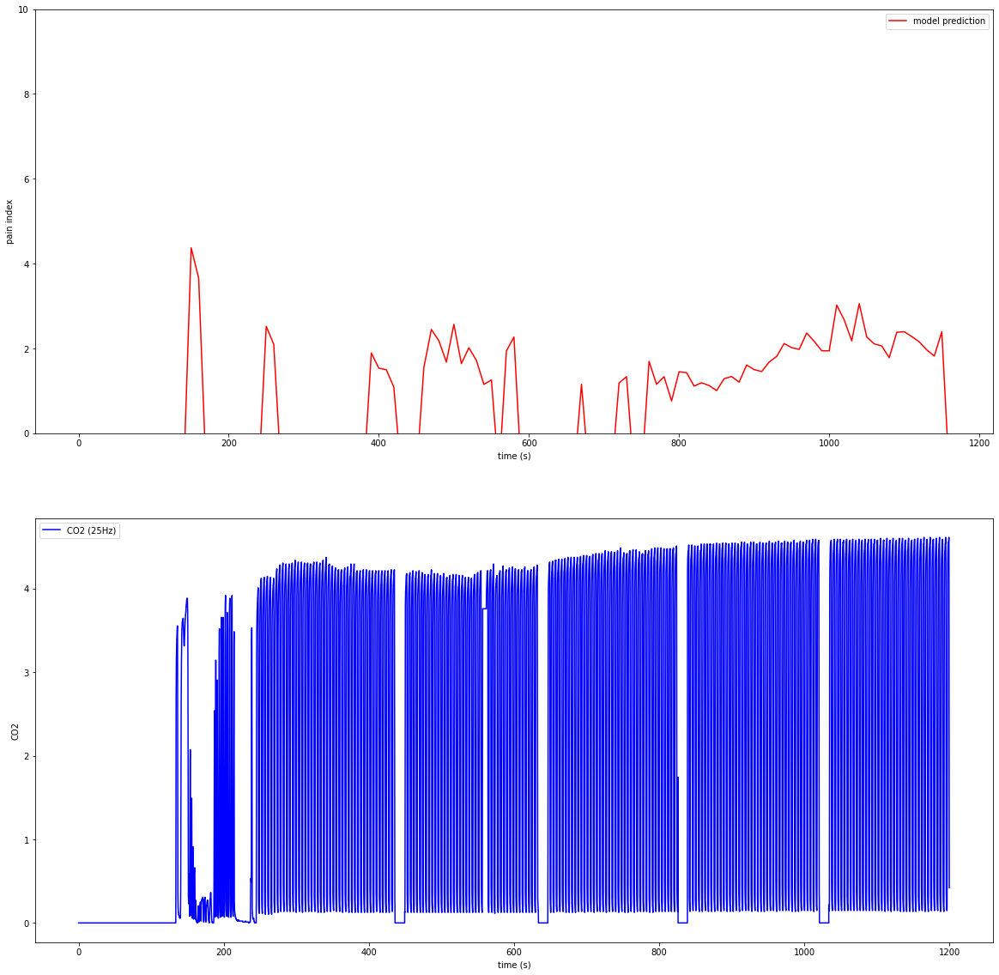

idx: 44,  preop file: E4_190617_084940.vital
no vital co2
idx: 45,  preop file: E2_190409_184648.vital
no vital co2
idx: 46,  preop file: D1_200318_073928.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...nan out...failed
input 1 ...noise out...ppg1.0, ecg0.0failed
input 2 ...noise out...ppg1.0, ecg0.037037037037037035failed
input 3 ...noise out...ppg1.0, ecg0.07407407407407407failed
input 4 ...noise out...ppg1.0, ecg0.21428571428571427failed
input 5 ...noise out...ppg0.9565217391304348, ecg0.14814814814814814failed
input 6 ...noise out...ppg0.9583333333333334, ecg0.041666666666666664failed
input 7 ...noise out...ppg0.8, ecg0.041666666666666664failed
input 8 ...noise out...ppg0.9473684210526315, ecg0.08695652173913043failed
input 9 ...noise out...ppg1.0, ecg0.08695652173913043failed
input 10 ...noise out...ppg1.0, ecg0.04failed
input 11 ...noise out...ppg0.8181818181818182, ecg0.041666666666666664failed
input 12 ...noise out.

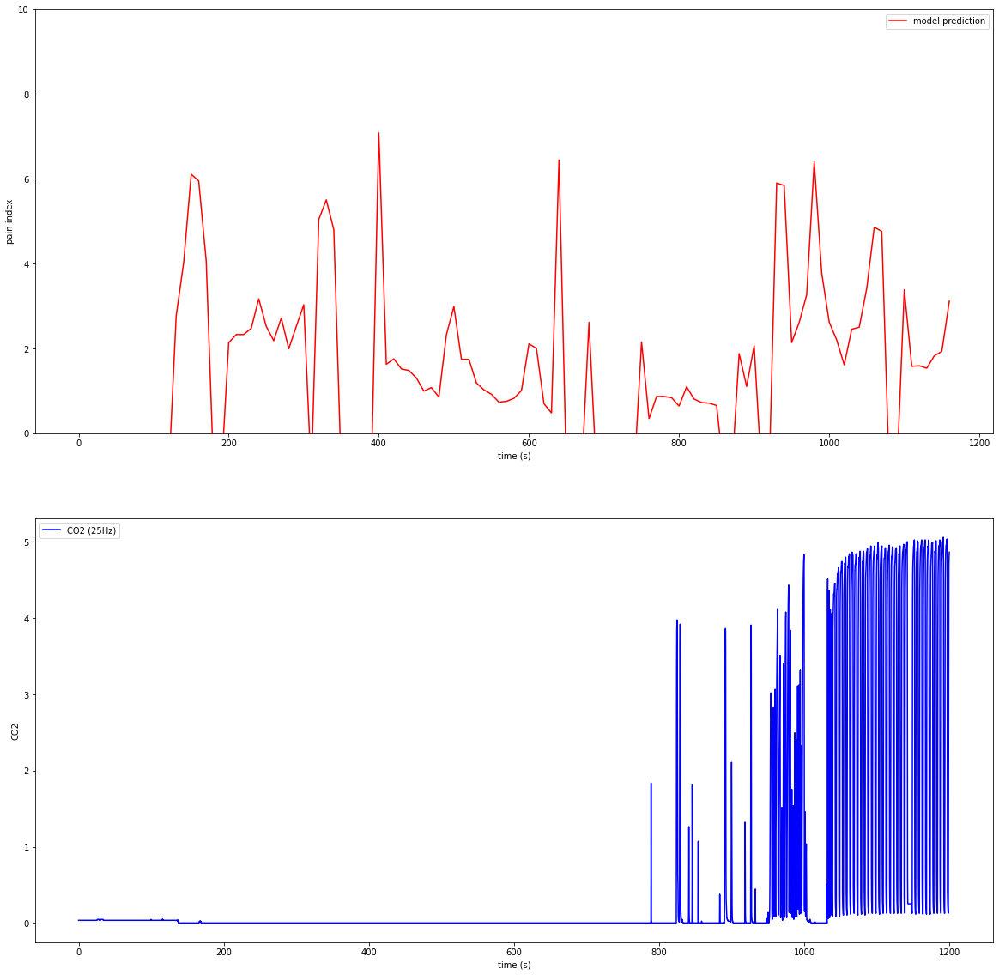

idx: 47,  preop file: R3_200618_090607.vital
no vital co2
idx: 48,  preop file: E5_190503_101241.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...peak out...failed
input 1 ...peak out...failed
input 2 ...peak out...failed
input 3 ...noise out...ppg0.3076923076923077, ecg0.03571428571428571failed
input 4 ...pass
input 5 ...pass
input 6 ...pass
input 7 ...pass
input 8 ...pass
input 9 ...pass
input 10 ...pass
input 11 ...pass
input 12 ...pass
input 13 ...pass
input 14 ...pass
input 15 ...pass
input 16 ...pass
input 17 ...pass
input 18 ...noise out...ppg0.8181818181818182, ecg0.0failed
input 19 ...noise out...ppg0.8461538461538461, ecg0.0failed
input 20 ...noise out...ppg0.5555555555555556, ecg0.0failed
input 21 ...pass
input 22 ...pass
input 23 ...pass
input 24 ...pass
input 25 ...pass
input 26 ...pass
input 27 ...pass
input 28 ...pass
input 29 ...pass
input 30 ...pass
input 31 ...pass
input 32 ...pass
input 33 ...pass
input 34

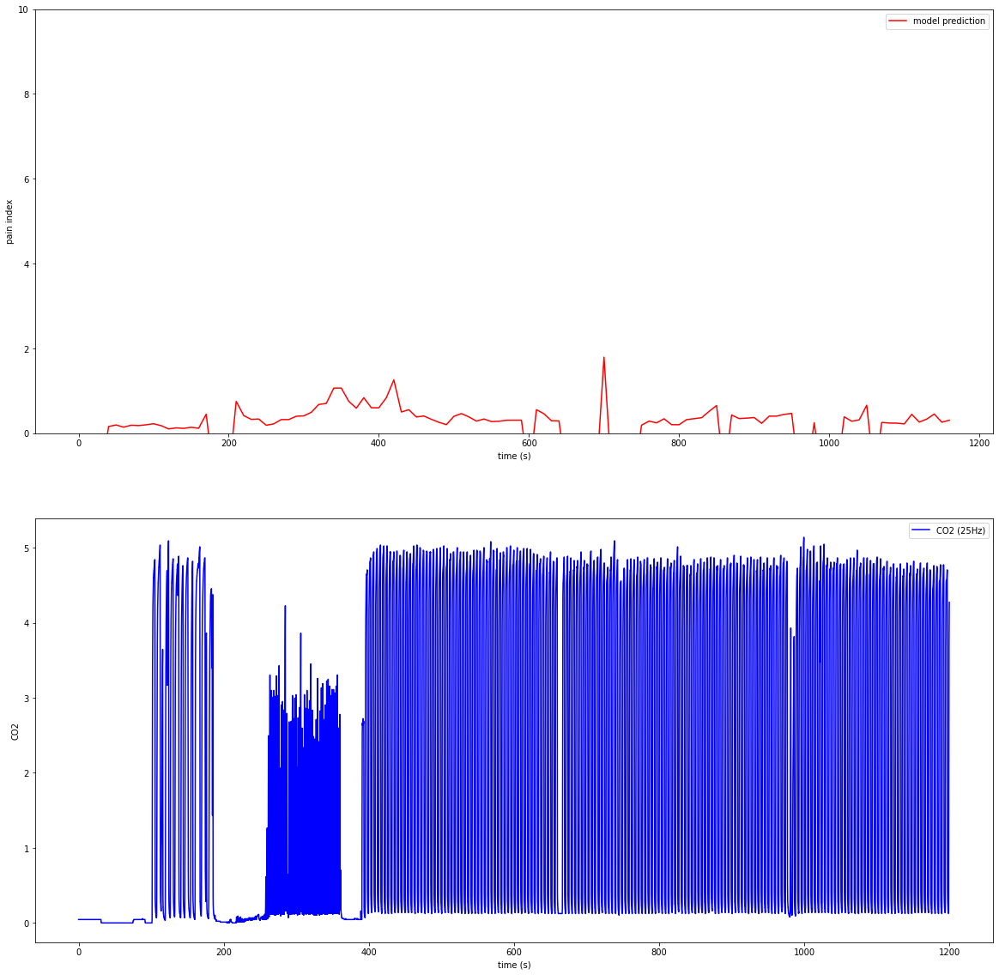

idx: 49,  preop file: A5_200115_153255.vital
no vital co2
idx: 50,  preop file: R10_200130_133812.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...nan out...failed
input 1 ...noise out...ppg0.6363636363636364, ecg1.0failed
input 2 ...noise out...ppg0.36363636363636365, ecg0.9565217391304348failed
input 3 ...noise out...ppg0.1, ecg1.0failed
input 4 ...noise out...ppg0.0, ecg0.8260869565217391failed
input 5 ...noise out...ppg0.0, ecg0.5714285714285714failed
input 6 ...noise out...ppg0.0, ecg0.55failed
input 7 ...peak out...failed
input 8 ...noise out...ppg1.0, ecg0.6111111111111112failed
input 9 ...noise out...ppg0.23076923076923078, ecg1.0failed
input 10 ...noise out...ppg0.0, ecg1.0failed
input 11 ...noise out...ppg0.2, ecg1.0failed
input 12 ...noise out...ppg0.21428571428571427, ecg1.0failed
input 13 ...noise out...ppg0.15384615384615385, ecg1.0failed
input 14 ...noise out...ppg0.38461538461538464, ecg1.0failed
input 15 ...

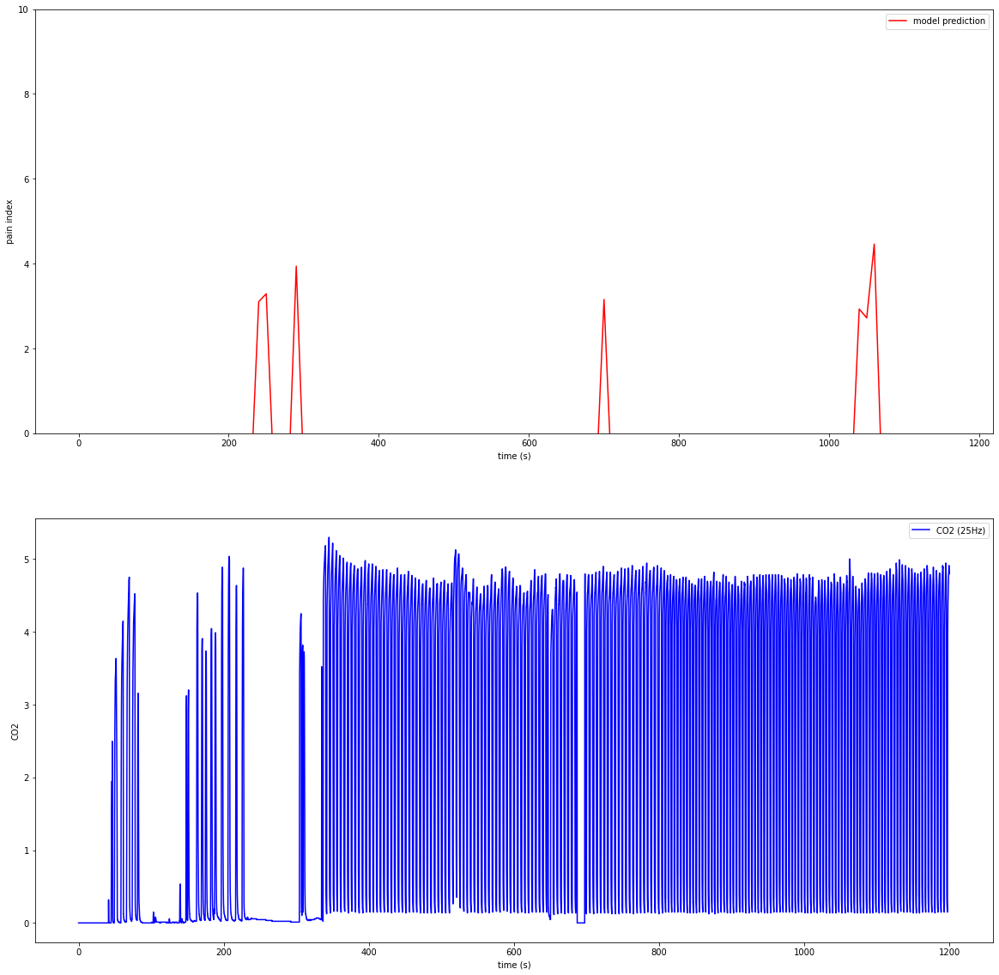

idx: 51,  preop file: C4_200205_200101.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...nan out...failed
input 1 ...noise out...ppg0.17857142857142858, ecg0.4827586206896552failed
input 2 ...noise out...ppg0.034482758620689655, ecg0.6785714285714286failed
input 3 ...noise out...ppg0.07407407407407407, ecg0.4444444444444444failed
input 4 ...pass
input 5 ...noise out...ppg0.28, ecg0.35714285714285715failed
input 6 ...noise out...ppg0.2222222222222222, ecg0.5714285714285714failed
input 7 ...noise out...ppg0.0, ecg0.32142857142857145failed
input 8 ...pass
input 9 ...pass
input 10 ...pass
input 11 ...noise out...ppg0.034482758620689655, ecg0.3793103448275862failed
input 12 ...noise out...ppg0.0, ecg0.5failed
input 13 ...pass
input 14 ...pass
input 15 ...pass
input 16 ...pass
input 17 ...noise out...ppg0.10714285714285714, ecg0.3103448275862069failed
input 18 ...noise out...ppg0.18518518518518517, ecg0.32142857142857145failed
inpu

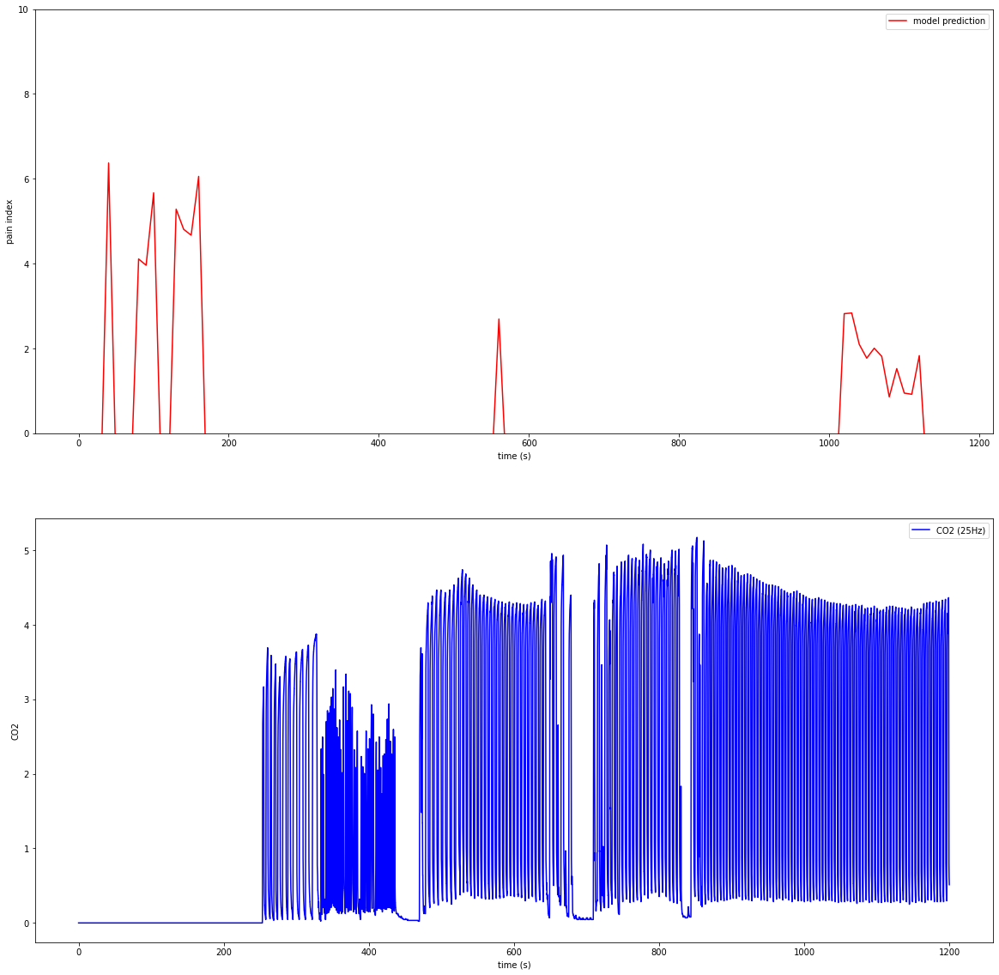

idx: 52,  preop file: C2_200812_132618.vital
no vital co2
idx: 53,  preop file: E3_200630_075029.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...noise out...ppg0.034482758620689655, ecg0.6923076923076923failed
input 1 ...noise out...ppg0.0, ecg0.8333333333333334failed
input 2 ...noise out...ppg0.14285714285714285, ecg0.3333333333333333failed
input 3 ...pass
input 4 ...pass
input 5 ...pass
input 6 ...pass
input 7 ...pass
input 8 ...pass
input 9 ...noise out...ppg0.0, ecg1.0failed
input 10 ...noise out...ppg0.04, ecg1.0failed
input 11 ...noise out...ppg0.037037037037037035, ecg1.0failed
input 12 ...noise out...ppg0.03571428571428571, ecg1.0failed
input 13 ...noise out...ppg0.0, ecg0.95failed
input 14 ...noise out...ppg0.0, ecg0.45failed
input 15 ...pass
input 16 ...pass
input 17 ...pass
input 18 ...pass
input 19 ...pass
input 20 ...pass
input 21 ...pass
input 22 ...pass
input 23 ...pass
input 24 ...pass
input 25 ...pass
input

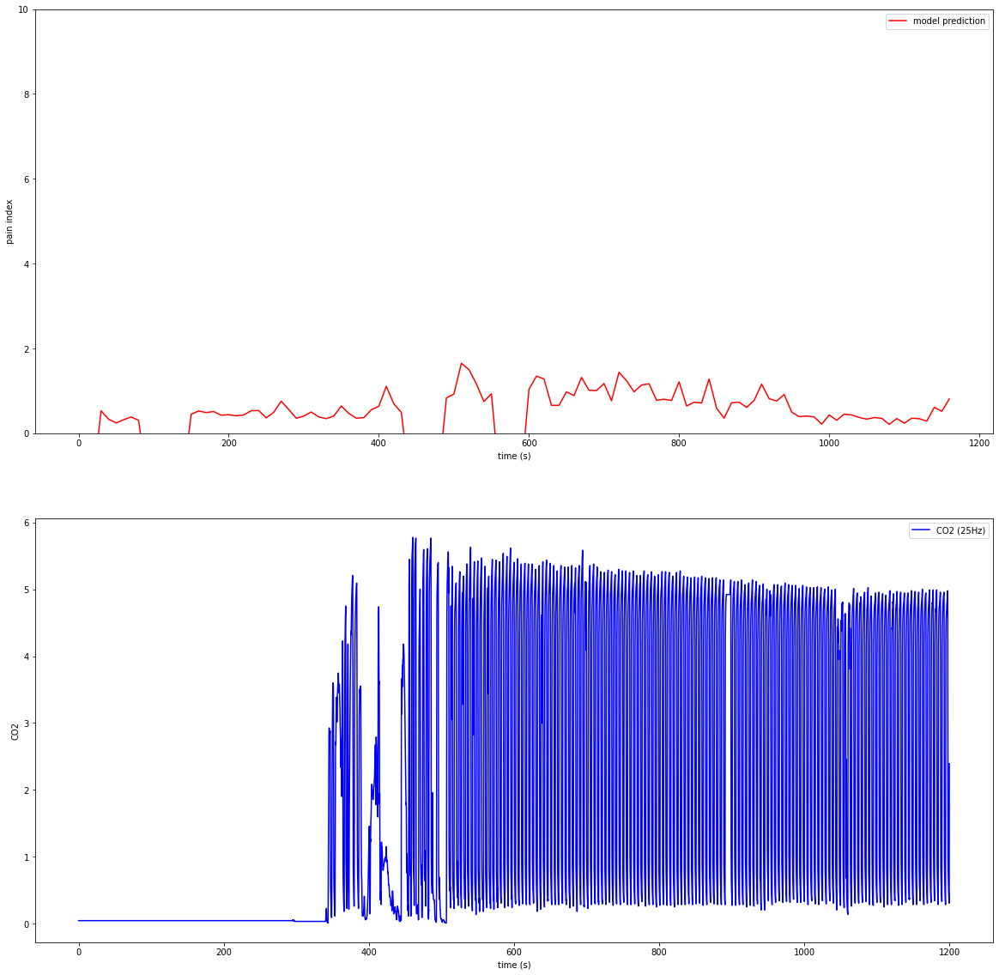

idx: 54,  preop file: R1_201006_152528.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...nan out...failed
input 1 ...noise out...ppg0.0, ecg0.7391304347826086failed
input 2 ...noise out...ppg0.0, ecg0.6failed
input 3 ...pass
input 4 ...noise out...ppg0.13636363636363635, ecg0.4166666666666667failed
input 5 ...noise out...ppg0.34782608695652173, ecg0.2962962962962963failed
input 6 ...pass
input 7 ...noise out...ppg0.4090909090909091, ecg0.6551724137931034failed
input 8 ...noise out...ppg0.8823529411764706, ecg0.6129032258064516failed
input 9 ...noise out...ppg0.8235294117647058, ecg0.65625failed
input 10 ...noise out...ppg1.0, ecg0.6875failed
input 11 ...noise out...ppg1.0, ecg0.4411764705882353failed
input 12 ...noise out...ppg0.3333333333333333, ecg0.4857142857142857failed
input 13 ...noise out...ppg0.75, ecg0.5588235294117647failed
input 14 ...noise out...ppg0.9333333333333333, ecg0.24242424242424243failed
input 15 ...noise

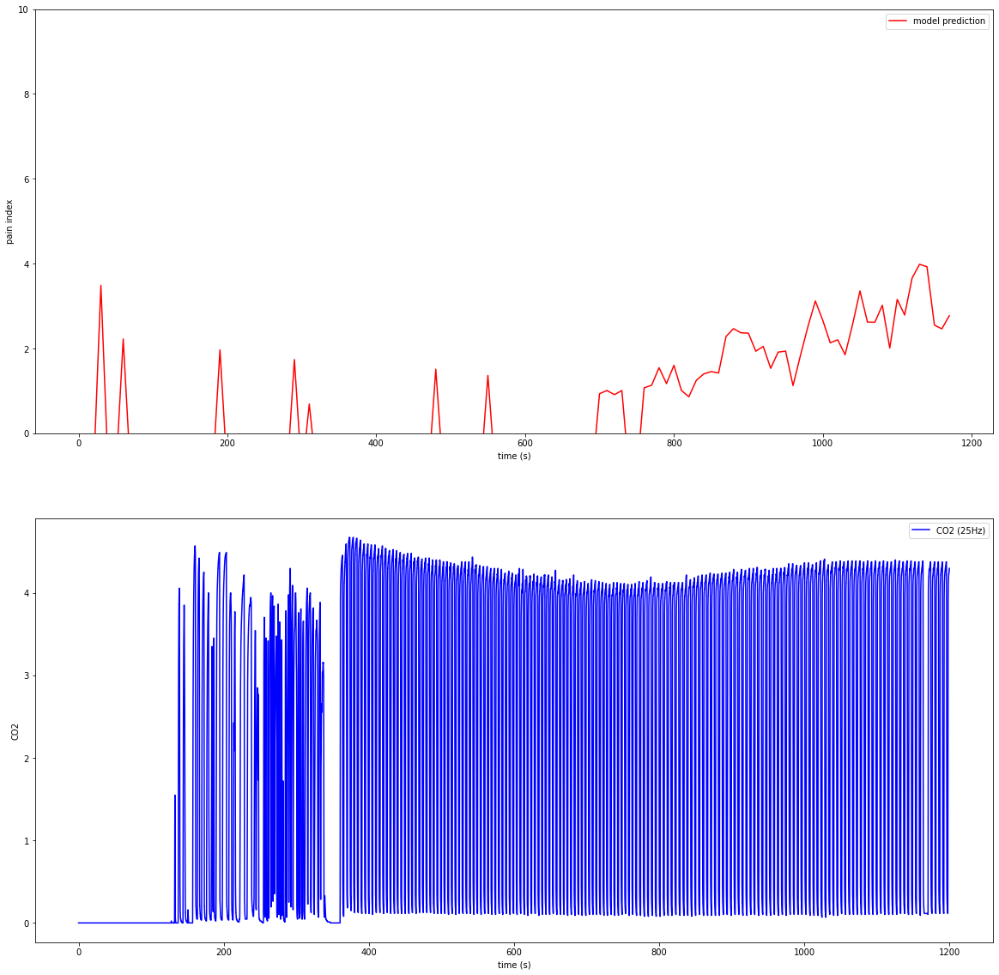

idx: 55,  preop file: R4_200219_144430.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...noise out...ppg0.05555555555555555, ecg0.8333333333333334failed
input 1 ...noise out...ppg0.0, ecg1.0failed
input 2 ...noise out...ppg0.08695652173913043, ecg0.8235294117647058failed
input 3 ...noise out...ppg0.23809523809523808, ecg0.391304347826087failed
input 4 ...noise out...ppg0.6470588235294118, ecg0.4230769230769231failed
input 5 ...pass
input 6 ...pass
input 7 ...pass
input 8 ...pass
input 9 ...pass
input 10 ...pass
input 11 ...pass
input 12 ...pass
input 13 ...pass
input 14 ...pass
input 15 ...pass
input 16 ...pass
input 17 ...pass
input 18 ...pass
input 19 ...pass
input 20 ...pass
input 21 ...pass
input 22 ...pass
input 23 ...pass
input 24 ...pass
input 25 ...pass
input 26 ...pass
input 27 ...pass
input 28 ...pass
input 29 ...pass
input 30 ...pass
input 31 ...pass
input 32 ...pass
input 33 ...pass
input 34 ...pass
input 35 ...no

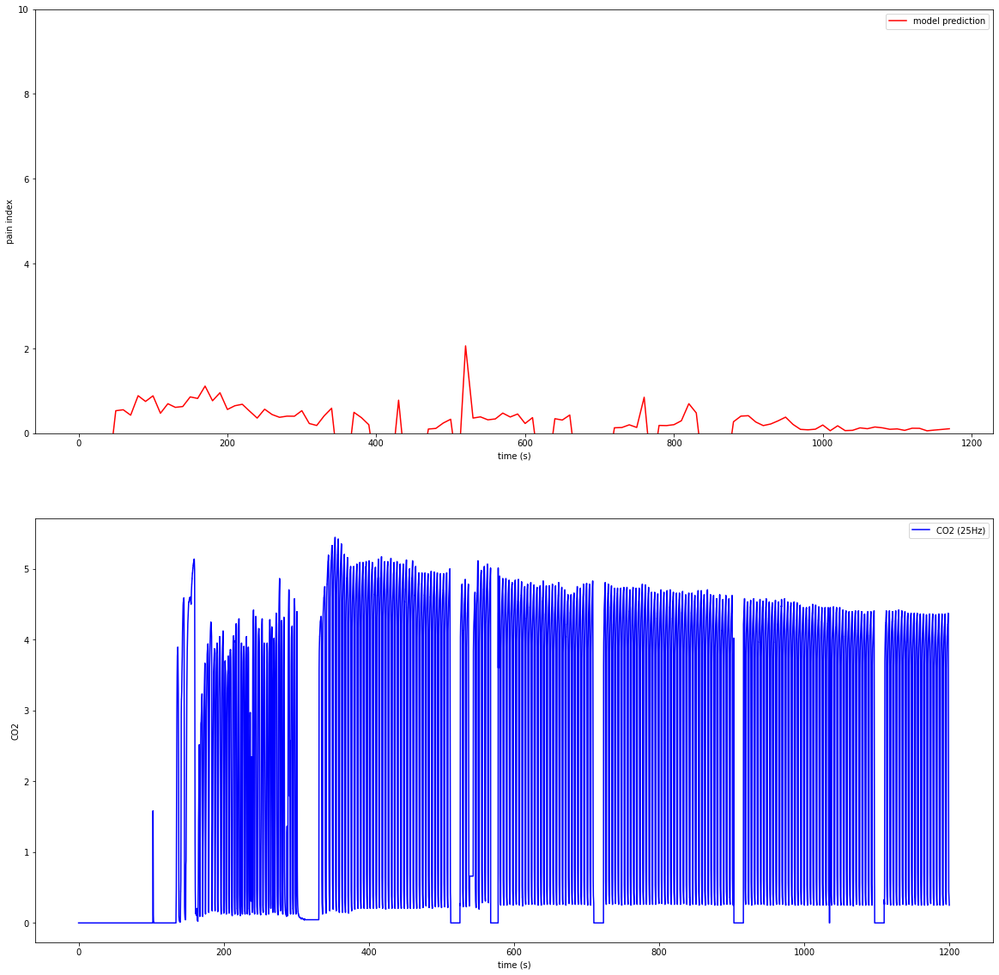

idx: 56,  preop file: D1_201021_130132.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...pass
input 1 ...pass
input 2 ...pass
input 3 ...pass
input 4 ...pass
input 5 ...pass
input 6 ...pass
input 7 ...pass
input 8 ...pass
input 9 ...pass
input 10 ...pass
input 11 ...noise out...ppg0.047619047619047616, ecg0.3failed
input 12 ...pass
input 13 ...pass
input 14 ...pass
input 15 ...pass
input 16 ...pass
input 17 ...pass
input 18 ...pass
input 19 ...pass
input 20 ...pass
input 21 ...pass
input 22 ...pass
input 23 ...pass
input 24 ...pass
input 25 ...pass
input 26 ...pass
input 27 ...pass
input 28 ...pass
input 29 ...pass
input 30 ...pass
input 31 ...pass
input 32 ...pass
input 33 ...pass
input 34 ...pass
input 35 ...pass
input 36 ...pass
input 37 ...pass
input 38 ...pass
input 39 ...noise out...ppg0.0, ecg0.3157894736842105failed
input 40 ...noise out...ppg0.47058823529411764, ecg0.6666666666666666failed
input 41 ...noise out...ppg

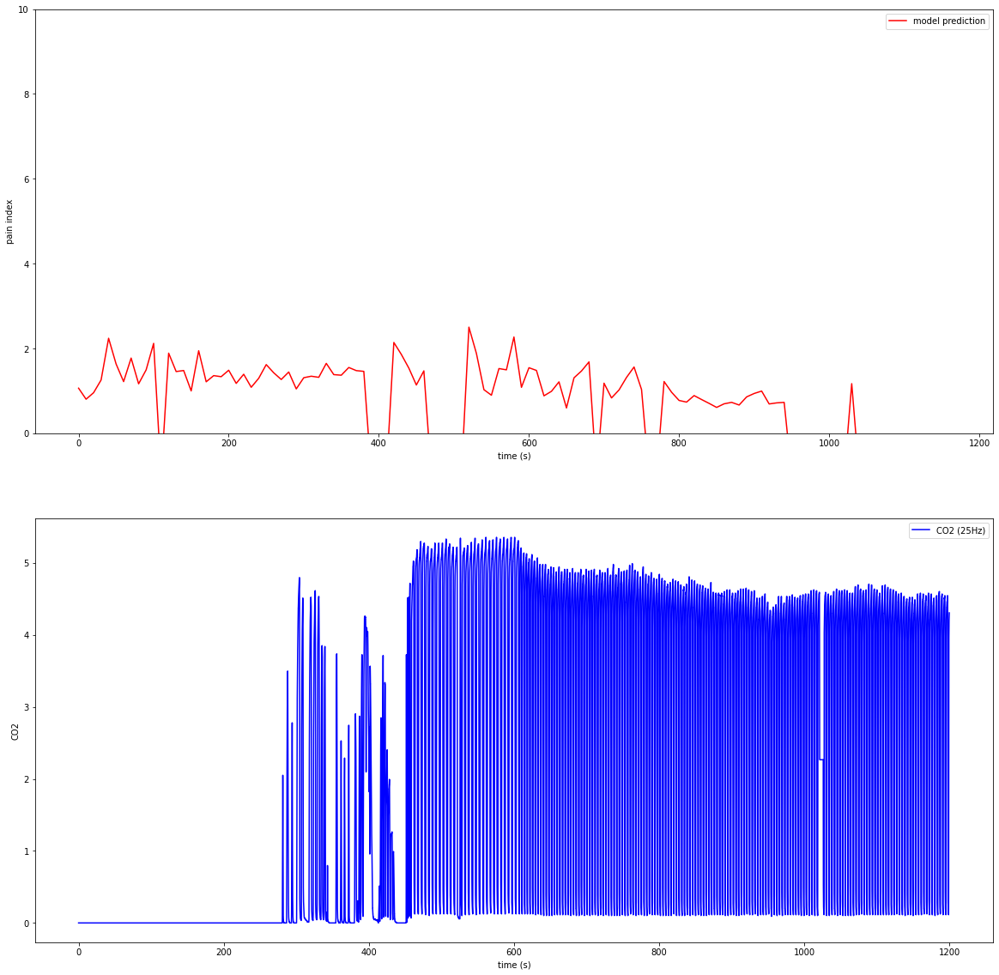

idx: 57,  preop file: C5_190910_105408.vital
no vital co2
idx: 58,  preop file: E3_190516_075046.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...noise out...ppg1.0, ecg1.0failed
input 1 ...noise out...ppg0.9411764705882353, ecg0.14285714285714285failed
input 2 ...noise out...ppg1.0, ecg0.0failed
input 3 ...noise out...ppg0.7142857142857143, ecg0.0failed
input 4 ...pass
input 5 ...pass
input 6 ...pass
input 7 ...pass
input 8 ...pass
input 9 ...pass
input 10 ...pass
input 11 ...pass
input 12 ...pass
input 13 ...pass
input 14 ...pass
input 15 ...pass
input 16 ...pass
input 17 ...pass
input 18 ...pass
input 19 ...pass
input 20 ...pass
input 21 ...pass
input 22 ...pass
input 23 ...pass
input 24 ...pass
input 25 ...pass
input 26 ...pass
input 27 ...pass
input 28 ...pass
input 29 ...pass
input 30 ...pass
input 31 ...pass
input 32 ...pass
input 33 ...pass
input 34 ...pass
input 35 ...pass
input 36 ...pass
input 37 ...pass
input 38 

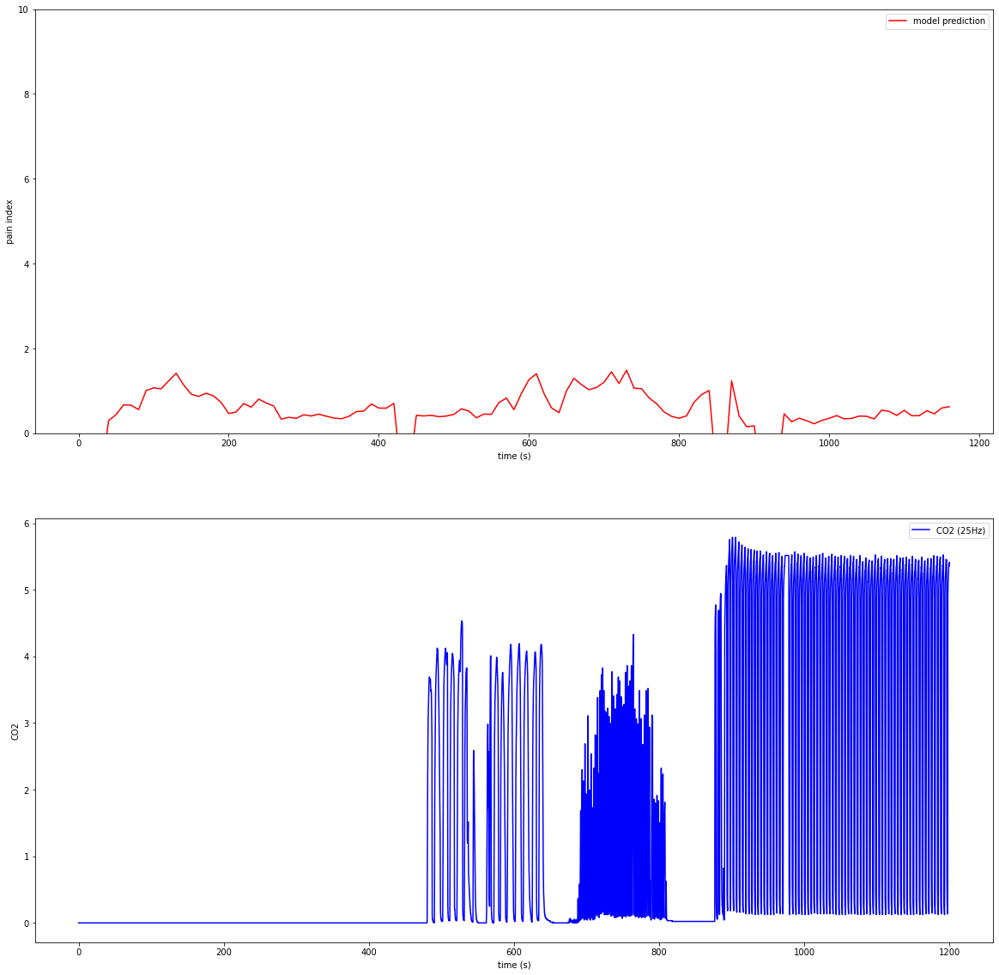

idx: 59,  preop file: C3_200204_103006.vital
no vital co2
idx: 60,  preop file: E3_201023_135836.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...nan out...failed
input 1 ...noise out...ppg0.6111111111111112, ecg0.047619047619047616failed
input 2 ...pass
input 3 ...pass
input 4 ...pass
input 5 ...pass
input 6 ...pass
input 7 ...pass
input 8 ...pass
input 9 ...pass
input 10 ...pass
input 11 ...pass
input 12 ...pass
input 13 ...pass
input 14 ...pass
input 15 ...pass
input 16 ...pass
input 17 ...pass
input 18 ...noise out...ppg0.0, ecg0.34782608695652173failed
input 19 ...pass
input 20 ...pass
input 21 ...pass
input 22 ...pass
input 23 ...pass
input 24 ...pass
input 25 ...pass
input 26 ...pass
input 27 ...pass
input 28 ...pass
input 29 ...pass
input 30 ...pass
input 31 ...pass
input 32 ...pass
input 33 ...pass
input 34 ...pass
input 35 ...pass
input 36 ...pass
input 37 ...pass
input 38 ...pass
input 39 ...pass
input 40 ...pass


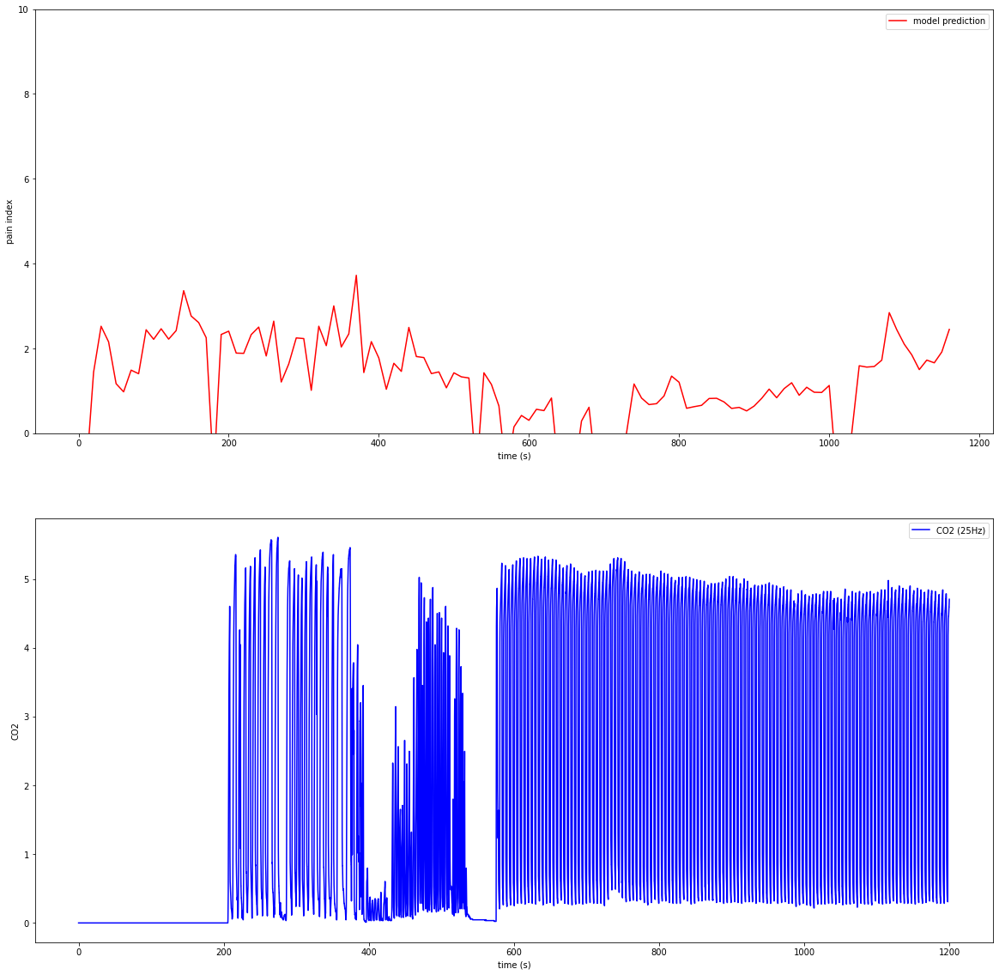

idx: 61,  preop file: E4_190515_140752.vital
no vital co2
idx: 62,  preop file: C3_200130_074642.vital
no vital co2
idx: 63,  preop file: F1_190523_121946.vital
no vital co2
idx: 64,  preop file: D2_200323_101857.vital
no vital co2
idx: 65,  preop file: R3_200617_121534.vital
no vital co2
idx: 66,  preop file: C3_201008_075201.vital
no vital co2
idx: 67,  preop file: R5_200203_074504.vital
no vital co2
idx: 68,  preop file: D1_200526_155623.vital
existing CO2 curve...no ppg
idx: 69,  preop file: C5_200616_111037.vital
no vital co2
idx: 70,  preop file: D5_190822_133114.vital
no vital co2
idx: 71,  preop file: A1_190417_123358.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...pass
input 1 ...noise out...ppg0.0, ecg0.8421052631578947failed
input 2 ...noise out...ppg0.23076923076923078, ecg0.30434782608695654failed
input 3 ...noise out...ppg1.0, ecg0.19047619047619047failed
input 4 ...noise out...ppg1.0, ecg0.5263157894736842fai

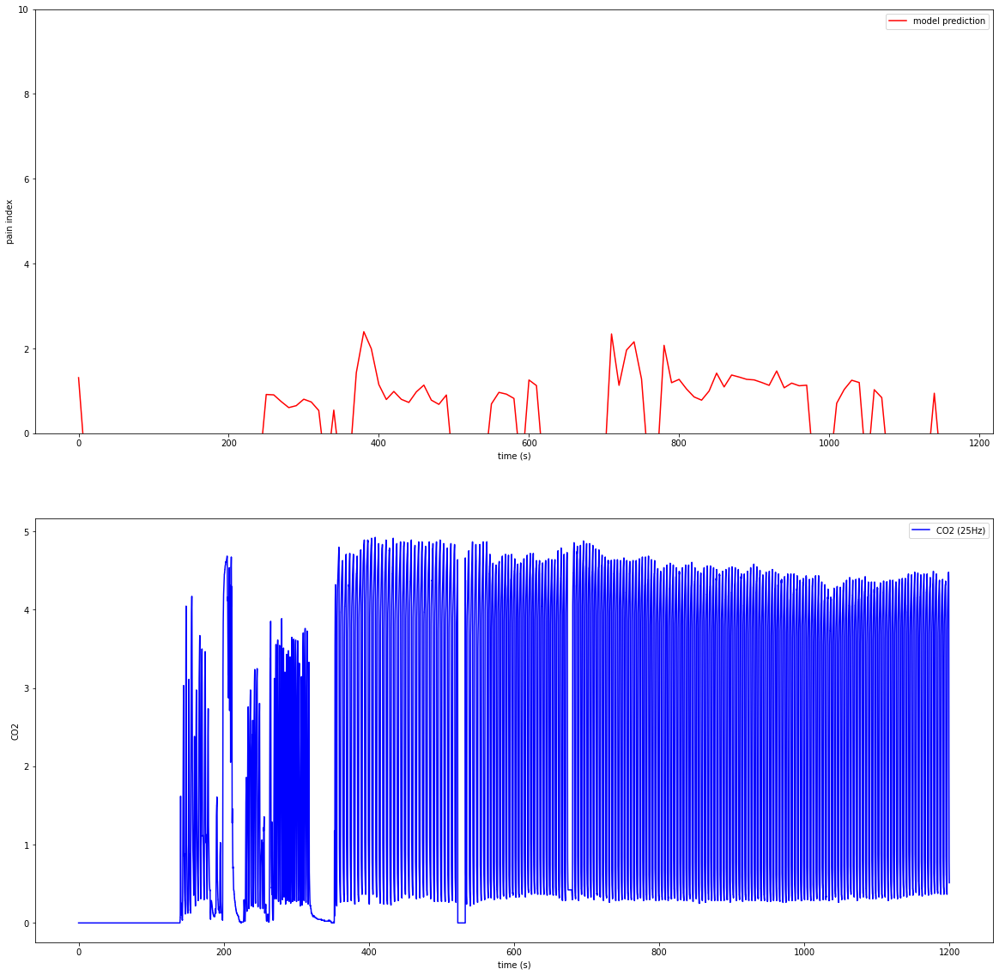

idx: 72,  preop file: R3_200225_144223.vital
no vital co2
idx: 73,  preop file: R4_200220_131241.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...nan out...failed
input 1 ...noise out...ppg0.0, ecg0.3failed
input 2 ...noise out...ppg0.0, ecg0.5263157894736842failed
input 3 ...noise out...ppg0.0, ecg0.8failed
input 4 ...noise out...ppg0.0, ecg0.6818181818181818failed
input 5 ...noise out...ppg0.045454545454545456, ecg0.7272727272727273failed
input 6 ...noise out...ppg0.0, ecg0.3333333333333333failed
input 7 ...pass
input 8 ...noise out...ppg0.0, ecg0.85failed
input 9 ...noise out...ppg0.0, ecg0.85failed
input 10 ...noise out...ppg0.0, ecg0.9failed
input 11 ...noise out...ppg0.0, ecg0.6842105263157895failed
input 12 ...noise out...ppg0.0, ecg0.3157894736842105failed
input 13 ...pass
input 14 ...noise out...ppg0.0, ecg0.3157894736842105failed
input 15 ...noise out...ppg0.0, ecg0.3157894736842105failed
input 16 ...pass
input 17 

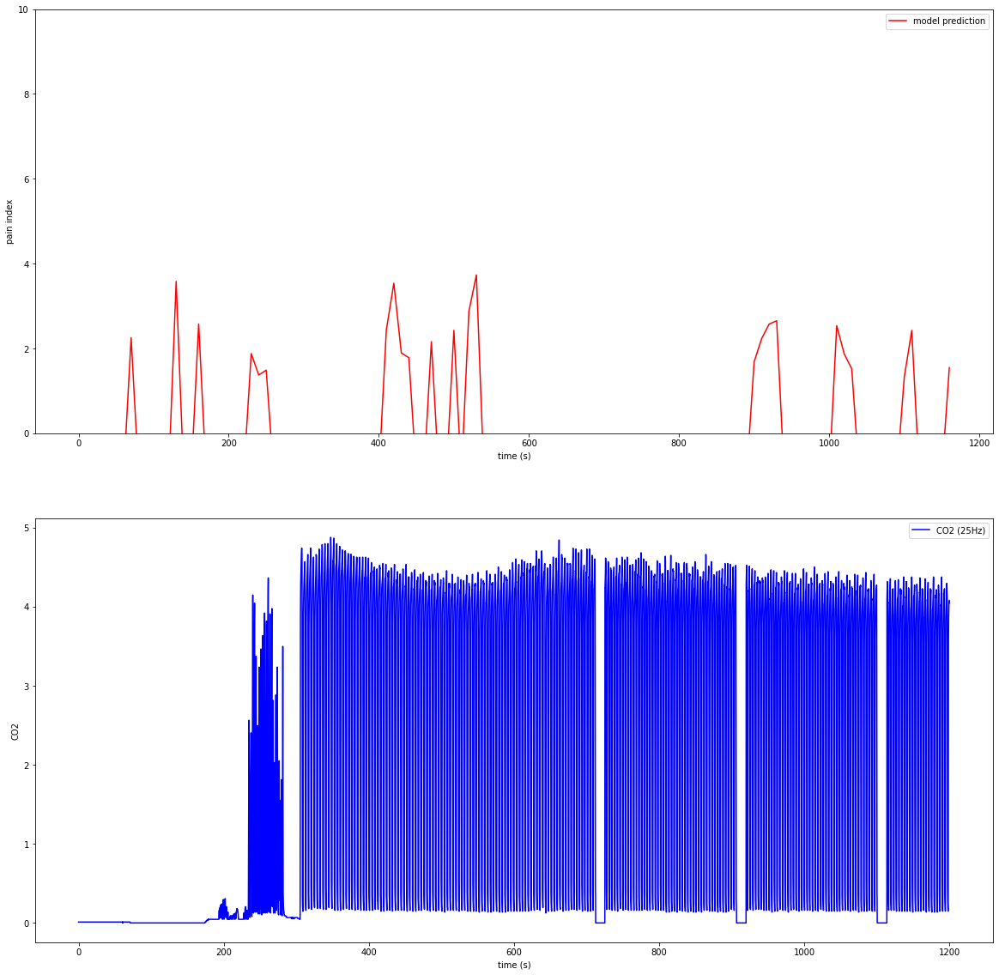

idx: 74,  preop file: A1_190903_134547.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...nan out...failed
input 1 ...noise out...ppg0.875, ecg1.0failed
input 2 ...noise out...ppg1.0, ecg1.0failed
input 3 ...noise out...ppg0.4444444444444444, ecg1.0failed
input 4 ...noise out...ppg0.0, ecg1.0failed
input 5 ...noise out...ppg0.0, ecg1.0failed
input 6 ...noise out...ppg0.2, ecg1.0failed
input 7 ...noise out...ppg0.5555555555555556, ecg1.0failed
input 8 ...noise out...ppg0.5, ecg1.0failed
input 9 ...noise out...ppg0.3157894736842105, ecg1.0failed
input 10 ...noise out...ppg0.15789473684210525, ecg1.0failed
input 11 ...noise out...ppg0.1, ecg1.0failed
input 12 ...noise out...ppg0.05, ecg1.0failed
input 13 ...noise out...ppg0.2, ecg1.0failed
input 14 ...noise out...ppg0.3157894736842105, ecg1.0failed
input 15 ...noise out...ppg0.3157894736842105, ecg1.0failed
input 16 ...noise out...ppg0.2, ecg1.0failed
input 17 ...noise out...ppg0

input 53 ...noise out...ppg1.0, ecg1.0failed
input 54 ...noise out...ppg1.0, ecg1.0failed
input 55 ...peak out...failed
input 56 ...noise out...ppg1.0, ecg1.0failed
input 57 ...noise out...ppg1.0, ecg1.0failed
input 58 ...peak out...failed
input 59 ...peak out...failed
input 60 ...peak out...failed
input 61 ...noise out...ppg1.0, ecg1.0failed
input 62 ...peak out...failed
input 63 ...peak out...failed
input 64 ...noise out...ppg1.0, ecg1.0failed
input 65 ...noise out...ppg1.0, ecg1.0failed
input 66 ...noise out...ppg1.0, ecg1.0failed
input 67 ...noise out...ppg1.0, ecg1.0failed
input 68 ...peak out...failed
input 69 ...peak out...failed
input 70 ...peak out...failed
input 71 ...peak out...failed
input 72 ...peak out...failed
input 73 ...peak out...failed
input 74 ...peak out...failed
input 75 ...noise out...ppg1.0, ecg1.0failed
input 76 ...noise out...ppg1.0, ecg1.0failed
input 77 ...peak out...failed
input 78 ...peak out...failed
input 79 ...noise out...ppg1.0, ecg1.0failed
input 80 .

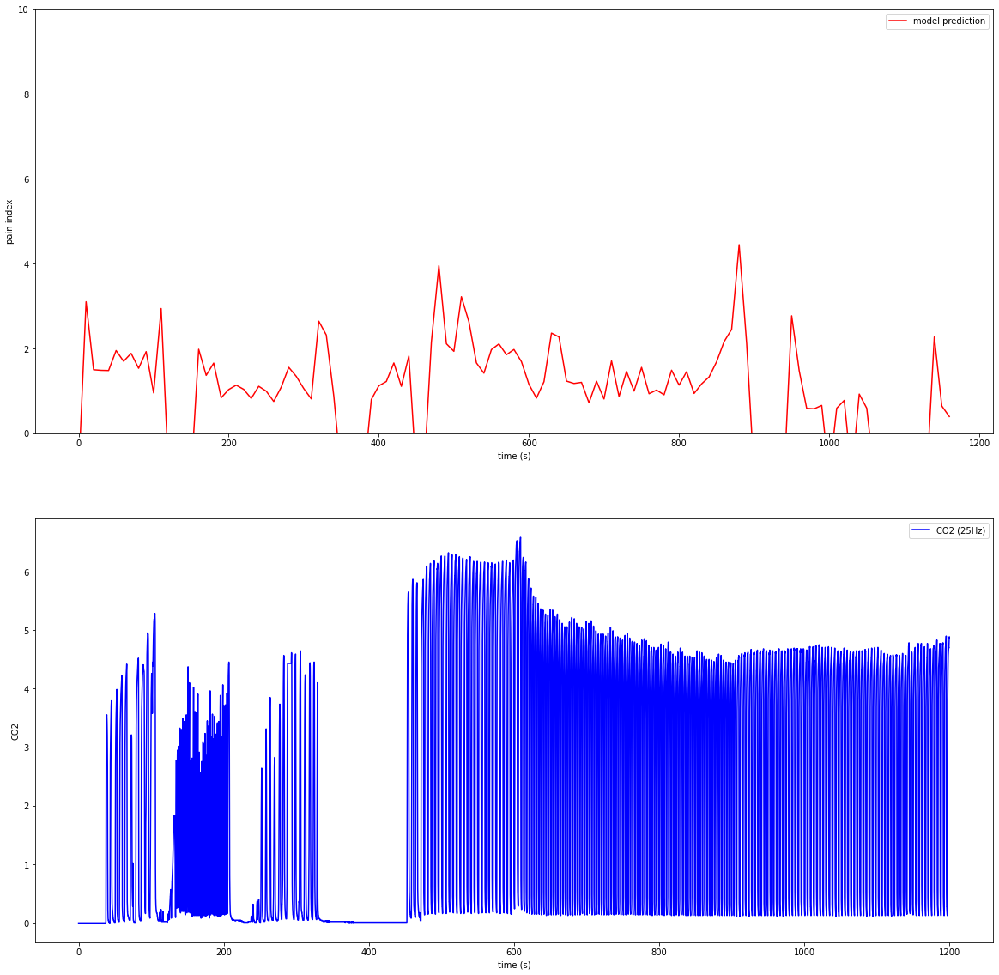

idx: 84,  preop file: A1_190816_074741.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...nan out...failed
input 1 ...noise out...ppg0.9285714285714286, ecg1.0failed
input 2 ...noise out...ppg0.625, ecg1.0failed
input 3 ...noise out...ppg0.11764705882352941, ecg0.9failed
input 4 ...noise out...ppg0.11764705882352941, ecg0.9failed
input 5 ...noise out...ppg0.23529411764705882, ecg1.0failed
input 6 ...noise out...ppg0.17647058823529413, ecg1.0failed
input 7 ...noise out...ppg0.0, ecg1.0failed
input 8 ...noise out...ppg0.05555555555555555, ecg1.0failed
input 9 ...noise out...ppg0.1111111111111111, ecg1.0failed
input 10 ...noise out...ppg0.05555555555555555, ecg1.0failed
input 11 ...noise out...ppg0.0, ecg1.0failed
input 12 ...noise out...ppg0.1111111111111111, ecg1.0failed
input 13 ...noise out...ppg0.2777777777777778, ecg1.0failed
input 14 ...noise out...ppg0.23529411764705882, ecg1.0failed
input 15 ...noise out...ppg0.3125, ecg

input 51 ...pass
input 52 ...pass
input 53 ...pass
input 54 ...pass
input 55 ...pass
input 56 ...pass
input 57 ...pass
input 58 ...pass
input 59 ...noise out...ppg0.0, ecg0.3181818181818182failed
input 60 ...noise out...ppg0.0, ecg0.6666666666666666failed
input 61 ...noise out...ppg0.0, ecg0.3failed
input 62 ...pass
input 63 ...pass
input 64 ...noise out...ppg0.0, ecg0.43478260869565216failed
input 65 ...noise out...ppg0.0, ecg0.6190476190476191failed
input 66 ...noise out...ppg0.0, ecg0.3failed
input 67 ...pass
input 68 ...pass
input 69 ...pass
input 70 ...pass
input 71 ...pass
input 72 ...pass
input 73 ...pass
input 74 ...pass
input 75 ...pass
input 76 ...pass
input 77 ...pass
input 78 ...pass
input 79 ...noise out...ppg0.09090909090909091, ecg0.5failed
input 80 ...noise out...ppg0.09523809523809523, ecg0.5454545454545454failed
input 81 ...pass
input 82 ...pass
input 83 ...pass
input 84 ...pass
input 85 ...pass
input 86 ...pass
input 87 ...pass
input 88 ...pass
input 89 ...pass
input

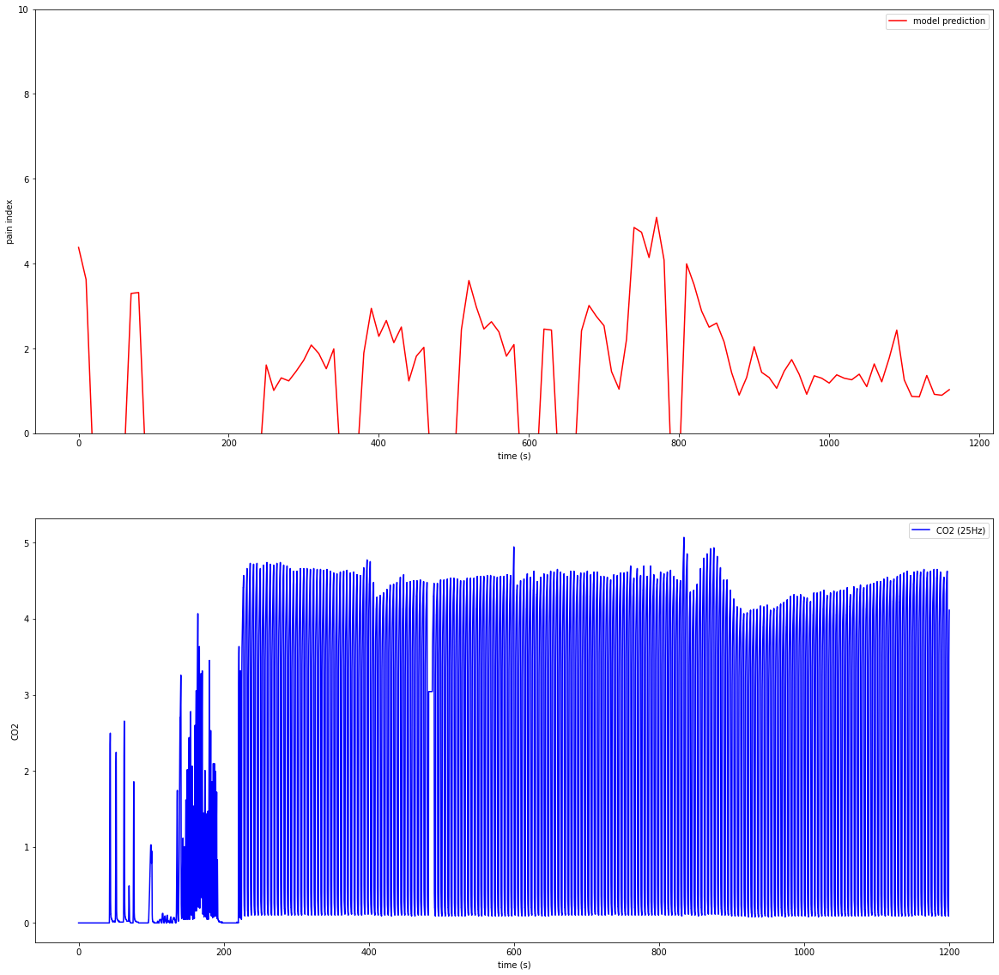

idx: 86,  preop file: A5_190529_075818.vital
no vital co2
idx: 87,  preop file: R1_200820_004113.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...noise out...ppg0.4, ecg1.0failed
input 1 ...noise out...ppg0.3157894736842105, ecg0.0failed
input 2 ...pass
input 3 ...noise out...ppg0.6111111111111112, ecg0.0failed
input 4 ...noise out...ppg0.9444444444444444, ecg0.0failed
input 5 ...pass
input 6 ...pass
input 7 ...noise out...ppg0.15789473684210525, ecg0.6failed
input 8 ...noise out...ppg0.4444444444444444, ecg0.42857142857142855failed
input 9 ...pass
input 10 ...pass
input 11 ...pass
input 12 ...pass
input 13 ...pass
input 14 ...pass
input 15 ...pass
input 16 ...pass
input 17 ...pass
input 18 ...pass
input 19 ...pass
input 20 ...pass
input 21 ...pass
input 22 ...noise out...ppg0.23809523809523808, ecg0.36363636363636365failed
input 23 ...noise out...ppg0.42105263157894735, ecg0.21739130434782608failed
input 24 ...noise out...p

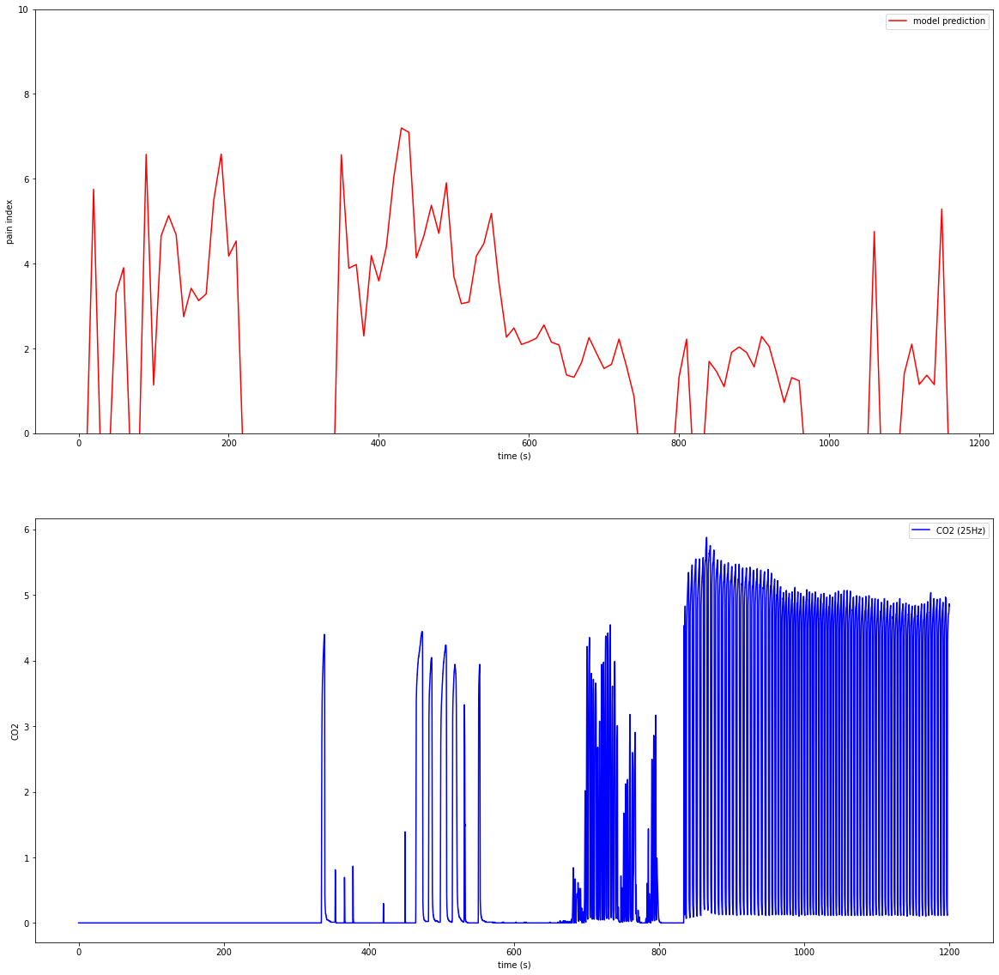

idx: 88,  preop file: C5_200512_200041.vital
no vital co2
idx: 89,  preop file: C3_201016_142607.vital
no vital co2
idx: 90,  preop file: F1_190903_141413.vital
no vital co2
idx: 91,  preop file: D2_200526_205224.vital
no vital co2
idx: 92,  preop file: A2_190723_142945.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...noise out...ppg0.1, ecg0.3failed
input 1 ...pass
input 2 ...pass
input 3 ...pass
input 4 ...pass
input 5 ...pass
input 6 ...pass
input 7 ...pass
input 8 ...pass
input 9 ...pass
input 10 ...pass
input 11 ...pass
input 12 ...pass
input 13 ...pass
input 14 ...pass
input 15 ...pass
input 16 ...pass
input 17 ...pass
input 18 ...noise out...ppg0.5263157894736842, ecg0.75failed
input 19 ...noise out...ppg0.75, ecg0.44failed
input 20 ...noise out...ppg0.8125, ecg0.14285714285714285failed
input 21 ...noise out...ppg0.9444444444444444, ecg0.18518518518518517failed
input 22 ...noise out...ppg0.7222222222222222, ecg0.11538

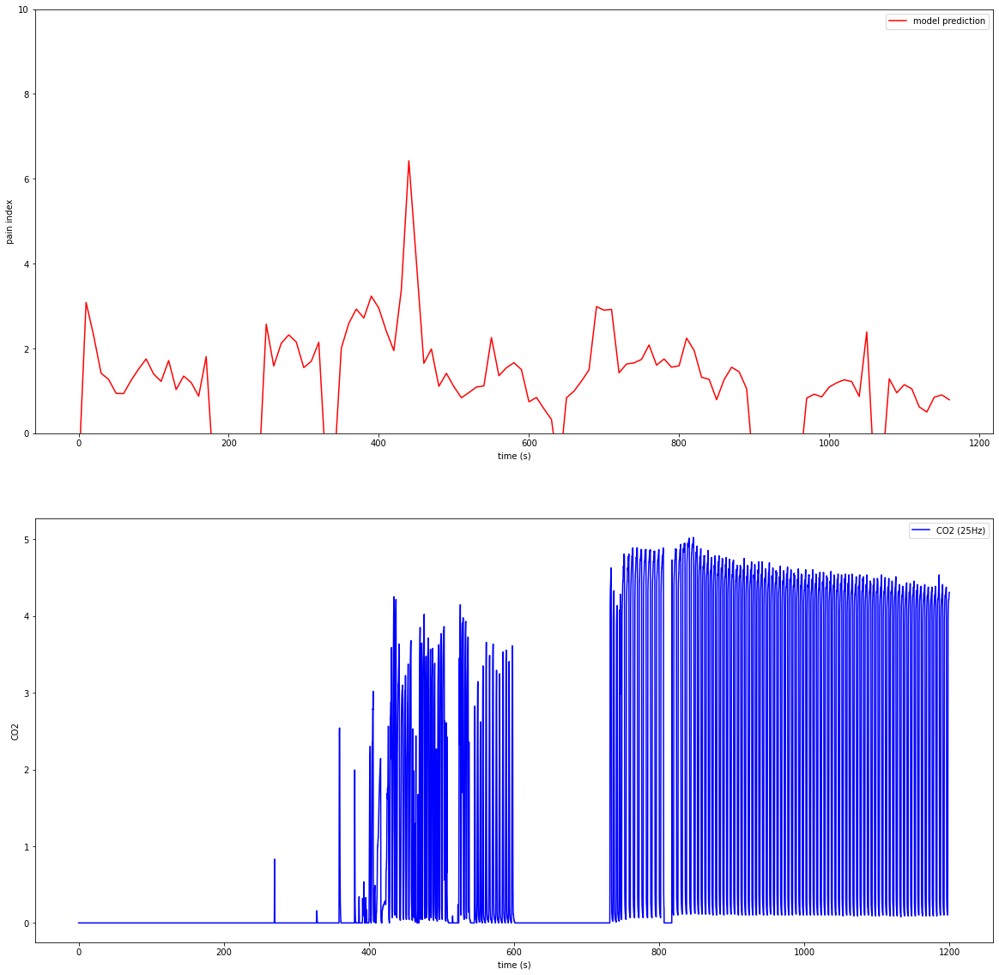

idx: 93,  preop file: A1_190830_144554.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...nan out...failed
input 1 ...noise out...ppg0.0, ecg1.0failed
input 2 ...noise out...ppg0.0, ecg1.0failed
input 3 ...noise out...ppg0.0, ecg1.0failed
input 4 ...noise out...ppg0.0, ecg1.0failed
input 5 ...noise out...ppg0.0, ecg1.0failed
input 6 ...noise out...ppg0.0, ecg1.0failed
input 7 ...noise out...ppg0.0, ecg1.0failed
input 8 ...noise out...ppg0.027777777777777776, ecg1.0failed
input 9 ...noise out...ppg0.02702702702702703, ecg1.0failed
input 10 ...noise out...ppg0.0, ecg1.0failed
input 11 ...noise out...ppg0.0, ecg1.0failed
input 12 ...noise out...ppg0.0, ecg1.0failed
input 13 ...noise out...ppg0.0, ecg1.0failed
input 14 ...noise out...ppg0.0, ecg1.0failed
input 15 ...noise out...ppg0.0, ecg1.0failed
input 16 ...noise out...ppg0.0, ecg1.0failed
input 17 ...noise out...ppg0.0, ecg1.0failed
input 18 ...noise out...ppg0.0, ecg1.0failed

input 55 ...noise out...ppg0.0, ecg1.0failed
input 56 ...noise out...ppg0.09523809523809523, ecg1.0failed
input 57 ...peak out...failed
input 58 ...peak out...failed
input 59 ...noise out...ppg1.0, ecg1.0failed
input 60 ...noise out...ppg1.0, ecg1.0failed
input 61 ...noise out...ppg1.0, ecg1.0failed
input 62 ...noise out...ppg1.0, ecg1.0failed
input 63 ...peak out...failed
input 64 ...peak out...failed
input 65 ...peak out...failed
input 66 ...noise out...ppg1.0, ecg1.0failed
input 67 ...noise out...ppg0.5833333333333334, ecg1.0failed
input 68 ...noise out...ppg0.36363636363636365, ecg1.0failed
input 69 ...noise out...ppg0.23076923076923078, ecg1.0failed
input 70 ...noise out...ppg1.0, ecg1.0failed
input 71 ...noise out...ppg1.0, ecg0.4166666666666667failed
input 72 ...noise out...ppg0.47058823529411764, ecg0.08failed
input 73 ...noise out...ppg0.4444444444444444, ecg0.0failed
input 74 ...noise out...ppg0.3888888888888889, ecg0.0failed
input 75 ...pass
input 76 ...pass
input 77 ...pass

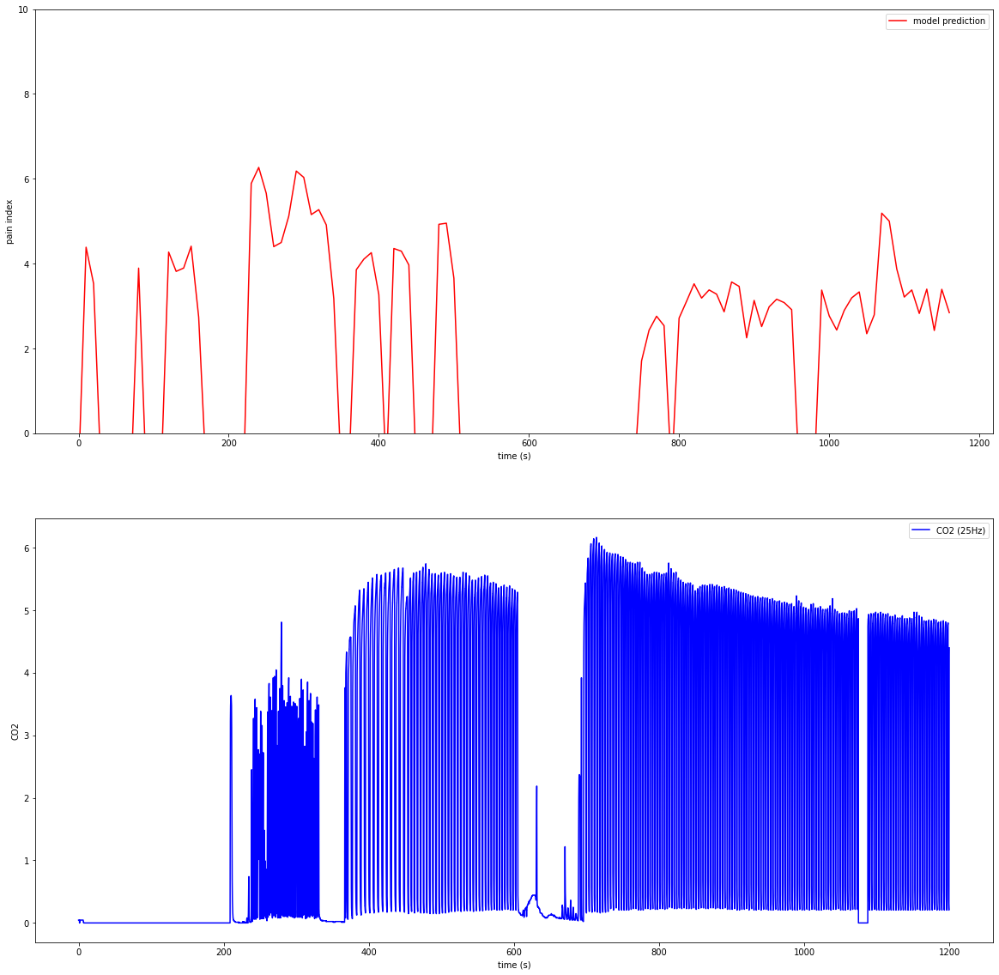

idx: 99,  preop file: R6_200304_103850.vital
no vital co2
idx: 100,  preop file: E4_190712_135630.vital
no vital co2
idx: 101,  preop file: D1_190909_113105.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...noise out...ppg1.0, ecg1.0failed
input 1 ...noise out...ppg1.0, ecg1.0failed
input 2 ...noise out...ppg1.0, ecg1.0failed
input 3 ...noise out...ppg1.0, ecg1.0failed
input 4 ...noise out...ppg1.0, ecg1.0failed
input 5 ...noise out...ppg1.0, ecg1.0failed
input 6 ...noise out...ppg1.0, ecg1.0failed
input 7 ...noise out...ppg1.0, ecg1.0failed
input 8 ...noise out...ppg1.0, ecg1.0failed
input 9 ...noise out...ppg1.0, ecg1.0failed
input 10 ...noise out...ppg1.0, ecg1.0failed
input 11 ...noise out...ppg1.0, ecg1.0failed
input 12 ...noise out...ppg1.0, ecg1.0failed
input 13 ...noise out...ppg1.0, ecg1.0failed
input 14 ...noise out...ppg1.0, ecg0.6666666666666666failed
input 15 ...noise out...ppg1.0, ecg0.6666666666666666failed
inp

input 76 ...pass
input 77 ...pass
input 78 ...pass
input 79 ...pass
input 80 ...pass
input 81 ...pass
input 82 ...pass
input 83 ...pass
input 84 ...pass
input 85 ...pass
input 86 ...pass
input 87 ...pass
input 88 ...pass
input 89 ...pass
input 90 ...pass
input 91 ...pass
input 92 ...pass
input 93 ...pass
input 94 ...pass
input 95 ...pass
input 96 ...pass
input 97 ...pass
input 98 ...pass
input 99 ...pass
input 100 ...pass
input 101 ...pass
input 102 ...pass
input 103 ...pass
input 104 ...pass
input 105 ...pass
input 106 ...pass
input 107 ...pass
input 108 ...pass
input 109 ...pass
input 110 ...noise out...ppg0.0, ecg0.3333333333333333failed
input 111 ...pass
input 112 ...pass
input 113 ...pass
input 114 ...pass
input 115 ...pass
input 116 ...pass
x_input length: 117
x_model.shape: (94, 5000, 2)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:1',)
best model: 1D-CNN_ECG+PPG/NRS>=4/1D_CNN_5layers_sample-weighted_3class_lowess_filtered/RE_r

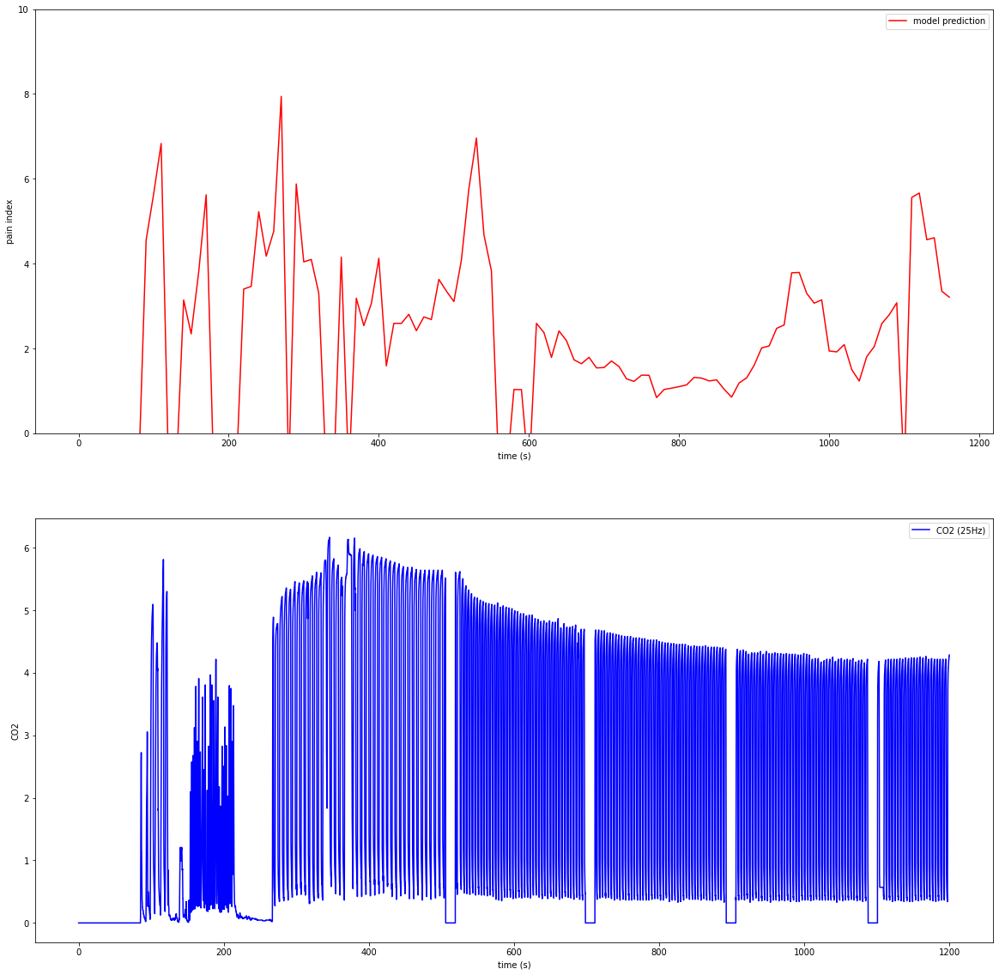

idx: 103,  preop file: E2_200522_145817.vital
no vital co2
idx: 104,  preop file: E4_191219_134541.vital
no vital co2
idx: 105,  preop file: E2_190531_171120.vital
no vital co2
idx: 106,  preop file: D2_190709_141932.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...pass
input 1 ...noise out...ppg0.047619047619047616, ecg0.3failed
input 2 ...pass
input 3 ...noise out...ppg0.5, ecg0.13043478260869565failed
input 4 ...noise out...ppg0.6842105263157895, ecg0.08333333333333333failed
input 5 ...noise out...ppg0.30434782608695654, ecg0.0failed
input 6 ...pass
input 7 ...pass
input 8 ...pass
input 9 ...pass
input 10 ...noise out...ppg0.6111111111111112, ecg0.041666666666666664failed
input 11 ...noise out...ppg1.0, ecg0.0failed
input 12 ...noise out...ppg0.3684210526315789, ecg0.0failed
input 13 ...pass
input 14 ...pass
input 15 ...pass
input 16 ...pass
input 17 ...noise out...ppg0.631578947368421, ecg0.0failed
input 18 ...noise out.

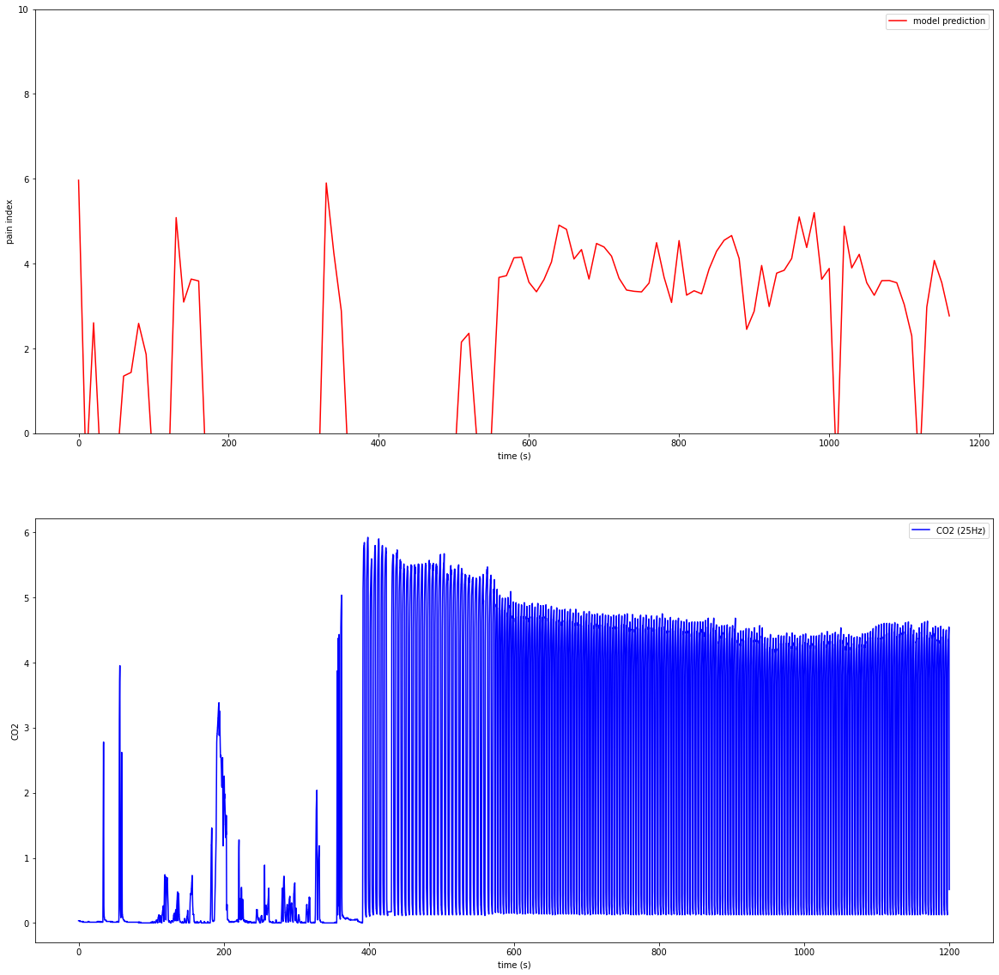

idx: 107,  preop file: F1_190827_190541.vital
no vital co2
idx: 108,  preop file: R6_200717_121015.vital
no vital co2
idx: 109,  preop file: D2_200923_080257.vital
no vital co2
idx: 110,  preop file: R3_200917_105947.vital
no vital co2
idx: 111,  preop file: E4_200320_142921.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...nan out...failed
input 1 ...noise out...ppg0.06060606060606061, ecg0.3939393939393939failed
input 2 ...pass
input 3 ...pass
input 4 ...pass
input 5 ...pass
input 6 ...pass
input 7 ...pass
input 8 ...pass
input 9 ...pass
input 10 ...pass
input 11 ...pass
input 12 ...pass
input 13 ...pass
input 14 ...pass
input 15 ...pass
input 16 ...pass
input 17 ...pass
input 18 ...pass
input 19 ...pass
input 20 ...pass
input 21 ...pass
input 22 ...noise out...ppg0.5151515151515151, ecg1.0failed
input 23 ...noise out...ppg0.2647058823529412, ecg1.0failed
input 24 ...noise out...ppg0.0, ecg0.5357142857142857failed
input 25 

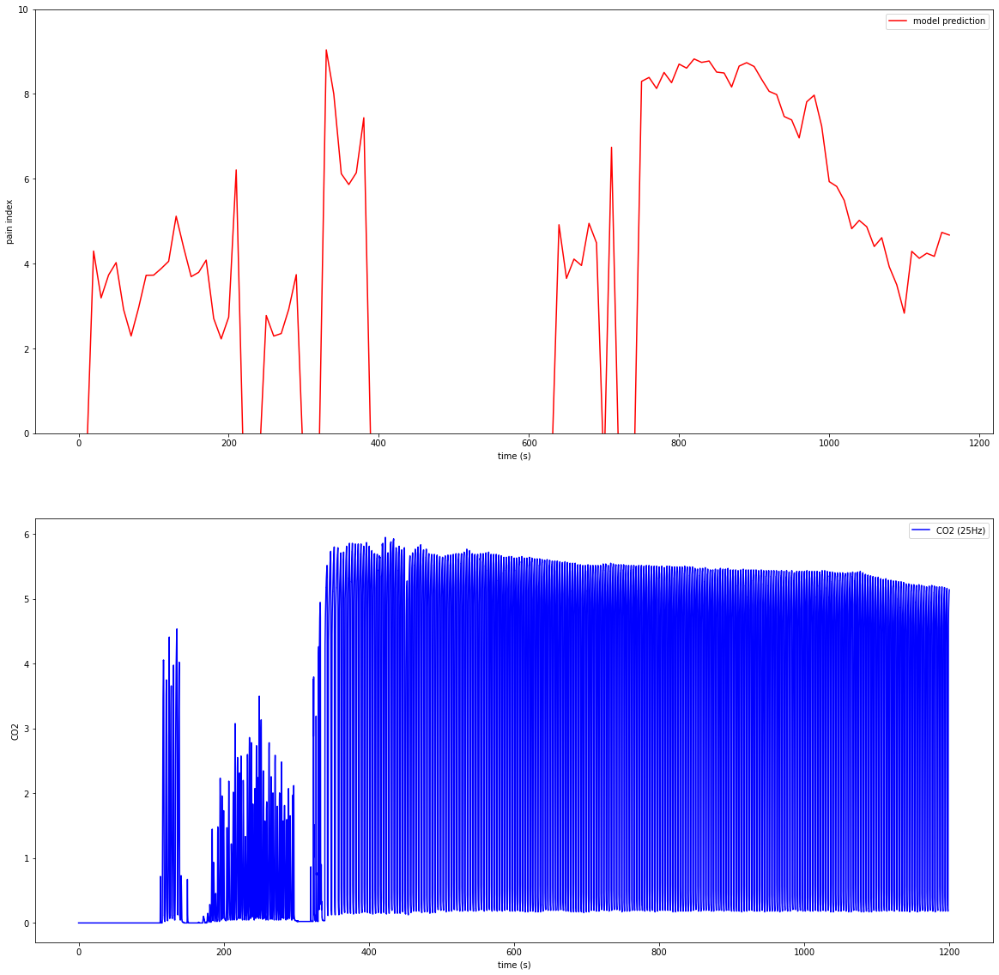

idx: 112,  preop file: A5_190516_193637.vital
no vital co2
idx: 113,  preop file: E1_200131_130517.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...noise out...ppg1.0, ecg0.35failed
input 1 ...noise out...ppg1.0, ecg0.23076923076923078failed
input 2 ...noise out...ppg0.9629629629629629, ecg0.07407407407407407failed
input 3 ...noise out...ppg0.9230769230769231, ecg0.125failed
input 4 ...noise out...ppg0.8928571428571429, ecg0.72failed
input 5 ...noise out...ppg0.9285714285714286, ecg0.6071428571428571failed
input 6 ...noise out...ppg0.9285714285714286, ecg0.07142857142857142failed
input 7 ...noise out...ppg0.9615384615384616, ecg0.07692307692307693failed
input 8 ...noise out...ppg1.0, ecg0.11538461538461539failed
input 9 ...noise out...ppg0.8888888888888888, ecg0.06896551724137931failed
input 10 ...noise out...ppg0.8076923076923077, ecg0.07142857142857142failed
input 11 ...noise out...ppg0.8, ecg0.0failed
input 12 ...noise ou

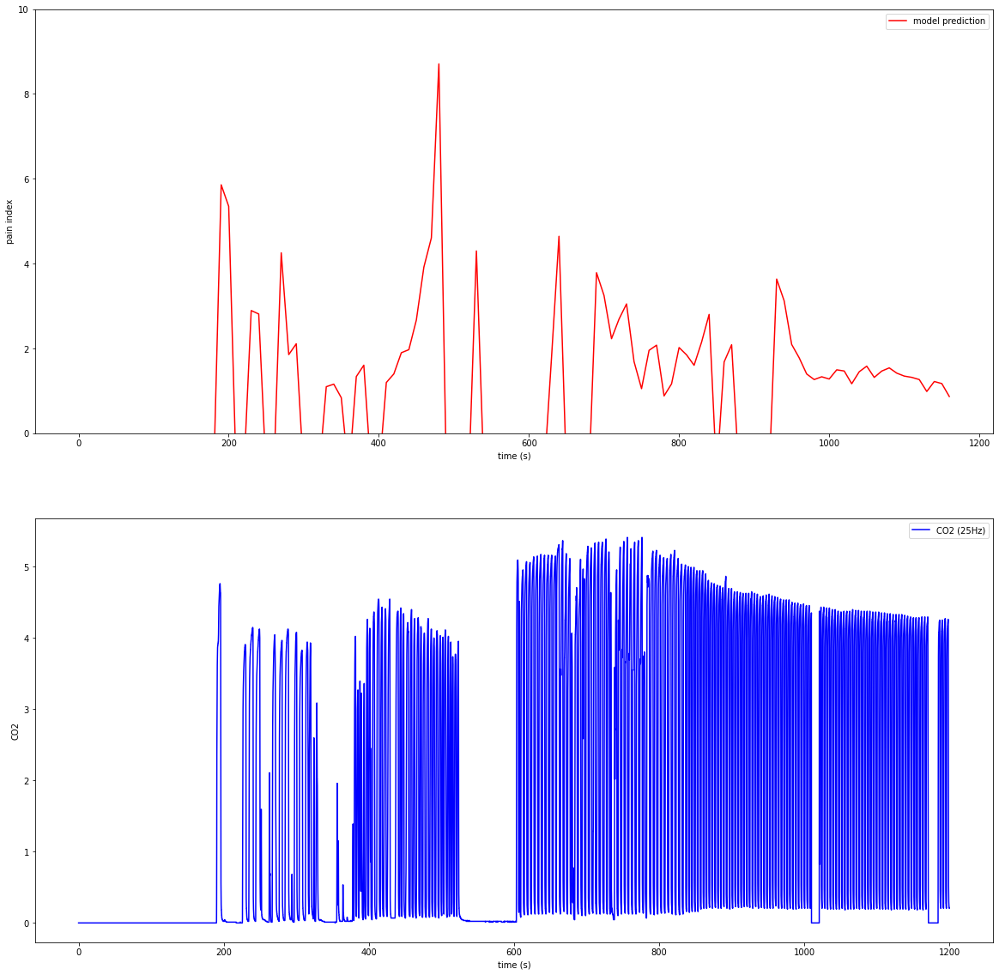

idx: 114,  preop file: A6_190516_121459.vital
no vital co2
idx: 115,  preop file: E1_191113_151125.vital
no vital co2
idx: 116,  preop file: C3_190516_073811.vital
no vital co2
idx: 117,  preop file: A1_190419_110023.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...noise out...ppg1.0, ecg1.0failed
input 1 ...noise out...ppg0.5454545454545454, ecg0.6470588235294118failed
input 2 ...noise out...ppg0.08333333333333333, ecg0.9523809523809523failed
input 3 ...noise out...ppg0.0, ecg0.782608695652174failed
input 4 ...pass
input 5 ...pass
input 6 ...pass
input 7 ...noise out...ppg0.6666666666666666, ecg0.30434782608695654failed
input 8 ...noise out...ppg0.4, ecg0.34782608695652173failed
input 9 ...noise out...ppg0.18181818181818182, ecg0.3333333333333333failed
input 10 ...pass
input 11 ...pass
input 12 ...noise out...ppg0.7, ecg0.0failed
input 13 ...pass
input 14 ...pass
input 15 ...pass
input 16 ...pass
input 17 ...pass
input 18 .

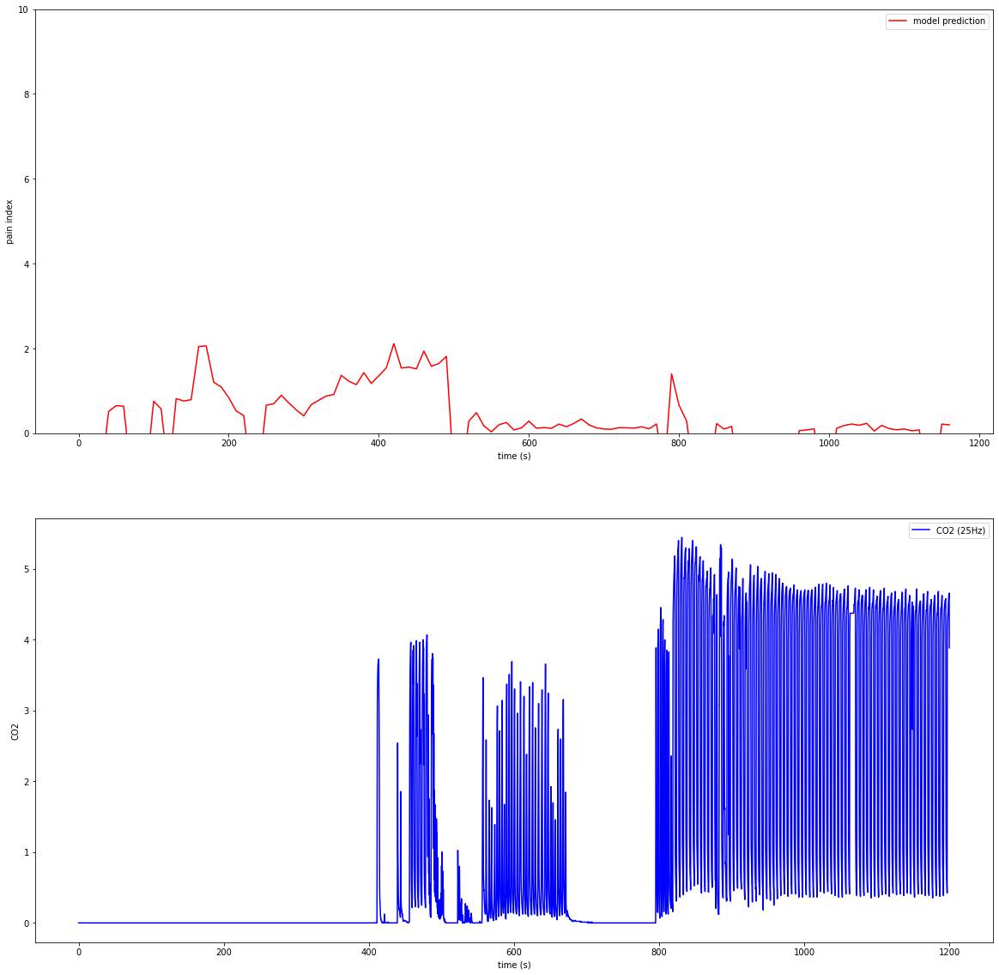

idx: 118,  preop file: R4_200602_075143.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...pass
input 1 ...pass
input 2 ...pass
input 3 ...pass
input 4 ...pass
input 5 ...pass
input 6 ...pass
input 7 ...pass
input 8 ...pass
input 9 ...pass
input 10 ...pass
input 11 ...pass
input 12 ...pass
input 13 ...pass
input 14 ...pass
input 15 ...pass
input 16 ...pass
input 17 ...pass
input 18 ...pass
input 19 ...pass
input 20 ...pass
input 21 ...pass
input 22 ...pass
input 23 ...pass
input 24 ...pass
input 25 ...pass
input 26 ...pass
input 27 ...pass
input 28 ...pass
input 29 ...pass
input 30 ...pass
input 31 ...pass
input 32 ...pass
input 33 ...pass
input 34 ...pass
input 35 ...pass
input 36 ...pass
input 37 ...pass
input 38 ...pass
input 39 ...pass
input 40 ...pass
input 41 ...pass
input 42 ...pass
input 43 ...pass
input 44 ...pass
input 45 ...pass
input 46 ...pass
input 47 ...pass
input 48 ...pass
input 49 ...pass
input 50 ...pass
inp

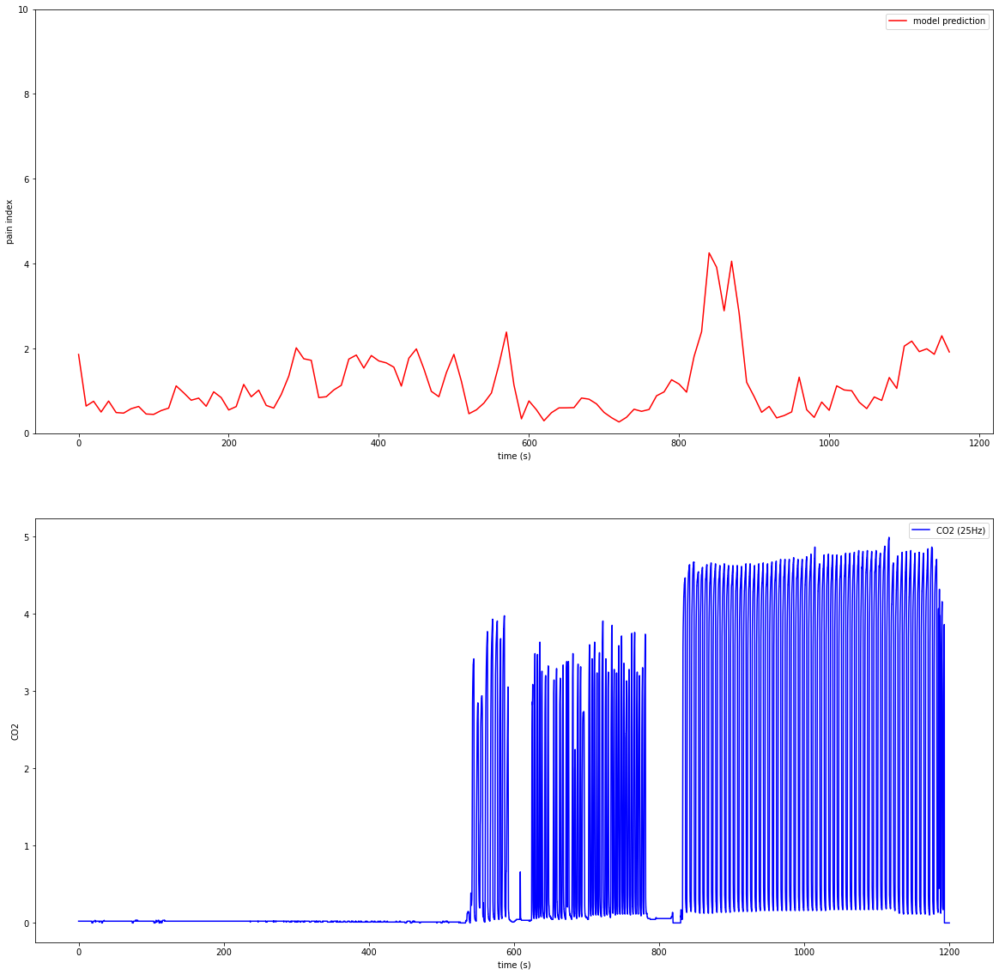

idx: 119,  preop file: R1_200311_090855.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...noise out...ppg1.0, ecg0.35failed
input 1 ...noise out...ppg0.7, ecg0.13043478260869565failed
input 2 ...noise out...ppg0.38095238095238093, ecg0.043478260869565216failed
input 3 ...noise out...ppg0.3181818181818182, ecg0.043478260869565216failed
input 4 ...pass
input 5 ...pass
input 6 ...pass
input 7 ...pass
input 8 ...pass
input 9 ...pass
input 10 ...pass
input 11 ...pass
input 12 ...pass
input 13 ...pass
input 14 ...pass
input 15 ...pass
input 16 ...pass
input 17 ...noise out...ppg0.3684210526315789, ecg0.0failed
input 18 ...noise out...ppg0.6666666666666666, ecg0.0failed
input 19 ...pass
input 20 ...pass
input 21 ...pass
input 22 ...pass
input 23 ...noise out...ppg0.42857142857142855, ecg0.0failed
input 24 ...pass
input 25 ...pass
input 26 ...pass
input 27 ...pass
input 28 ...pass
input 29 ...noise out...ppg0.4, ecg0.0failed
input 30

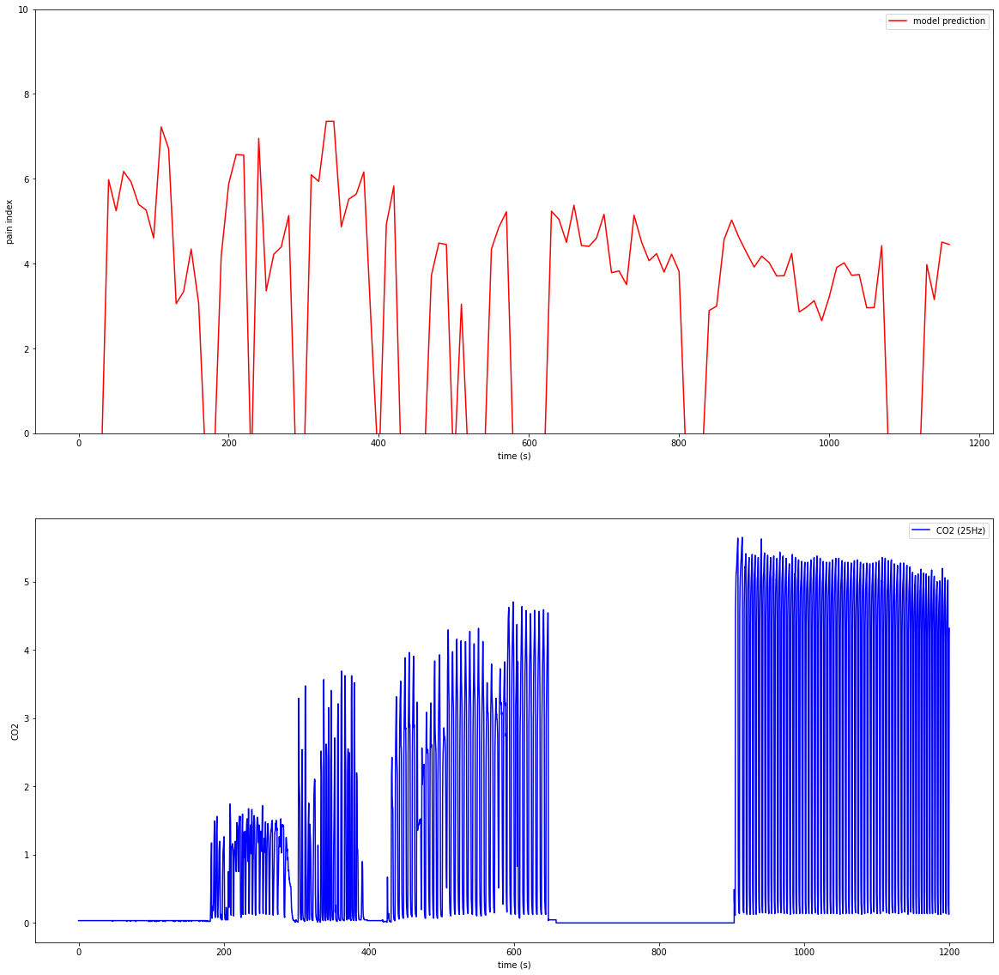

idx: 120,  preop file: R8_200924_080116.vital
no vital co2
idx: 121,  preop file: E1_200624_120413.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...pass
input 1 ...pass
input 2 ...pass
input 3 ...pass
input 4 ...pass
input 5 ...noise out...ppg0.3, ecg0.13043478260869565failed
input 6 ...pass
input 7 ...pass
input 8 ...pass
input 9 ...pass
input 10 ...pass
input 11 ...pass
input 12 ...pass
input 13 ...pass
input 14 ...pass
input 15 ...pass
input 16 ...pass
input 17 ...pass
input 18 ...pass
input 19 ...pass
input 20 ...noise out...ppg0.21052631578947367, ecg0.4failed
input 21 ...pass
input 22 ...pass
input 23 ...pass
input 24 ...pass
input 25 ...pass
input 26 ...noise out...ppg0.3157894736842105, ecg0.041666666666666664failed
input 27 ...noise out...ppg1.0, ecg0.20833333333333334failed
input 28 ...noise out...ppg0.9285714285714286, ecg0.13636363636363635failed
input 29 ...noise out...ppg0.9333333333333333, ecg0.090909090909090

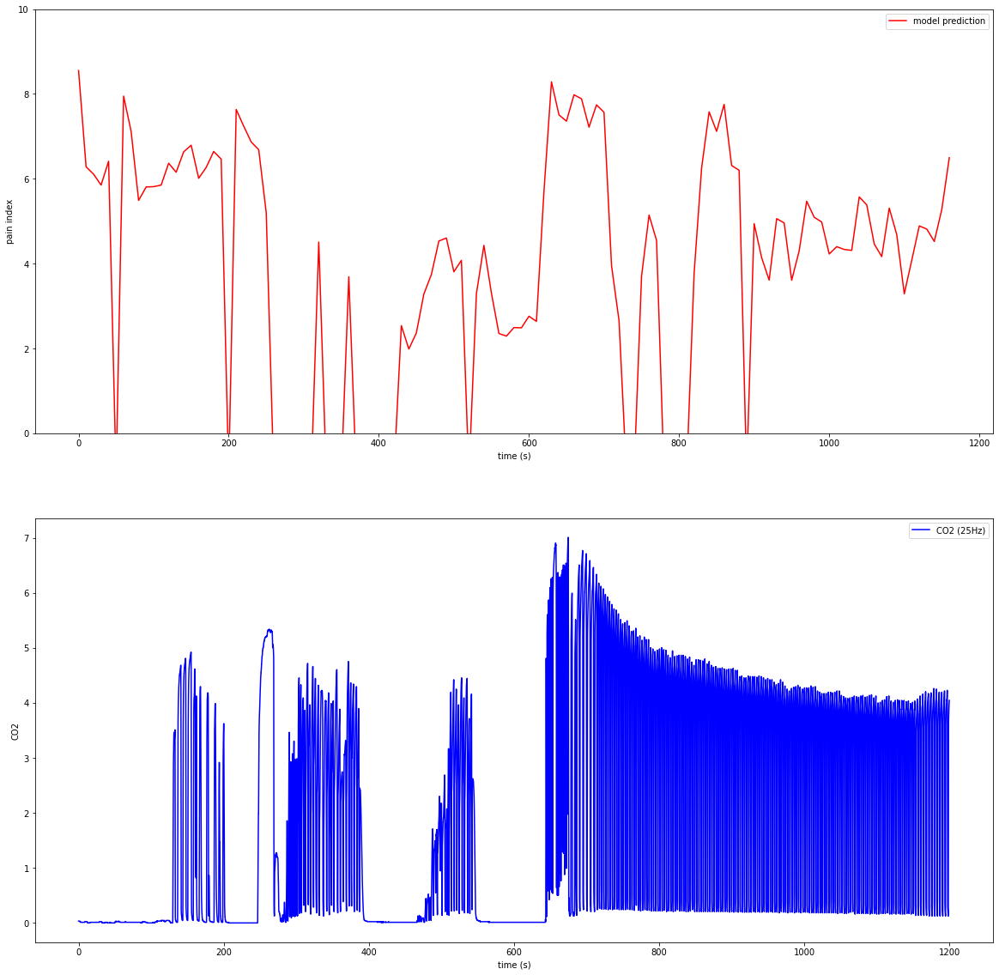

idx: 122,  preop file: D2_200923_132825.vital
no vital co2
idx: 123,  preop file: E4_200730_152115.vital
existing CO2 curve...no ppg
idx: 124,  preop file: R2_201019_141207.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...noise out...ppg0.6428571428571429, ecg1.0failed
input 1 ...noise out...ppg0.3157894736842105, ecg0.7727272727272727failed
input 2 ...noise out...ppg0.19047619047619047, ecg0.782608695652174failed
input 3 ...noise out...ppg0.3888888888888889, ecg0.8571428571428571failed
input 4 ...noise out...ppg0.5294117647058824, ecg0.8095238095238095failed
input 5 ...noise out...ppg0.631578947368421, ecg0.5833333333333334failed
input 6 ...noise out...ppg0.8333333333333334, ecg0.4failed
input 7 ...pass
input 8 ...pass
input 9 ...noise out...ppg0.3157894736842105, ecg0.09523809523809523failed
input 10 ...pass
input 11 ...pass
input 12 ...pass
input 13 ...noise out...ppg0.47058823529411764, ecg0.1875failed
input 14 ...noise 

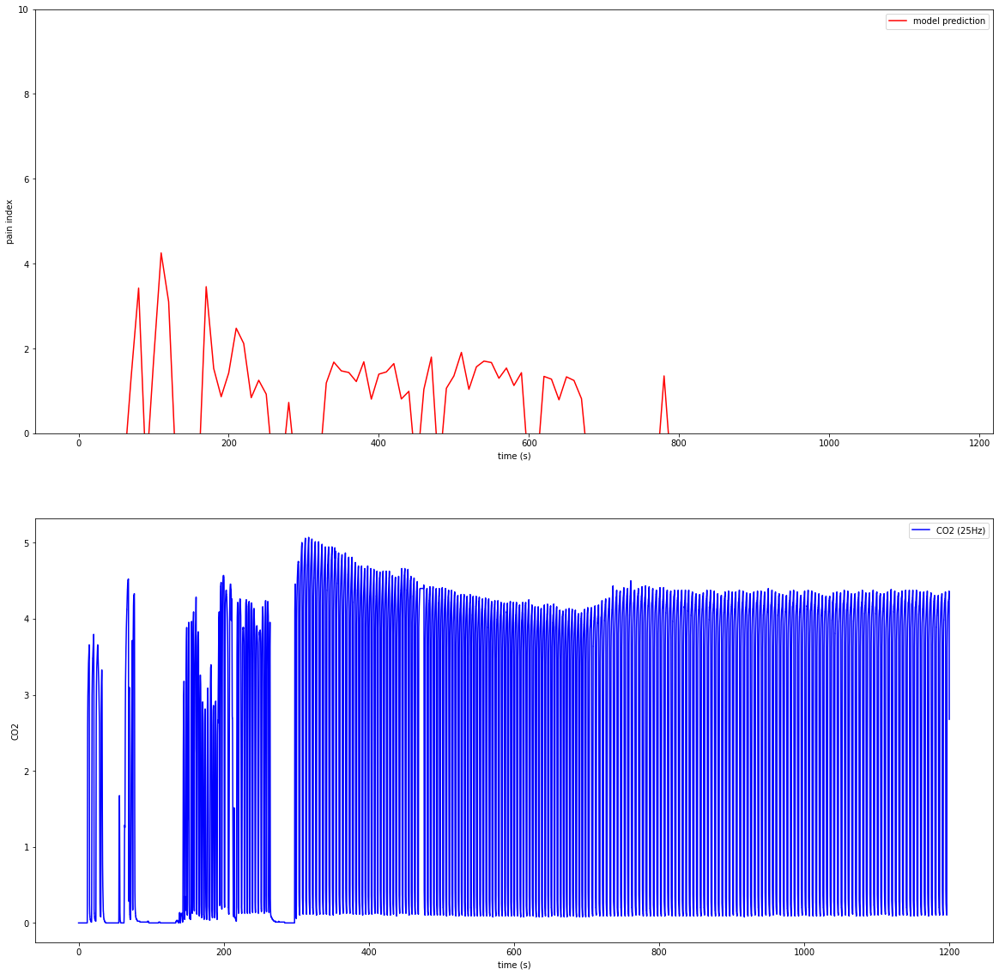

idx: 125,  preop file: R1_200210_223211.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...noise out...ppg0.47368421052631576, ecg0.8181818181818182failed
input 1 ...noise out...ppg0.3076923076923077, ecg0.75failed
input 2 ...noise out...ppg0.4230769230769231, ecg0.5769230769230769failed
input 3 ...noise out...ppg0.2222222222222222, ecg0.6086956521739131failed
input 4 ...noise out...ppg0.034482758620689655, ecg0.5failed
input 5 ...noise out...ppg0.0, ecg0.4074074074074074failed
input 6 ...noise out...ppg0.0, ecg0.35714285714285715failed
input 7 ...pass
input 8 ...pass
input 9 ...pass
input 10 ...noise out...ppg0.0, ecg0.3103448275862069failed
input 11 ...noise out...ppg0.20689655172413793, ecg0.5862068965517241failed
input 12 ...noise out...ppg0.6086956521739131, ecg0.5483870967741935failed
input 13 ...noise out...ppg0.391304347826087, ecg0.4838709677419355failed
input 14 ...pass
input 15 ...pass
input 16 ...pass
input 17 ...p

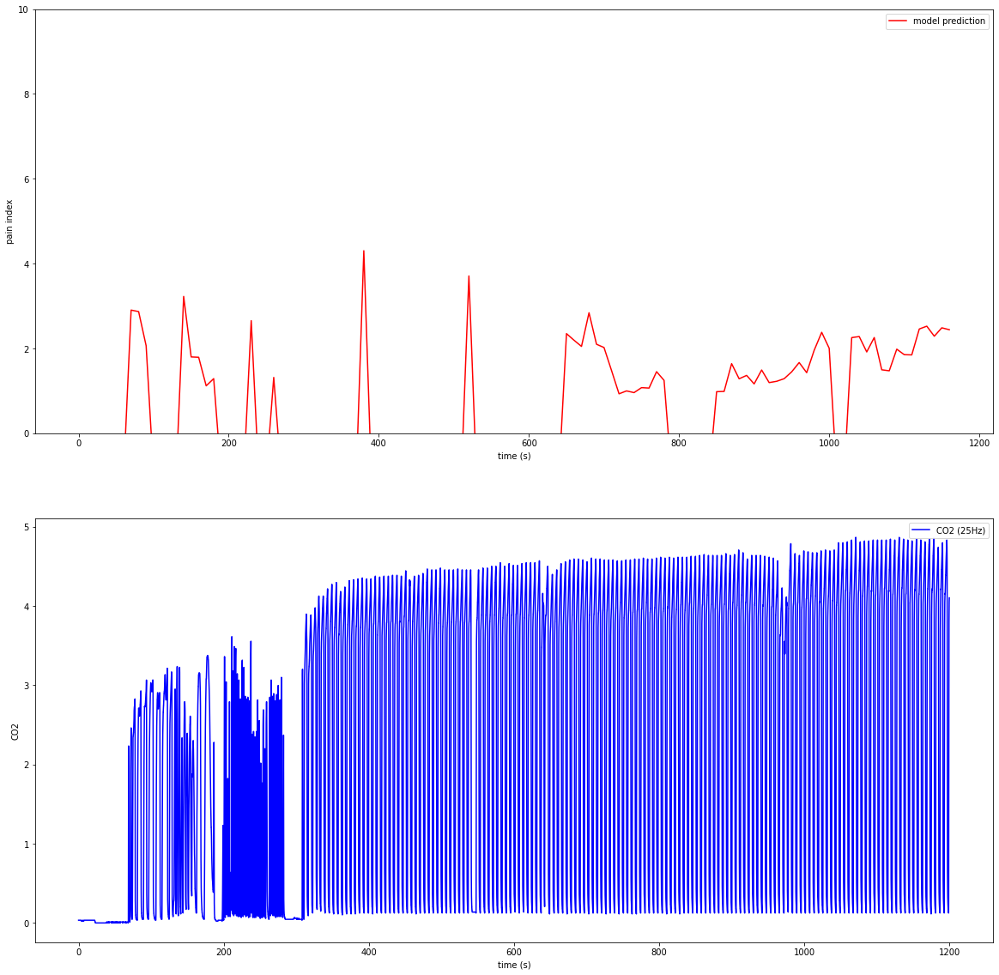

idx: 126,  preop file: F4_190823_075323.vital
no vital co2
idx: 127,  preop file: R3_200805_082433.vital
no vital co2
idx: 128,  preop file: D1_200917_075344.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...peak out...failed
input 1 ...noise out...ppg0.15, ecg1.0failed
input 2 ...noise out...ppg0.45, ecg1.0failed
input 3 ...noise out...ppg0.38095238095238093, ecg1.0failed
input 4 ...noise out...ppg0.14285714285714285, ecg1.0failed
input 5 ...noise out...ppg0.14285714285714285, ecg1.0failed
input 6 ...noise out...ppg0.5, ecg1.0failed
input 7 ...noise out...ppg0.3157894736842105, ecg1.0failed
input 8 ...noise out...ppg0.0, ecg1.0failed
input 9 ...noise out...ppg0.0, ecg0.875failed
input 10 ...noise out...ppg0.15789473684210525, ecg1.0failed
input 11 ...noise out...ppg0.2631578947368421, ecg1.0failed
input 12 ...noise out...ppg0.047619047619047616, ecg1.0failed
input 13 ...noise out...ppg0.05, ecg1.0failed
input 14 ...noise out

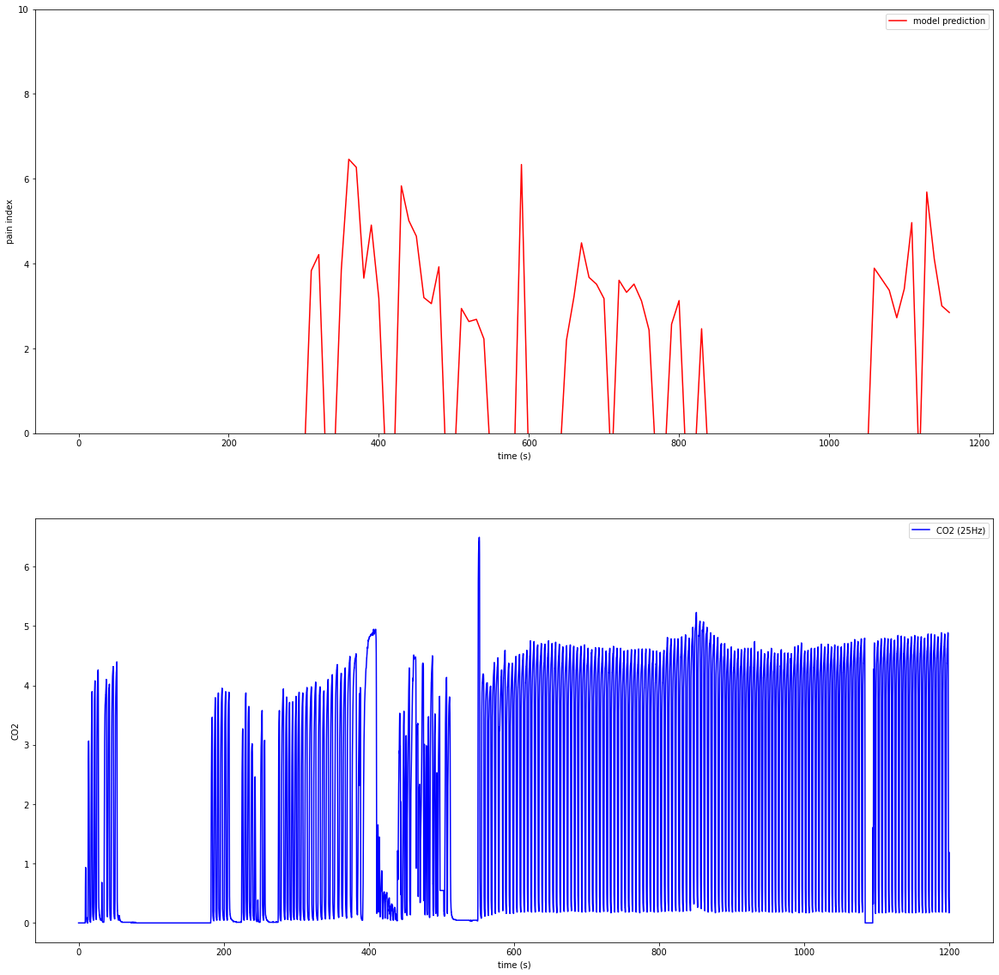

idx: 129,  preop file: F2_190708_153219.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...pass
input 1 ...pass
input 2 ...pass
input 3 ...pass
input 4 ...noise out...ppg0.0, ecg0.34615384615384615failed
input 5 ...pass
input 6 ...pass
input 7 ...noise out...ppg0.0, ecg0.9583333333333334failed
input 8 ...noise out...ppg0.0, ecg0.52failed
input 9 ...pass
input 10 ...pass
input 11 ...pass
input 12 ...pass
input 13 ...pass
input 14 ...pass
input 15 ...pass
input 16 ...pass
input 17 ...pass
input 18 ...pass
input 19 ...pass
input 20 ...pass
input 21 ...pass
input 22 ...pass
input 23 ...pass
input 24 ...pass
input 25 ...pass
input 26 ...pass
input 27 ...pass
input 28 ...noise out...ppg0.8181818181818182, ecg0.03225806451612903failed
input 29 ...noise out...ppg1.0, ecg0.03225806451612903failed
input 30 ...pass
input 31 ...noise out...ppg0.30434782608695654, ecg0.0625failed
input 32 ...noise out...ppg0.9545454545454546, ecg0.0625fail

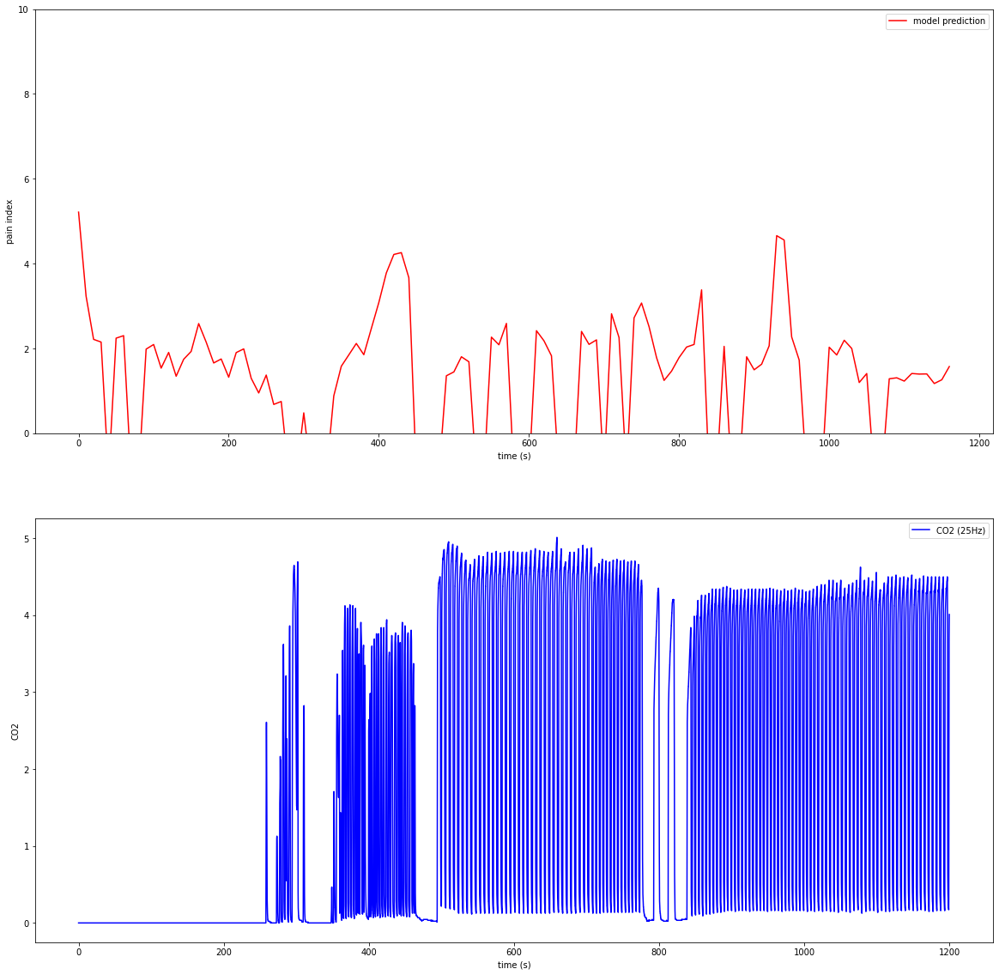

idx: 130,  preop file: E5_200225_151827.vital
no vital co2
idx: 131,  preop file: A1_200103_101612.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...nan out...failed
input 1 ...pass
input 2 ...pass
input 3 ...pass
input 4 ...pass
input 5 ...pass
input 6 ...pass
input 7 ...pass
input 8 ...pass
input 9 ...pass
input 10 ...pass
input 11 ...pass
input 12 ...pass
input 13 ...pass
input 14 ...pass
input 15 ...pass
input 16 ...pass
input 17 ...pass
input 18 ...pass
input 19 ...pass
input 20 ...pass
input 21 ...noise out...ppg0.5, ecg0.10526315789473684failed
input 22 ...noise out...ppg0.6428571428571429, ecg0.35failed
input 23 ...noise out...ppg0.6428571428571429, ecg0.38095238095238093failed
input 24 ...pass
input 25 ...pass
input 26 ...pass
input 27 ...pass
input 28 ...noise out...ppg0.0, ecg0.3888888888888889failed
input 29 ...noise out...ppg0.0, ecg0.4444444444444444failed
input 30 ...noise out...ppg0.0, ecg0.3888888888888889fai

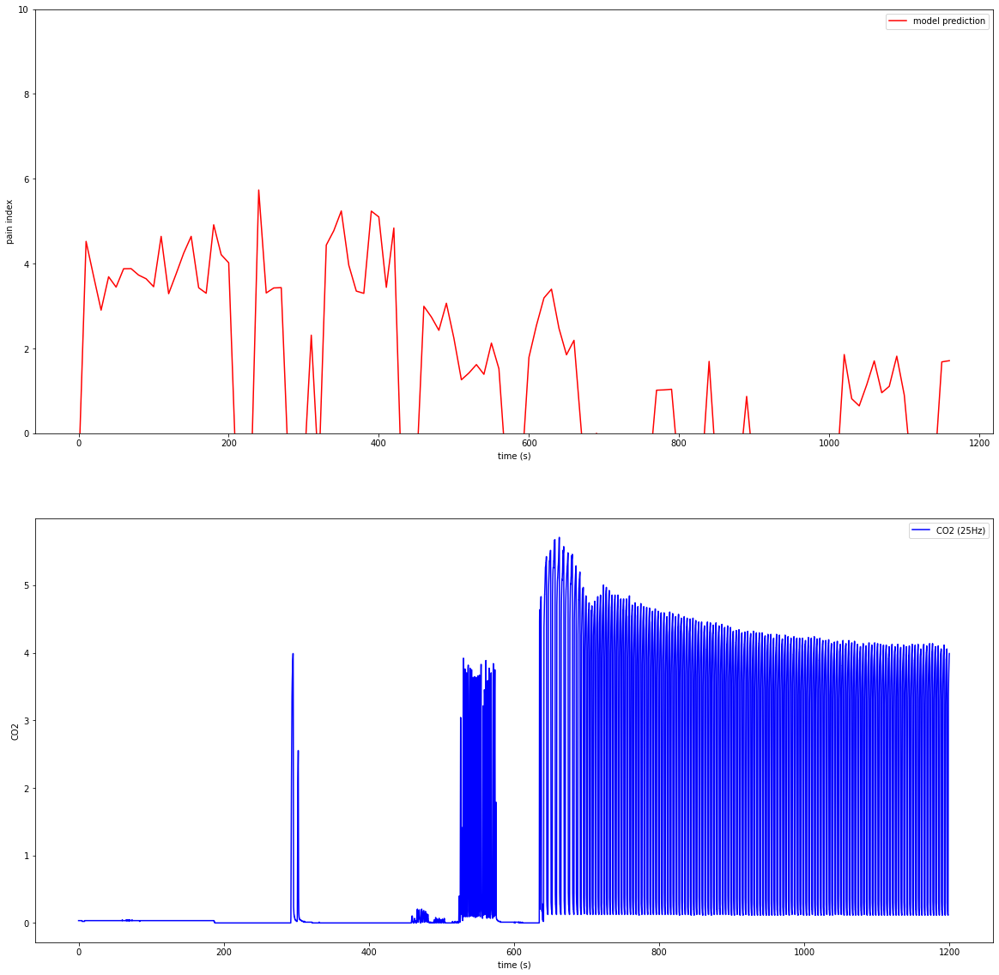

idx: 132,  preop file: E1_191018_112552.vital
no vital co2
idx: 133,  preop file: R8_201007_103459.vital
no vital co2
idx: 134,  preop file: E3_190704_203538.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...nan out...failed
input 1 ...noise out...ppg1.0, ecg1.0failed
input 2 ...noise out...ppg1.0, ecg1.0failed
input 3 ...noise out...ppg1.0, ecg0.9545454545454546failed
input 4 ...noise out...ppg1.0, ecg1.0failed
input 5 ...noise out...ppg1.0, ecg1.0failed
input 6 ...noise out...ppg1.0, ecg1.0failed
input 7 ...noise out...ppg1.0, ecg0.4782608695652174failed
input 8 ...noise out...ppg1.0, ecg0.17391304347826086failed
input 9 ...noise out...ppg1.0, ecg0.5789473684210527failed
input 10 ...noise out...ppg1.0, ecg0.65failed
input 11 ...noise out...ppg1.0, ecg0.6failed
input 12 ...noise out...ppg1.0, ecg0.4444444444444444failed
input 13 ...noise out...ppg1.0, ecg0.42857142857142855failed
input 14 ...noise out...ppg1.0, ecg0.30434782

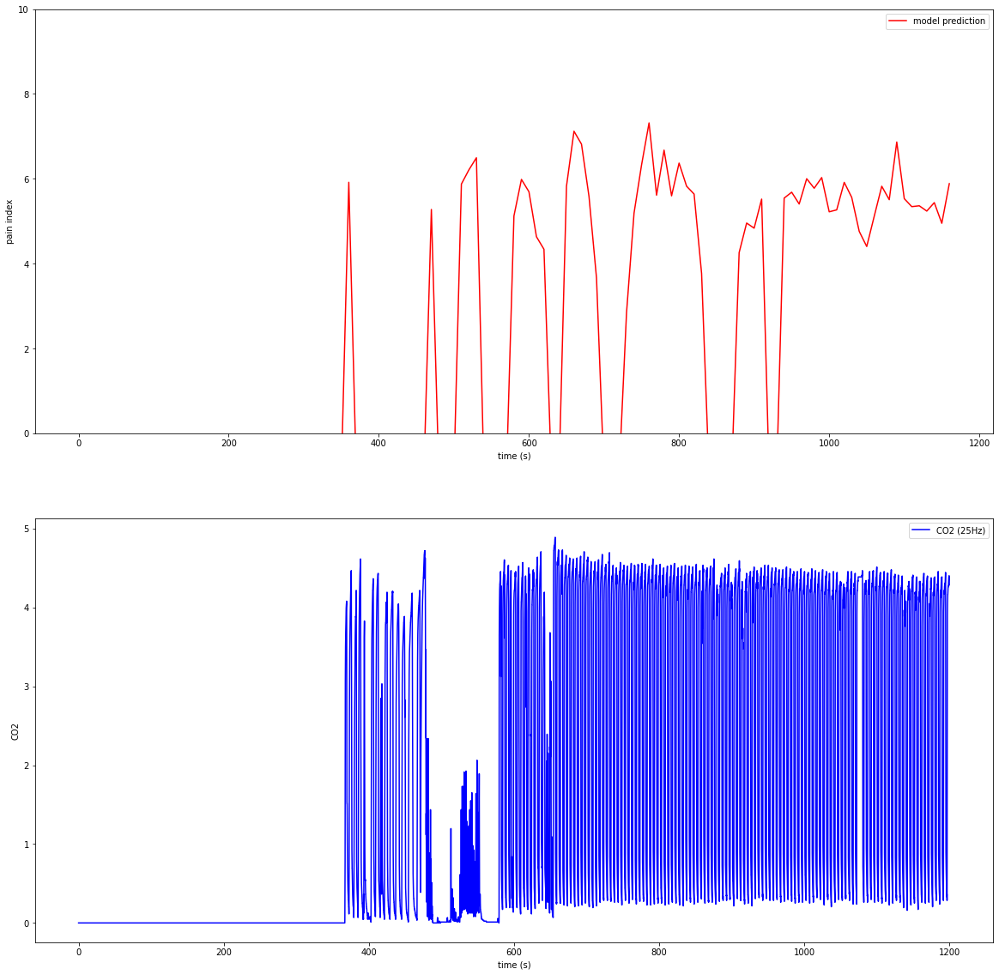

idx: 135,  preop file: D2_200318_143442.vital
no vital co2
idx: 136,  preop file: R6_200727_133111.vital
no vital co2
idx: 137,  preop file: E3_190425_080952.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...pass
input 1 ...pass
input 2 ...pass
input 3 ...pass
input 4 ...pass
input 5 ...pass
input 6 ...pass
input 7 ...pass
input 8 ...pass
input 9 ...noise out...ppg0.045454545454545456, ecg0.3157894736842105failed
input 10 ...pass
input 11 ...noise out...ppg0.14285714285714285, ecg0.6666666666666666failed
input 12 ...noise out...ppg0.2631578947368421, ecg0.5263157894736842failed
input 13 ...noise out...ppg0.6470588235294118, ecg0.23809523809523808failed
input 14 ...noise out...ppg0.47058823529411764, ecg0.7894736842105263failed
input 15 ...noise out...ppg0.5625, ecg1.0failed
input 16 ...noise out...ppg0.8235294117647058, ecg1.0failed
input 17 ...noise out...ppg1.0, ecg1.0failed
input 18 ...noise out...ppg0.2777777777777778, ec

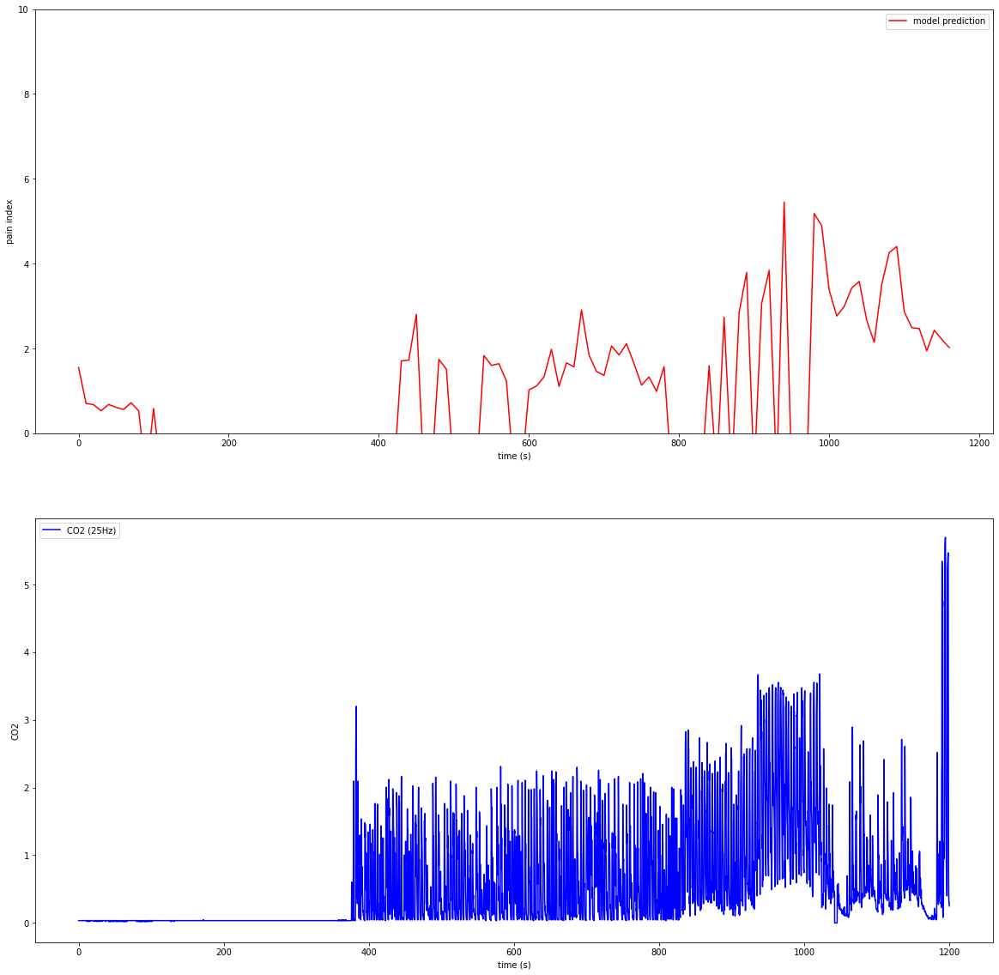

idx: 138,  preop file: R4_200302_155537.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...pass
input 1 ...pass
input 2 ...noise out...ppg0.35714285714285715, ecg1.0failed
input 3 ...noise out...ppg0.34615384615384615, ecg1.0failed
input 4 ...noise out...ppg0.2692307692307692, ecg1.0failed
input 5 ...noise out...ppg0.17857142857142858, ecg1.0failed
input 6 ...noise out...ppg0.2857142857142857, ecg1.0failed
input 7 ...noise out...ppg0.21428571428571427, ecg1.0failed
input 8 ...noise out...ppg0.0, ecg1.0failed
input 9 ...noise out...ppg0.0, ecg0.8125failed
input 10 ...noise out...ppg0.0, ecg1.0failed
input 11 ...noise out...ppg0.0, ecg1.0failed
input 12 ...noise out...ppg0.0, ecg1.0failed
input 13 ...noise out...ppg0.07407407407407407, ecg1.0failed
input 14 ...noise out...ppg0.3076923076923077, ecg1.0failed
input 15 ...noise out...ppg0.4166666666666667, ecg1.0failed
input 16 ...noise out...ppg0.3333333333333333, ecg0.41176470588

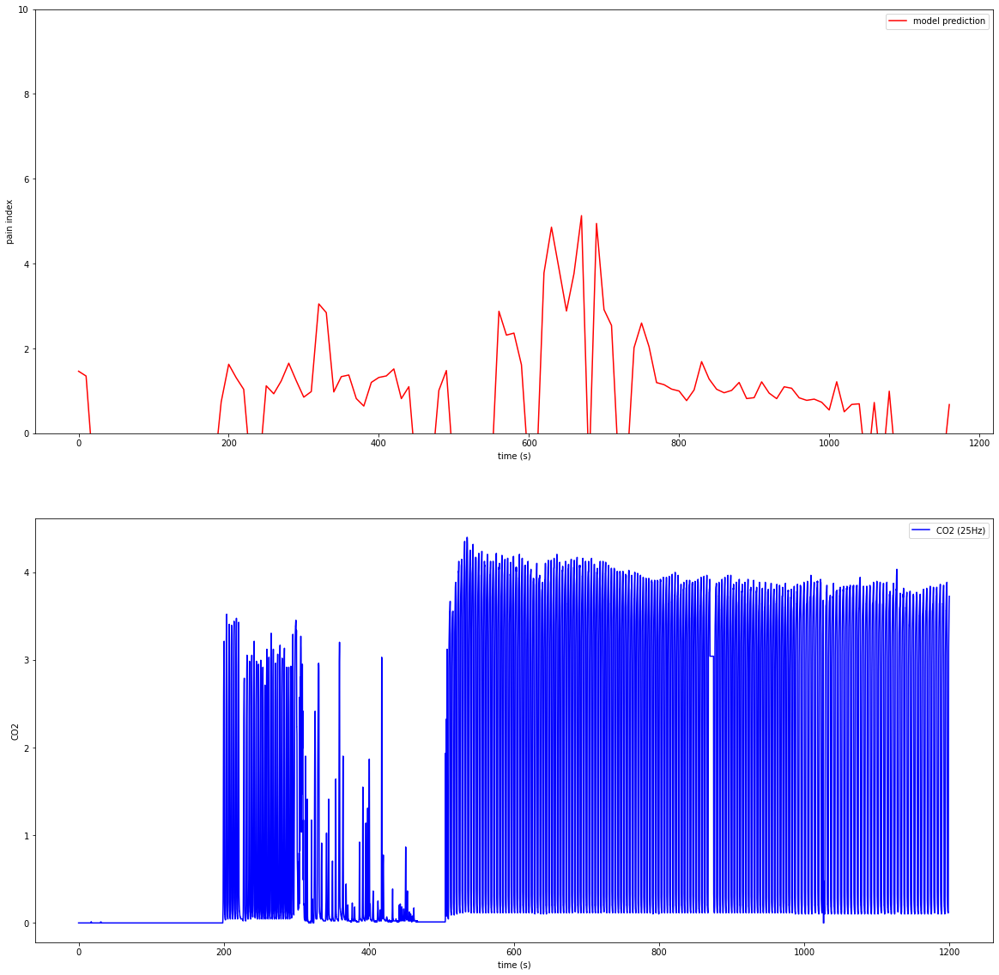

idx: 139,  preop file: D2_190528_124629.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...nan out...failed
input 1 ...noise out...ppg0.9, ecg0.6956521739130435failed
input 2 ...noise out...ppg0.9473684210526315, ecg1.0failed
input 3 ...noise out...ppg0.6363636363636364, ecg1.0failed
input 4 ...noise out...ppg0.041666666666666664, ecg1.0failed
input 5 ...noise out...ppg0.0, ecg1.0failed
input 6 ...noise out...ppg0.08695652173913043, ecg0.47058823529411764failed
input 7 ...noise out...ppg0.043478260869565216, ecg0.4090909090909091failed
input 8 ...noise out...ppg0.08, ecg0.4failed
input 9 ...noise out...ppg0.08, ecg0.32failed
input 10 ...noise out...ppg0.20833333333333334, ecg0.3333333333333333failed
input 11 ...pass
input 12 ...pass
input 13 ...pass
input 14 ...noise out...ppg0.0, ecg0.375failed
input 15 ...noise out...ppg0.0, ecg0.375failed
input 16 ...noise out...ppg0.0, ecg0.32failed
input 17 ...pass
input 18 ...pass
input 

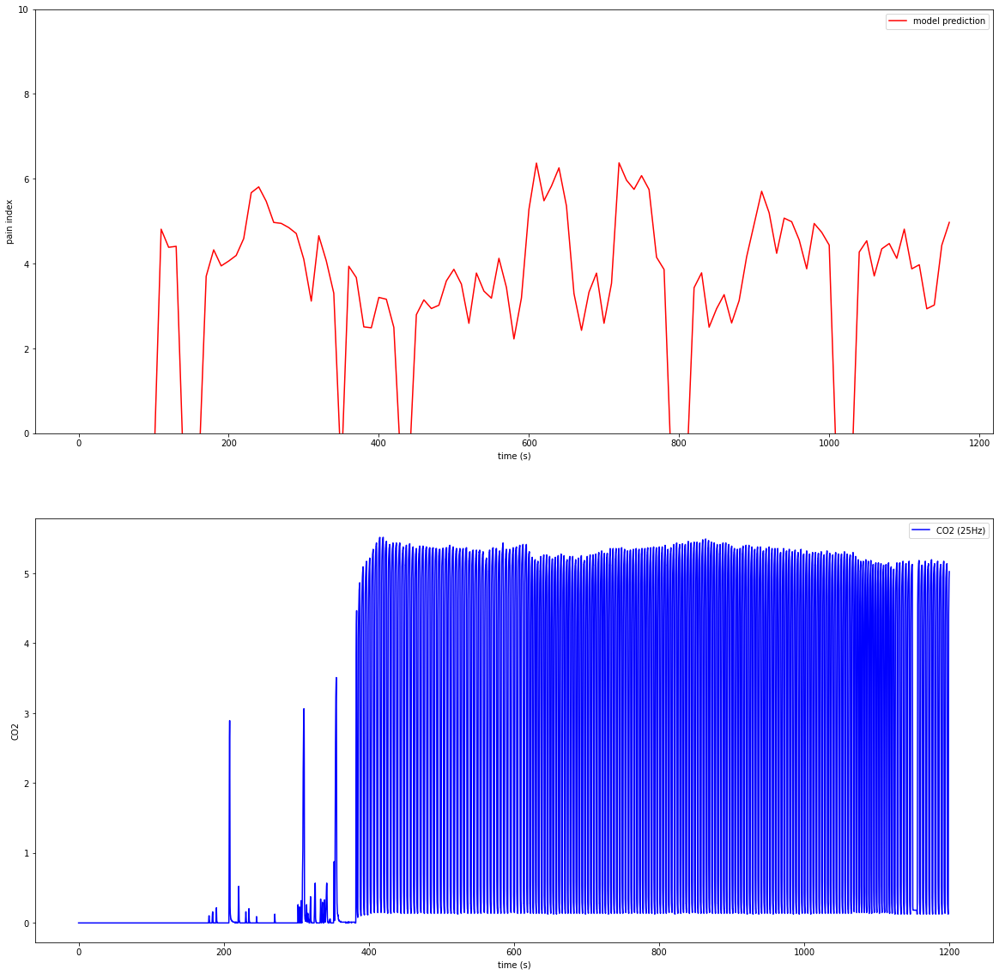

idx: 140,  preop file: D1_190611_080221.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...noise out...ppg0.05, ecg0.55failed
input 1 ...noise out...ppg0.043478260869565216, ecg0.4782608695652174failed
input 2 ...noise out...ppg0.125, ecg0.6666666666666666failed
input 3 ...noise out...ppg0.12, ecg0.64failed
input 4 ...noise out...ppg0.0, ecg0.391304347826087failed
input 5 ...pass
input 6 ...pass
input 7 ...pass
input 8 ...pass
input 9 ...pass
input 10 ...noise out...ppg0.07692307692307693, ecg0.3076923076923077failed
input 11 ...noise out...ppg0.21739130434782608, ecg0.375failed
input 12 ...pass
input 13 ...pass
input 14 ...pass
input 15 ...pass
input 16 ...pass
input 17 ...pass
input 18 ...pass
input 19 ...pass
input 20 ...pass
input 21 ...pass
input 22 ...pass
input 23 ...pass
input 24 ...pass
input 25 ...pass
input 26 ...pass
input 27 ...pass
input 28 ...pass
input 29 ...pass
input 30 ...pass
input 31 ...pass
input 32 ...no

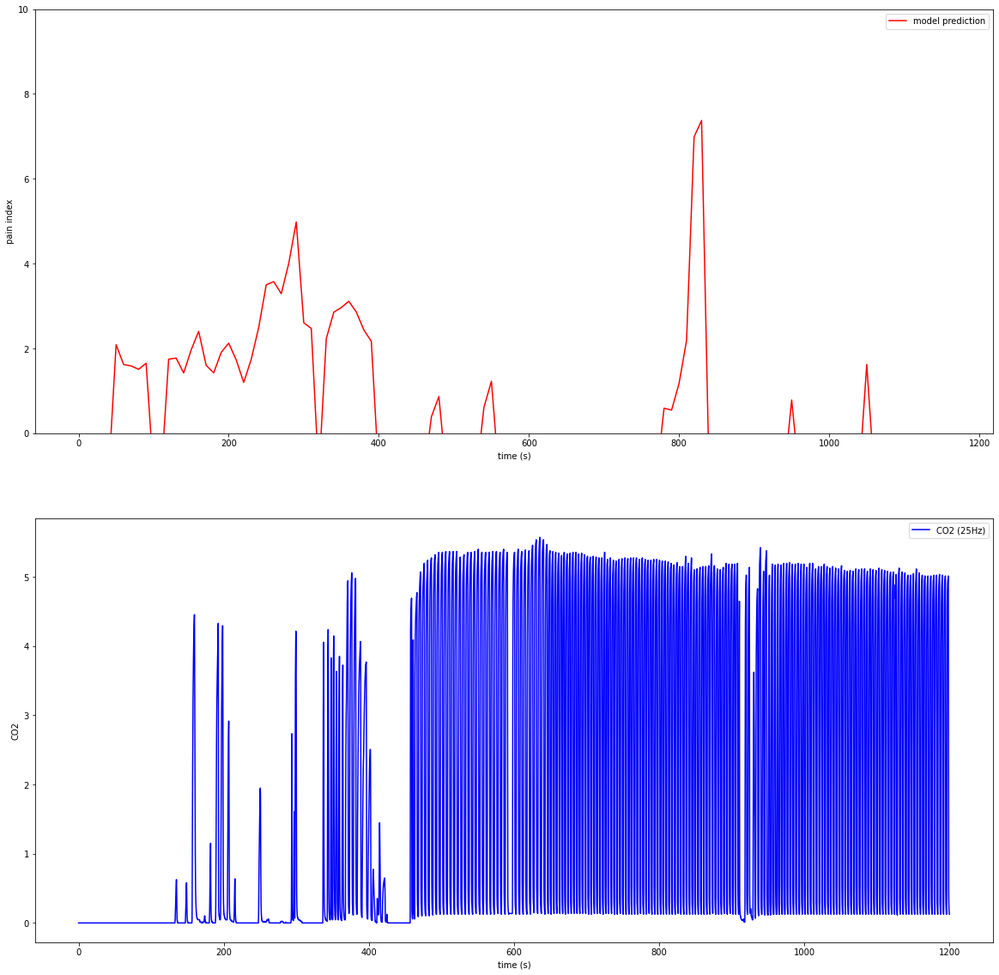

idx: 141,  preop file: E5_190711_193821.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...nan out...failed
input 1 ...noise out...ppg0.0, ecg0.4117647058823529failed
input 2 ...pass
input 3 ...pass
input 4 ...pass
input 5 ...noise out...ppg0.0, ecg0.47058823529411764failed
input 6 ...noise out...ppg0.0, ecg0.7777777777777778failed
input 7 ...noise out...ppg0.11764705882352941, ecg0.5263157894736842failed
input 8 ...noise out...ppg0.35294117647058826, ecg0.2631578947368421failed
input 9 ...noise out...ppg0.23529411764705882, ecg0.3333333333333333failed
input 10 ...noise out...ppg0.11764705882352941, ecg0.3888888888888889failed
input 11 ...noise out...ppg0.1875, ecg0.3333333333333333failed
input 12 ...noise out...ppg0.0625, ecg0.4117647058823529failed
input 13 ...noise out...ppg0.11764705882352941, ecg0.5882352941176471failed
input 14 ...pass
input 15 ...pass
input 16 ...pass
input 17 ...pass
input 18 ...pass
input 19 ...noise 

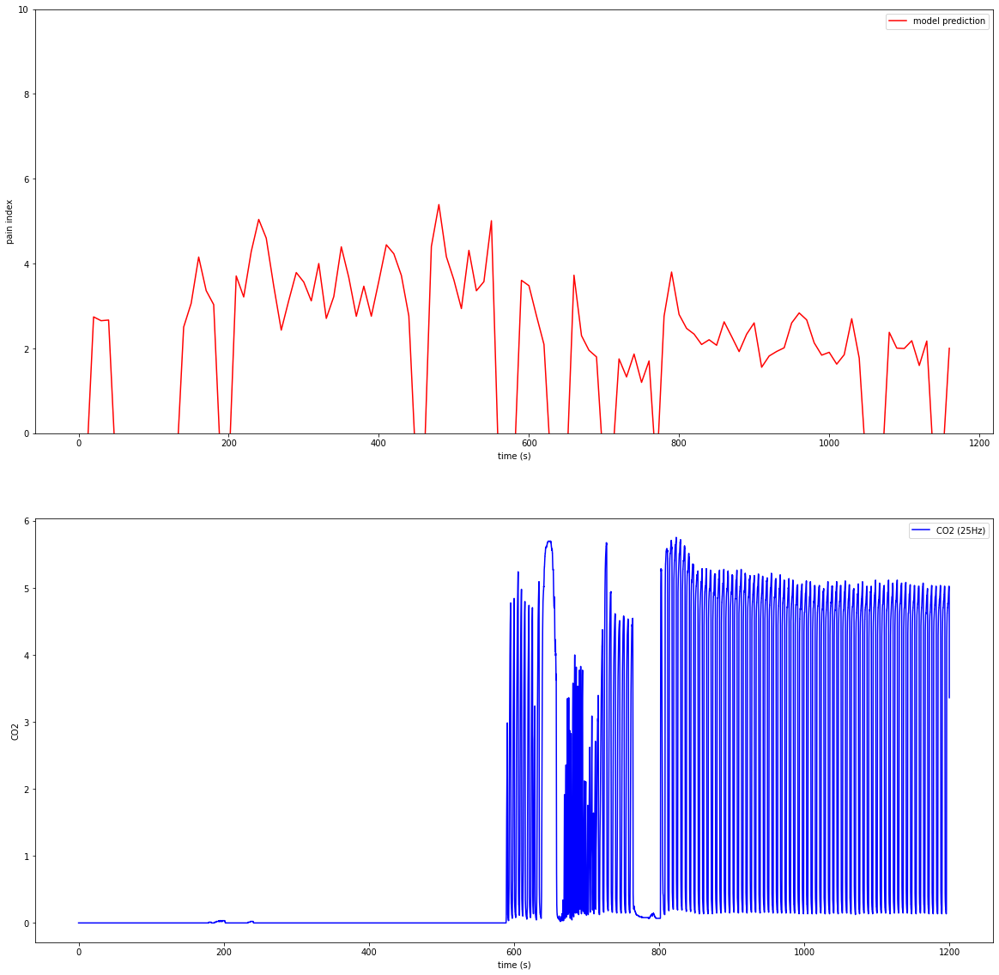

idx: 142,  preop file: R1_200917_074339.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...noise out...ppg1.0, ecg1.0failed
input 1 ...noise out...ppg1.0, ecg1.0failed
input 2 ...noise out...ppg1.0, ecg1.0failed
input 3 ...noise out...ppg1.0, ecg1.0failed
input 4 ...noise out...ppg0.8421052631578947, ecg1.0failed
input 5 ...noise out...ppg0.7, ecg1.0failed
input 6 ...noise out...ppg0.2857142857142857, ecg1.0failed
input 7 ...noise out...ppg0.0, ecg1.0failed
input 8 ...peak out...failed
input 9 ...noise out...ppg0.08695652173913043, ecg1.0failed
input 10 ...noise out...ppg0.043478260869565216, ecg1.0failed
input 11 ...noise out...ppg0.0, ecg1.0failed
input 12 ...noise out...ppg0.045454545454545456, ecg0.9411764705882353failed
input 13 ...noise out...ppg0.0, ecg0.35failed
input 14 ...pass
input 15 ...pass
input 16 ...pass
input 17 ...pass
input 18 ...pass
input 19 ...pass
input 20 ...pass
input 21 ...pass
input 22 ...pass
input 

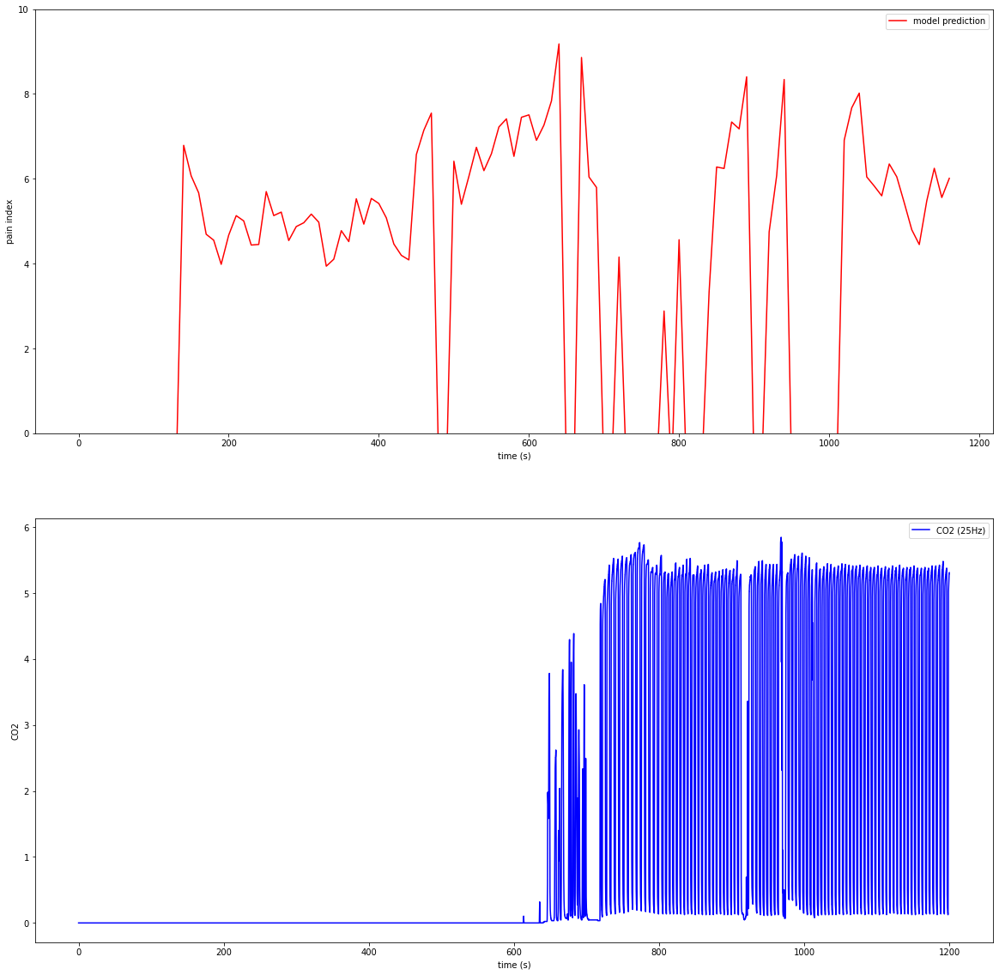

idx: 143,  preop file: D5_190906_075630.vital
no vital co2
idx: 144,  preop file: C5_190820_115115.vital
no vital co2
idx: 145,  preop file: C3_200221_152702.vital
no vital co2
idx: 146,  preop file: E6_190424_074830.vital
no vital co2
idx: 147,  preop file: R9_200604_105516.vital
no vital co2
idx: 148,  preop file: A6_200116_080015.vital
no vital co2
idx: 149,  preop file: D1_190530_124232.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...noise out...ppg0.0, ecg0.6842105263157895failed
input 1 ...noise out...ppg0.0, ecg0.4failed
input 2 ...pass
input 3 ...noise out...ppg0.0, ecg0.36363636363636365failed
input 4 ...noise out...ppg0.045454545454545456, ecg1.0failed
input 5 ...noise out...ppg0.043478260869565216, ecg0.9047619047619048failed
input 6 ...noise out...ppg0.0, ecg0.45454545454545453failed
input 7 ...pass
input 8 ...pass
input 9 ...pass
input 10 ...pass
input 11 ...pass
input 12 ...pass
input 13 ...pass
input 14 ...pa

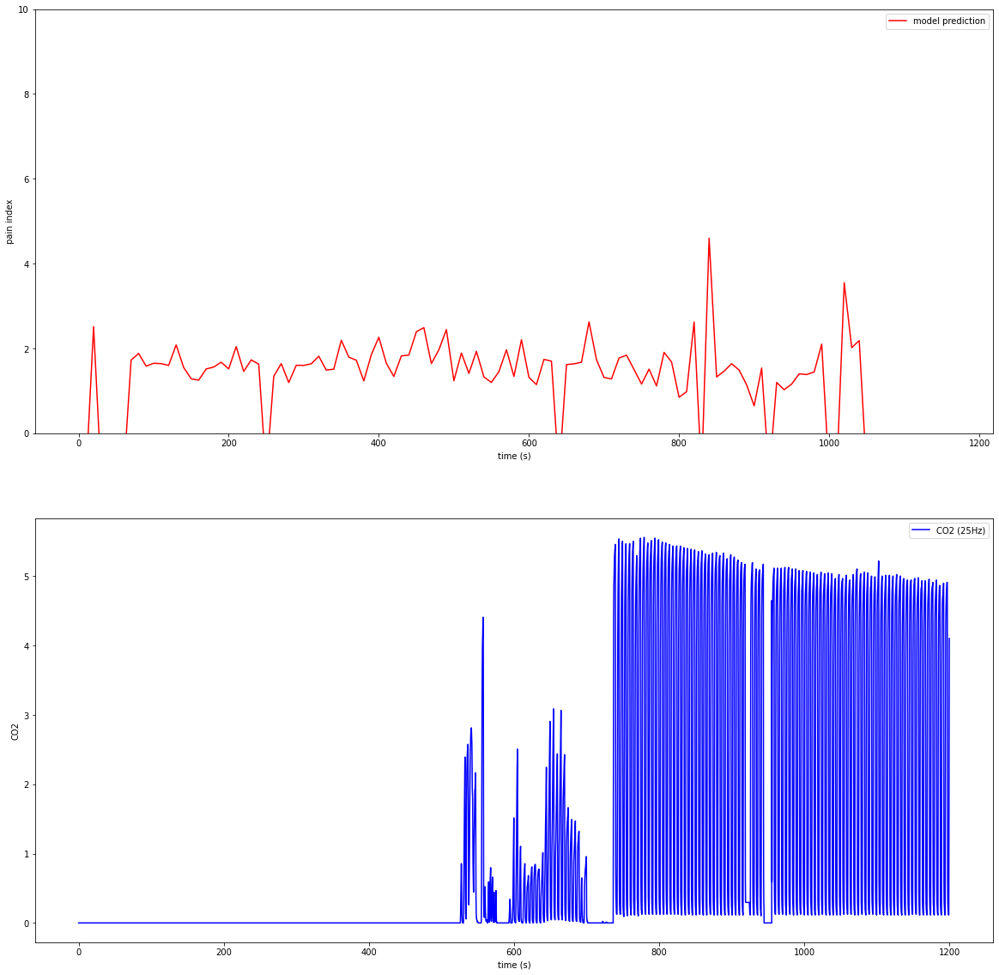

idx: 150,  preop file: R4_200302_120010.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...noise out...ppg0.0, ecg0.6666666666666666failed
input 1 ...noise out...ppg0.0, ecg0.5failed
input 2 ...noise out...ppg0.0, ecg0.5882352941176471failed
input 3 ...pass
input 4 ...noise out...ppg0.0, ecg0.42105263157894735failed
input 5 ...noise out...ppg0.0, ecg0.5263157894736842failed
input 6 ...noise out...ppg0.0, ecg0.47368421052631576failed
input 7 ...noise out...ppg0.3125, ecg0.55failed
input 8 ...noise out...ppg0.3125, ecg0.15failed
input 9 ...noise out...ppg0.05555555555555555, ecg0.47368421052631576failed
input 10 ...pass
input 11 ...noise out...ppg0.0, ecg0.47368421052631576failed
input 12 ...noise out...ppg0.0, ecg0.6842105263157895failed
input 13 ...noise out...ppg0.0, ecg0.5789473684210527failed
input 14 ...noise out...ppg0.11764705882352941, ecg0.7failed
input 15 ...noise out...ppg0.11764705882352941, ecg0.7failed
input 16 ..

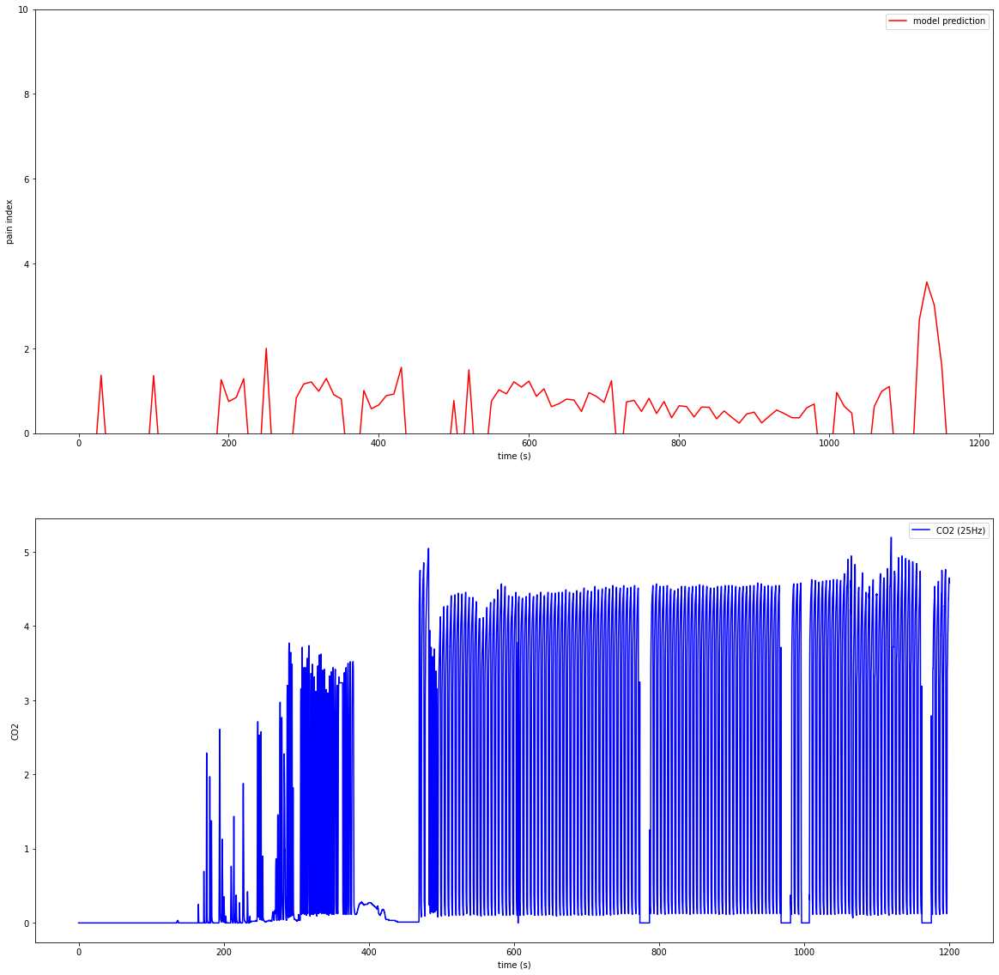

idx: 151,  preop file: D3_200110_074829.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...noise out...ppg0.625, ecg1.0failed
input 1 ...noise out...ppg0.7916666666666666, ecg1.0failed
input 2 ...noise out...ppg0.5, ecg1.0failed
input 3 ...noise out...ppg0.5555555555555556, ecg1.0failed
input 4 ...noise out...ppg0.5555555555555556, ecg1.0failed
input 5 ...noise out...ppg0.4230769230769231, ecg0.8214285714285714failed
input 6 ...noise out...ppg0.16666666666666666, ecg0.5862068965517241failed
input 7 ...noise out...ppg0.0, ecg0.5172413793103449failed
input 8 ...noise out...ppg0.0, ecg0.5517241379310345failed
input 9 ...noise out...ppg0.0967741935483871, ecg0.9615384615384616failed
input 10 ...noise out...ppg0.1935483870967742, ecg1.0failed
input 11 ...noise out...ppg0.13333333333333333, ecg0.9642857142857143failed
input 12 ...noise out...ppg0.4444444444444444, ecg0.9285714285714286failed
input 13 ...noise out...ppg0.214285714285

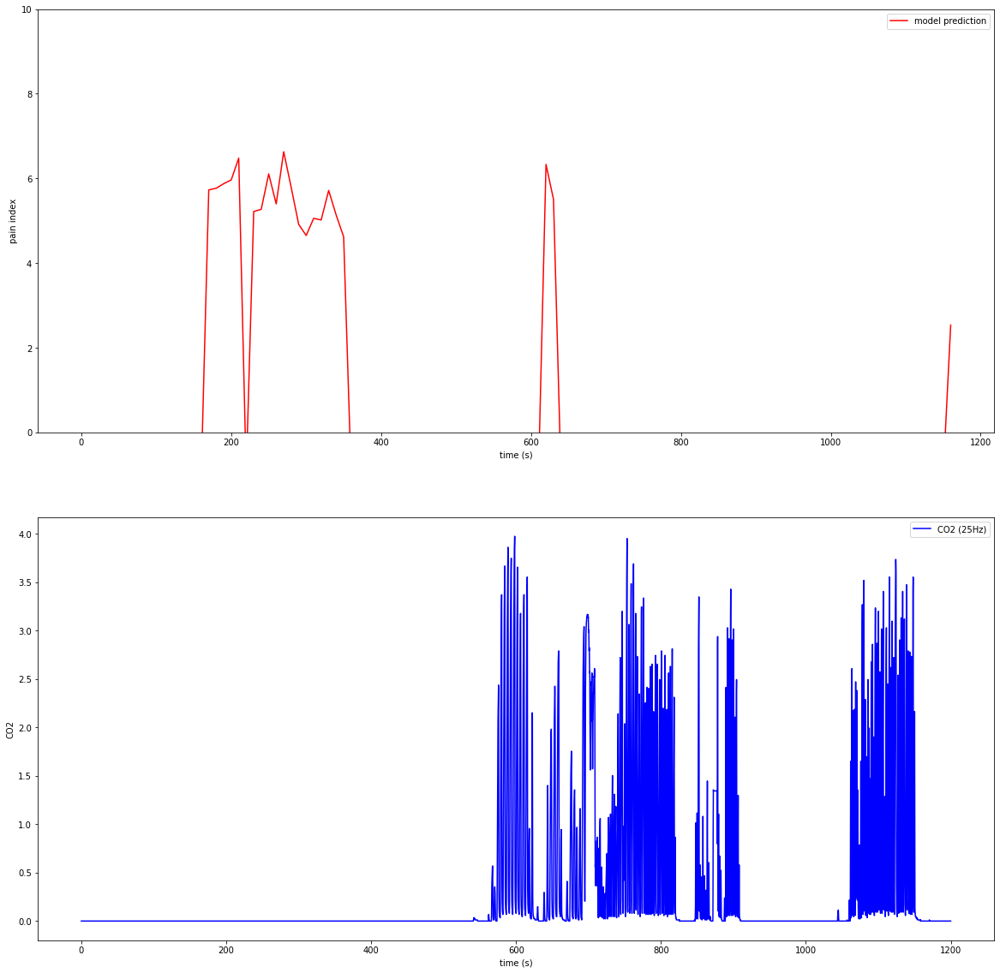

idx: 152,  preop file: E2_200313_113657.vital
no vital co2
idx: 153,  preop file: F2_190527_122647.vital
no vital co2
idx: 154,  preop file: E6_190711_075120.vital
no vital co2
idx: 155,  preop file: R7_200205_132213.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...nan out...failed
input 1 ...noise out...ppg0.4, ecg0.9444444444444444failed
input 2 ...noise out...ppg0.0, ecg1.0failed
input 3 ...noise out...ppg1.0, ecg1.0failed
input 4 ...noise out...ppg0.0, ecg1.0failed
input 5 ...noise out...ppg0.16666666666666666, ecg1.0failed
input 6 ...noise out...ppg0.08333333333333333, ecg0.8260869565217391failed
input 7 ...noise out...ppg0.42857142857142855, ecg1.0failed
input 8 ...noise out...ppg0.0, ecg1.0failed
input 9 ...noise out...ppg0.0, ecg1.0failed
input 10 ...noise out...ppg0.0, ecg1.0failed
input 11 ...noise out...ppg0.0, ecg1.0failed
input 12 ...noise out...ppg0.0, ecg1.0failed
input 13 ...noise out...ppg0.0, ecg1.0failed
i

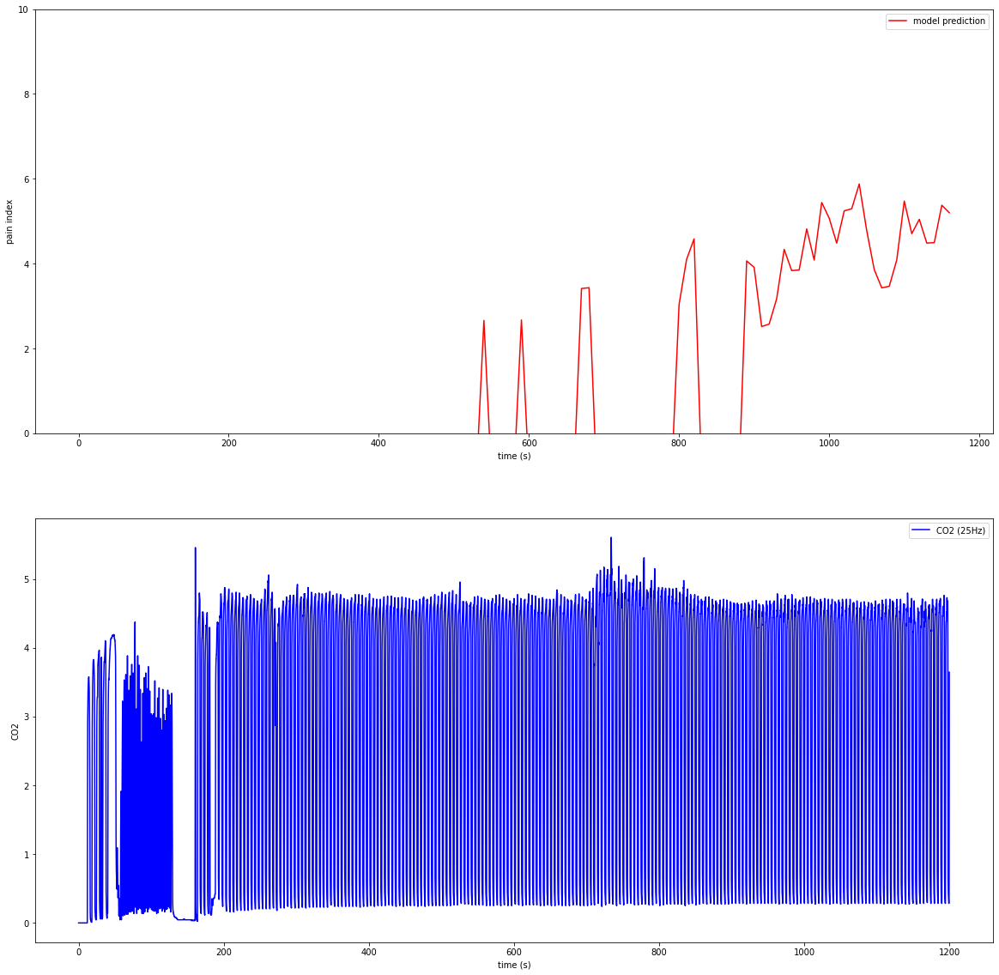

idx: 156,  preop file: D1_200511_160325.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...noise out...ppg0.0, ecg0.7647058823529411failed
input 1 ...noise out...ppg0.0, ecg0.9473684210526315failed
input 2 ...noise out...ppg0.0, ecg0.7894736842105263failed
input 3 ...noise out...ppg0.2, ecg0.85failed
input 4 ...noise out...ppg0.38095238095238093, ecg0.7777777777777778failed
input 5 ...noise out...ppg0.2, ecg1.0failed
input 6 ...noise out...ppg0.4444444444444444, ecg1.0failed
input 7 ...noise out...ppg0.5555555555555556, ecg1.0failed
input 8 ...noise out...ppg0.15, ecg0.6842105263157895failed
input 9 ...noise out...ppg0.3333333333333333, ecg0.7142857142857143failed
input 10 ...noise out...ppg0.47619047619047616, ecg0.4583333333333333failed
input 11 ...pass
input 12 ...pass
input 13 ...pass
input 14 ...noise out...ppg0.0, ecg0.3076923076923077failed
input 15 ...pass
input 16 ...pass
input 17 ...noise out...ppg0.0, ecg0.739130434

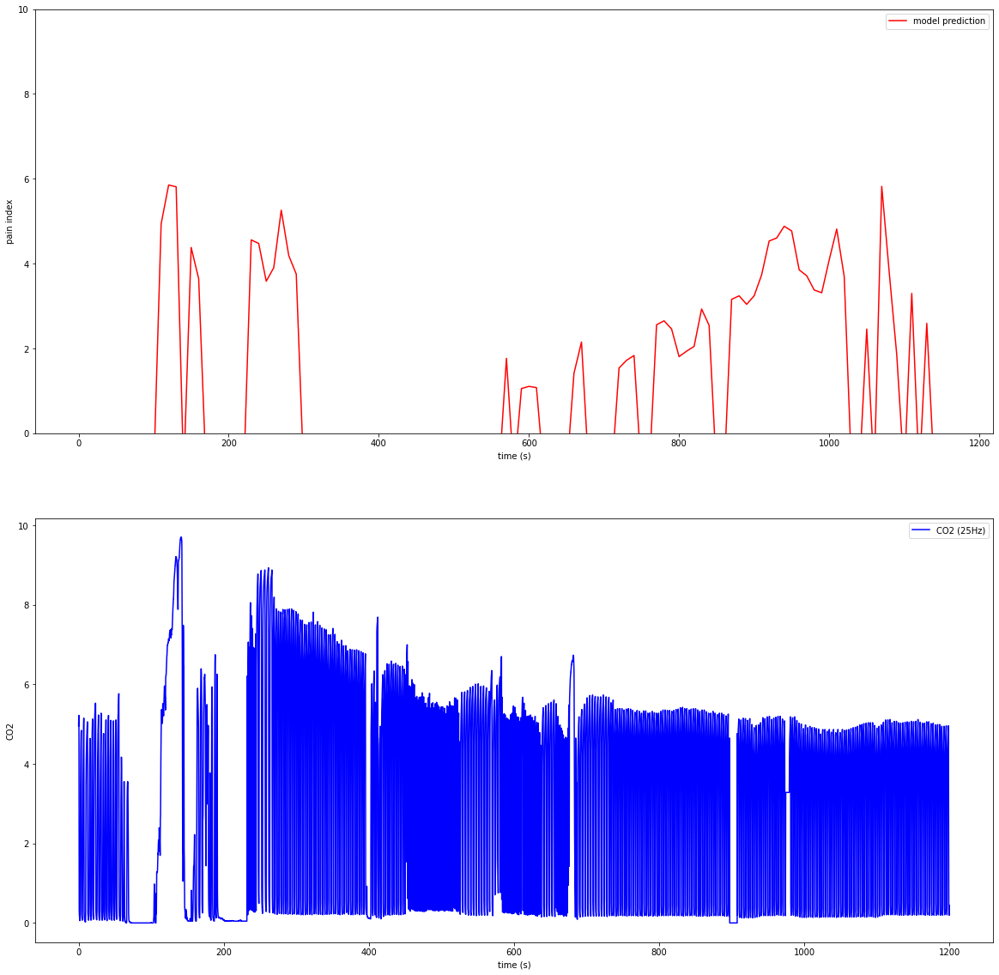

idx: 157,  preop file: R1_200526_121104.vital
existing CO2 curve...no ppg
idx: 158,  preop file: A2_190716_124127.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...noise out...ppg0.16, ecg0.8333333333333334failed
input 1 ...noise out...ppg0.0, ecg0.6086956521739131failed
input 2 ...noise out...ppg0.0, ecg1.0failed
input 3 ...noise out...ppg0.0, ecg1.0failed
input 4 ...noise out...ppg0.0, ecg0.7619047619047619failed
input 5 ...noise out...ppg0.0, ecg0.7391304347826086failed
input 6 ...noise out...ppg0.0, ecg0.5833333333333334failed
input 7 ...pass
input 8 ...pass
input 9 ...pass
input 10 ...pass
input 11 ...noise out...ppg0.0, ecg0.7391304347826086failed
input 12 ...noise out...ppg0.0, ecg0.8181818181818182failed
input 13 ...pass
input 14 ...pass
input 15 ...pass
input 16 ...pass
input 17 ...pass
input 18 ...pass
input 19 ...pass
input 20 ...pass
input 21 ...pass
input 22 ...pass
input 23 ...pass
input 24 ...pass
input 25 ...p

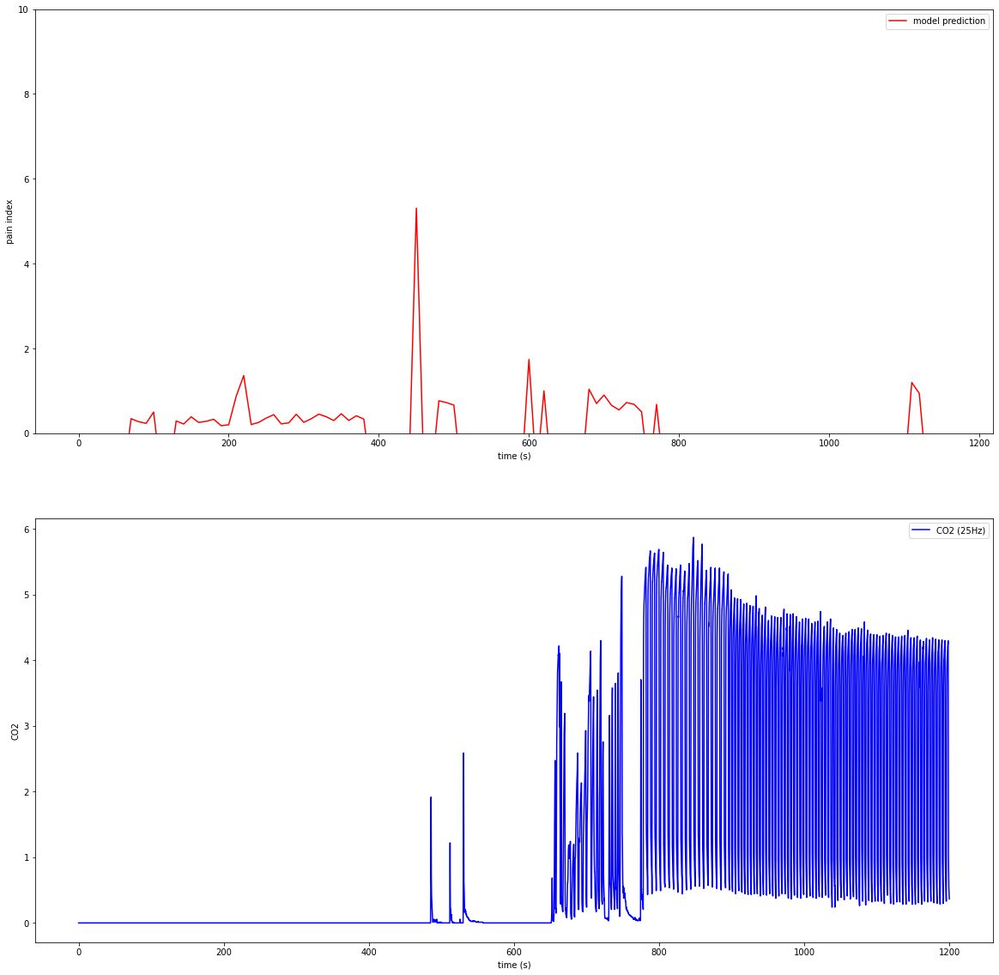

idx: 159,  preop file: E4_200731_075007.vital
existing CO2 curve...no ppg
idx: 160,  preop file: F1_190705_123454.vital
no vital co2
idx: 161,  preop file: F3_200108_135339.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...peak out...failed
input 1 ...noise out...ppg0.05263157894736842, ecg1.0failed
input 2 ...noise out...ppg0.10526315789473684, ecg1.0failed
input 3 ...noise out...ppg0.0, ecg1.0failed
input 4 ...noise out...ppg0.0, ecg1.0failed
input 5 ...noise out...ppg0.0, ecg1.0failed
input 6 ...noise out...ppg0.0, ecg1.0failed
input 7 ...noise out...ppg0.0, ecg1.0failed
input 8 ...noise out...ppg0.05263157894736842, ecg1.0failed
input 9 ...noise out...ppg0.05263157894736842, ecg1.0failed
input 10 ...noise out...ppg0.058823529411764705, ecg1.0failed
input 11 ...noise out...ppg0.058823529411764705, ecg1.0failed
input 12 ...noise out...ppg0.0, ecg1.0failed
input 13 ...noise out...ppg0.0, ecg1.0failed
input 14 ...noise out...

input 42 ...noise out...ppg0.0, ecg0.8125failed
input 43 ...noise out...ppg0.0, ecg1.0failed
input 44 ...noise out...ppg0.0, ecg1.0failed
input 45 ...noise out...ppg0.0, ecg1.0failed
input 46 ...noise out...ppg0.0, ecg0.7058823529411765failed
input 47 ...noise out...ppg0.0, ecg0.9411764705882353failed
input 48 ...noise out...ppg0.0, ecg0.6875failed
input 49 ...noise out...ppg0.0, ecg0.8823529411764706failed
input 50 ...noise out...ppg0.0, ecg1.0failed
input 51 ...noise out...ppg0.0, ecg1.0failed
input 52 ...noise out...ppg0.09090909090909091, ecg0.5failed
input 53 ...noise out...ppg0.045454545454545456, ecg1.0failed
input 54 ...noise out...ppg0.0, ecg0.5625failed
input 55 ...noise out...ppg0.0, ecg0.35294117647058826failed
input 56 ...noise out...ppg0.0, ecg1.0failed
input 57 ...noise out...ppg0.0, ecg1.0failed
input 58 ...noise out...ppg0.0, ecg0.3333333333333333failed
input 59 ...noise out...ppg0.0, ecg0.3157894736842105failed
input 60 ...pass
input 61 ...noise out...ppg0.0, ecg1.0fa

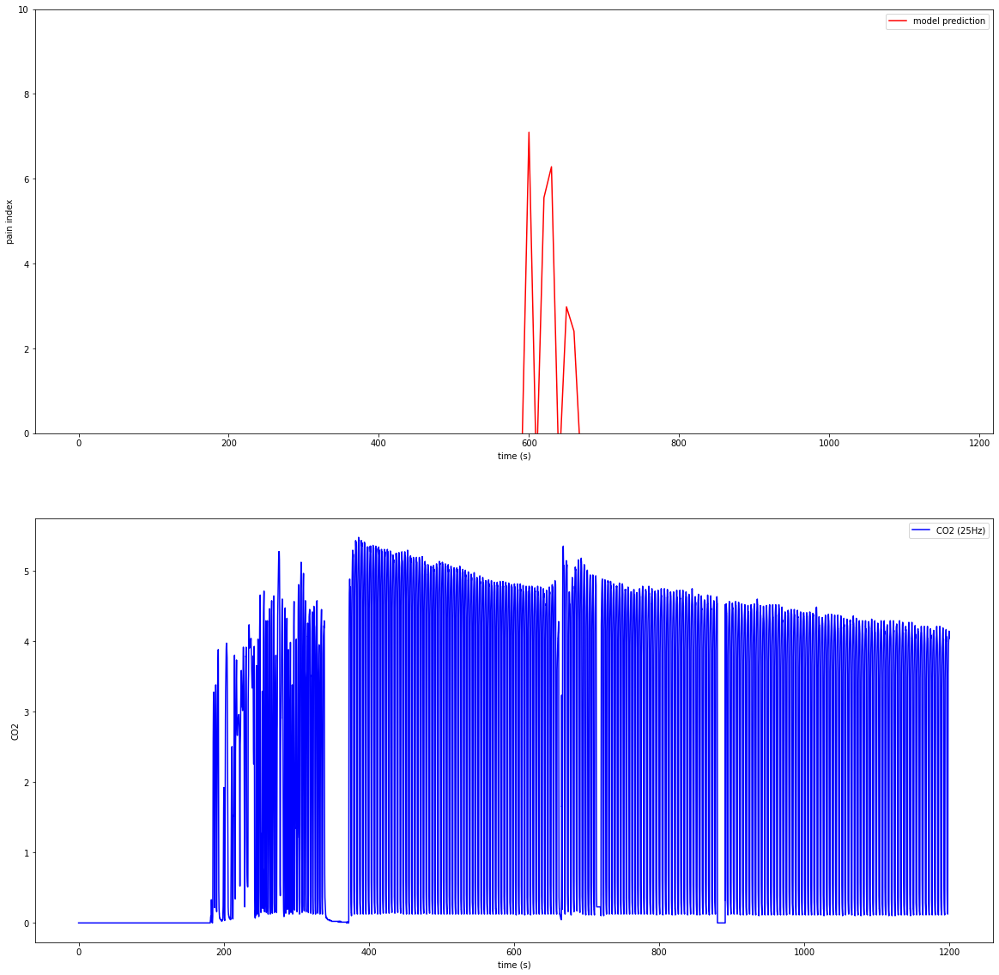

idx: 163,  preop file: D4_190507_133515.vital
no vital co2
idx: 164,  preop file: C3_190430_102422.vital
no vital co2
idx: 165,  preop file: D1_190917_080230.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...nan out...failed
input 1 ...noise out...ppg1.0, ecg1.0failed
input 2 ...noise out...ppg1.0, ecg1.0failed
input 3 ...noise out...ppg1.0, ecg1.0failed
input 4 ...noise out...ppg0.21428571428571427, ecg1.0failed
input 5 ...noise out...ppg0.0, ecg1.0failed
input 6 ...noise out...ppg0.21428571428571427, ecg1.0failed
input 7 ...noise out...ppg0.21428571428571427, ecg1.0failed
input 8 ...noise out...ppg0.07692307692307693, ecg1.0failed
input 9 ...noise out...ppg0.3076923076923077, ecg1.0failed
input 10 ...noise out...ppg0.23076923076923078, ecg1.0failed
input 11 ...noise out...ppg0.07692307692307693, ecg1.0failed
input 12 ...noise out...ppg0.0, ecg1.0failed
input 13 ...noise out...ppg0.08333333333333333, ecg1.0failed
input 14 ..

input 78 ...peak out...failed
input 79 ...peak out...failed
input 80 ...noise out...ppg0.07692307692307693, ecg1.0failed
input 81 ...peak out...failed
input 82 ...peak out...failed
input 83 ...peak out...failed
input 84 ...peak out...failed
input 85 ...peak out...failed
input 86 ...peak out...failed
input 87 ...peak out...failed
input 88 ...noise out...ppg0.1111111111111111, ecg0.9failed
input 89 ...noise out...ppg0.07142857142857142, ecg1.0failed
input 90 ...noise out...ppg0.07407407407407407, ecg1.0failed
input 91 ...noise out...ppg0.037037037037037035, ecg1.0failed
input 92 ...noise out...ppg0.0, ecg0.8620689655172413failed
input 93 ...noise out...ppg0.07142857142857142, ecg1.0failed
input 94 ...noise out...ppg0.06896551724137931, ecg1.0failed
input 95 ...noise out...ppg0.0, ecg1.0failed
input 96 ...noise out...ppg0.0, ecg0.9583333333333334failed
input 97 ...noise out...ppg0.0, ecg0.34615384615384615failed
input 98 ...pass
input 99 ...pass
input 100 ...pass
input 101 ...pass
input 1

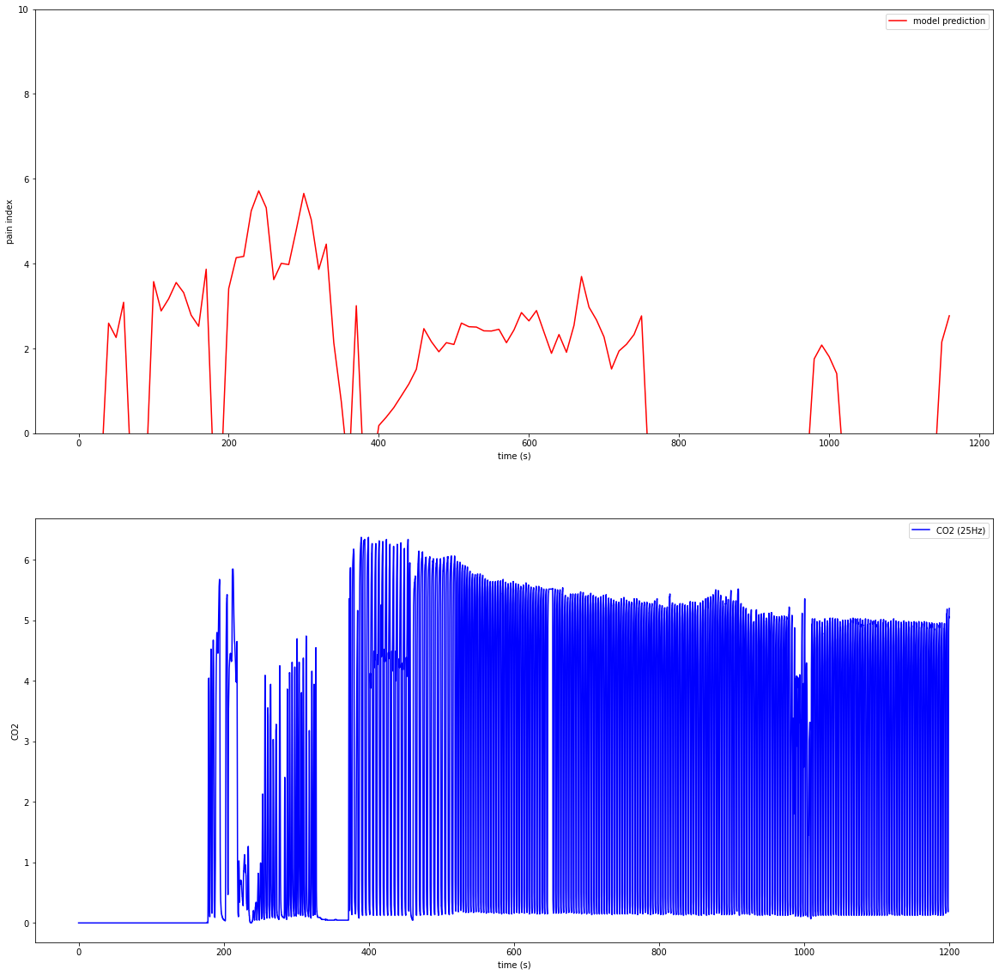

idx: 169,  preop file: R8_200814_080800.vital
no vital co2
idx: 170,  preop file: A1_191024_091438.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...peak out...failed
input 1 ...noise out...ppg0.0, ecg1.0failed
input 2 ...noise out...ppg0.0, ecg1.0failed
input 3 ...noise out...ppg0.0, ecg1.0failed
input 4 ...noise out...ppg0.047619047619047616, ecg1.0failed
input 5 ...noise out...ppg0.045454545454545456, ecg1.0failed
input 6 ...noise out...ppg0.045454545454545456, ecg1.0failed
input 7 ...noise out...ppg0.14285714285714285, ecg1.0failed
input 8 ...noise out...ppg0.13636363636363635, ecg1.0failed
input 9 ...noise out...ppg0.09523809523809523, ecg1.0failed
input 10 ...noise out...ppg0.0, ecg1.0failed
input 11 ...noise out...ppg0.0, ecg1.0failed
input 12 ...noise out...ppg0.09523809523809523, ecg1.0failed
input 13 ...noise out...ppg0.1, ecg1.0failed
input 14 ...noise out...ppg0.1, ecg0.9failed
input 15 ...noise out...ppg0.15, ecg

input 67 ...pass
input 68 ...pass
input 69 ...pass
input 70 ...pass
input 71 ...pass
input 72 ...pass
input 73 ...pass
input 74 ...pass
input 75 ...pass
input 76 ...pass
input 77 ...pass
input 78 ...pass
input 79 ...pass
input 80 ...pass
input 81 ...noise out...ppg0.4, ecg0.0failed
input 82 ...noise out...ppg0.4166666666666667, ecg0.0failed
input 83 ...pass
input 84 ...pass
input 85 ...pass
input 86 ...pass
input 87 ...pass
input 88 ...pass
input 89 ...pass
input 90 ...pass
input 91 ...pass
input 92 ...pass
input 93 ...pass
input 94 ...pass
input 95 ...pass
input 96 ...pass
input 97 ...pass
input 98 ...pass
input 99 ...pass
input 100 ...pass
input 101 ...pass
input 102 ...pass
input 103 ...pass
input 104 ...pass
input 105 ...pass
input 106 ...pass
input 107 ...pass
input 108 ...pass
input 109 ...pass
input 110 ...pass
input 111 ...pass
input 112 ...pass
input 113 ...pass
input 114 ...pass
input 115 ...pass
input 116 ...pass
x_input length: 117
x_model.shape: (108, 5000, 2)
INFO:tensorf

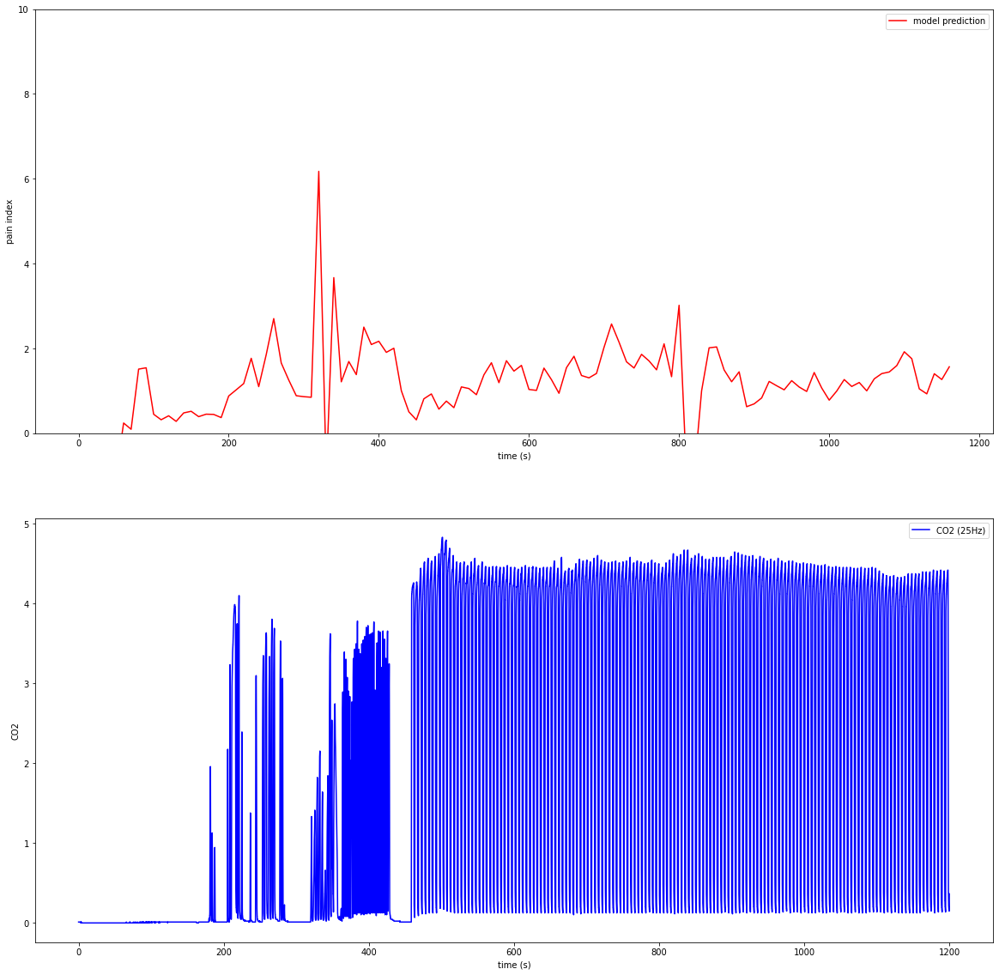

idx: 172,  preop file: R6_200710_122123.vital
no vital co2
idx: 173,  preop file: F4_190712_094059.vital
no vital co2
idx: 174,  preop file: C4_200727_074747.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...noise out...ppg0.47058823529411764, ecg0.3333333333333333failed
input 1 ...noise out...ppg0.6111111111111112, ecg0.631578947368421failed
input 2 ...noise out...ppg0.4, ecg0.35failed
input 3 ...pass
input 4 ...pass
input 5 ...pass
input 6 ...pass
input 7 ...noise out...ppg0.4444444444444444, ecg0.0failed
input 8 ...noise out...ppg0.3333333333333333, ecg0.0failed
input 9 ...pass
input 10 ...pass
input 11 ...pass
input 12 ...pass
input 13 ...pass
input 14 ...pass
input 15 ...pass
input 16 ...pass
input 17 ...pass
input 18 ...pass
input 19 ...pass
input 20 ...pass
input 21 ...pass
input 22 ...pass
input 23 ...pass
input 24 ...pass
input 25 ...pass
input 26 ...pass
input 27 ...pass
input 28 ...pass
input 29 ...pass
input 30 ..

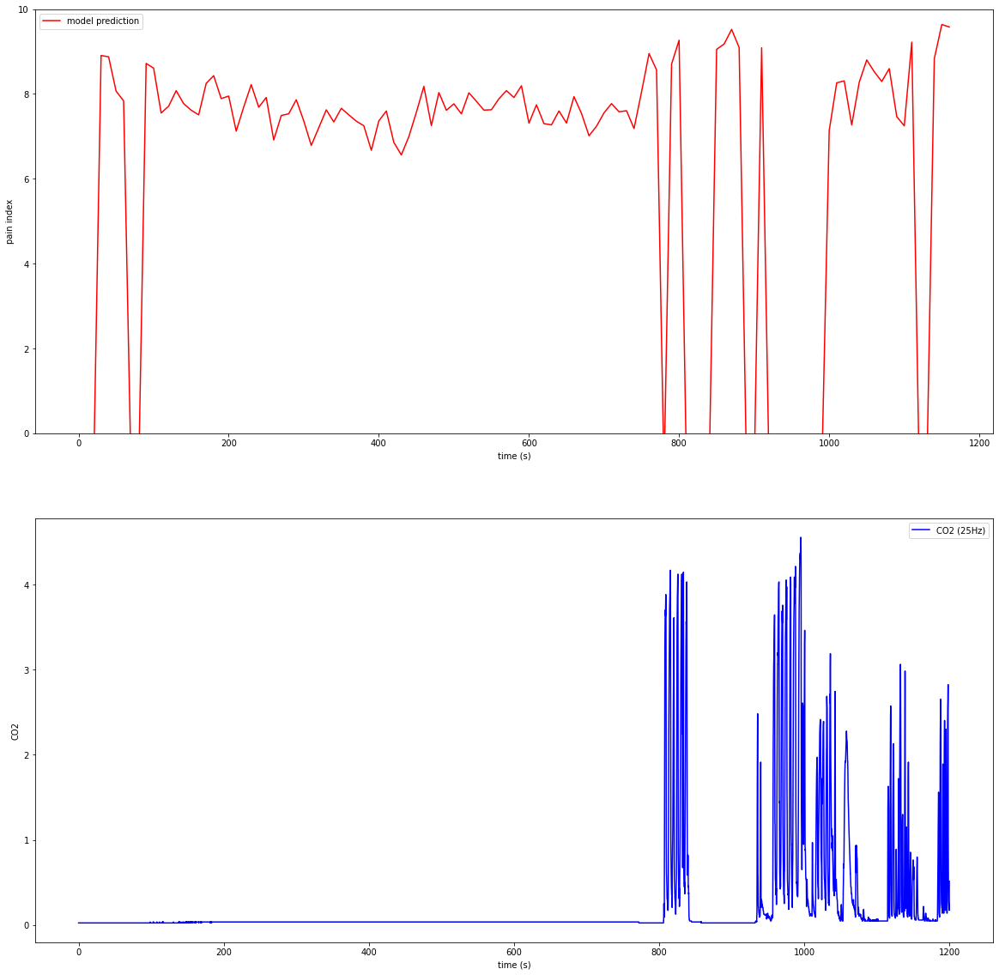

idx: 175,  preop file: A2_191017_101910.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...nan out...failed
input 1 ...noise out...ppg1.0, ecg1.0failed
input 2 ...noise out...ppg0.9411764705882353, ecg1.0failed
input 3 ...noise out...ppg0.4444444444444444, ecg1.0failed
input 4 ...noise out...ppg1.0, ecg1.0failed
input 5 ...noise out...ppg1.0, ecg1.0failed
input 6 ...noise out...ppg0.7058823529411765, ecg1.0failed
input 7 ...noise out...ppg0.4375, ecg1.0failed
input 8 ...noise out...ppg0.11764705882352941, ecg1.0failed
input 9 ...noise out...ppg0.0, ecg1.0failed
input 10 ...noise out...ppg0.0, ecg1.0failed
input 11 ...noise out...ppg0.2777777777777778, ecg1.0failed
input 12 ...noise out...ppg1.0, ecg1.0failed
input 13 ...noise out...ppg0.2916666666666667, ecg1.0failed
input 14 ...noise out...ppg0.19230769230769232, ecg1.0failed
input 15 ...noise out...ppg0.19230769230769232, ecg1.0failed
input 16 ...noise out...ppg1.0, ecg1.0fa

input 73 ...noise out...ppg0.05555555555555555, ecg0.9375failed
input 74 ...noise out...ppg0.0, ecg0.47368421052631576failed
input 75 ...pass
input 76 ...pass
input 77 ...pass
input 78 ...pass
input 79 ...pass
input 80 ...pass
input 81 ...noise out...ppg0.0, ecg0.3684210526315789failed
input 82 ...noise out...ppg0.05, ecg0.631578947368421failed
input 83 ...pass
input 84 ...pass
input 85 ...pass
input 86 ...pass
input 87 ...noise out...ppg0.0, ecg0.3failed
input 88 ...pass
input 89 ...pass
input 90 ...noise out...ppg0.0, ecg0.3333333333333333failed
input 91 ...noise out...ppg0.0, ecg0.35failed
input 92 ...pass
input 93 ...pass
input 94 ...pass
input 95 ...pass
input 96 ...pass
input 97 ...noise out...ppg0.0, ecg0.3157894736842105failed
input 98 ...pass
input 99 ...noise out...ppg0.0, ecg0.3333333333333333failed
input 100 ...noise out...ppg0.0, ecg0.3failed
input 101 ...noise out...ppg0.0, ecg0.7142857142857143failed
input 102 ...noise out...ppg0.0, ecg0.38095238095238093failed
input 103

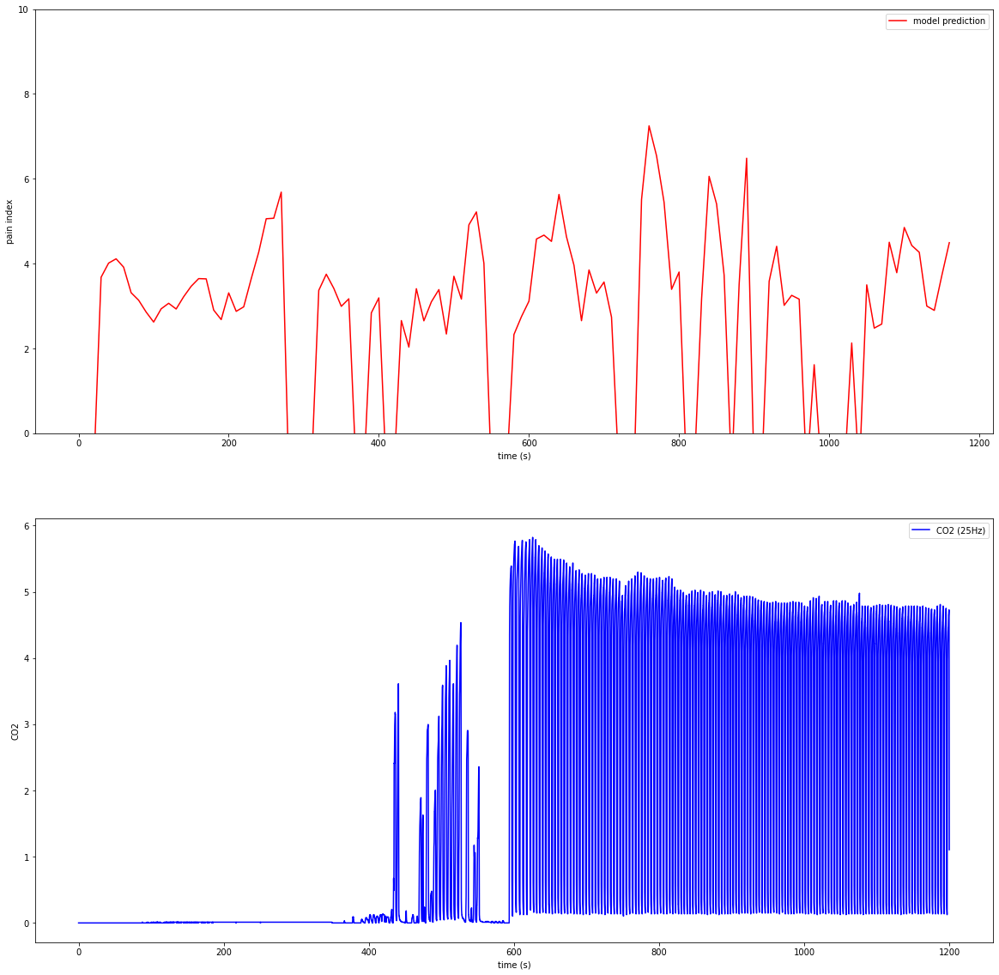

idx: 182,  preop file: E4_190509_074438.vital
no vital co2
idx: 183,  preop file: D3_200218_124709.vital
no vital co2
idx: 184,  preop file: D4_200630_075614.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...noise out...ppg0.48, ecg0.48failed
input 1 ...noise out...ppg0.3225806451612903, ecg0.13793103448275862failed
input 2 ...pass
input 3 ...noise out...ppg0.3333333333333333, ecg0.17857142857142858failed
input 4 ...noise out...ppg0.6923076923076923, ecg0.3333333333333333failed
input 5 ...noise out...ppg0.3103448275862069, ecg0.37037037037037035failed
input 6 ...pass
input 7 ...noise out...ppg0.32142857142857145, ecg0.06666666666666667failed
input 8 ...pass
input 9 ...pass
input 10 ...pass
input 11 ...pass
input 12 ...pass
input 13 ...pass
input 14 ...noise out...ppg0.2962962962962963, ecg0.5925925925925926failed
input 15 ...noise out...ppg0.18518518518518517, ecg0.41379310344827586failed
input 16 ...pass
input 17 ...noise ou

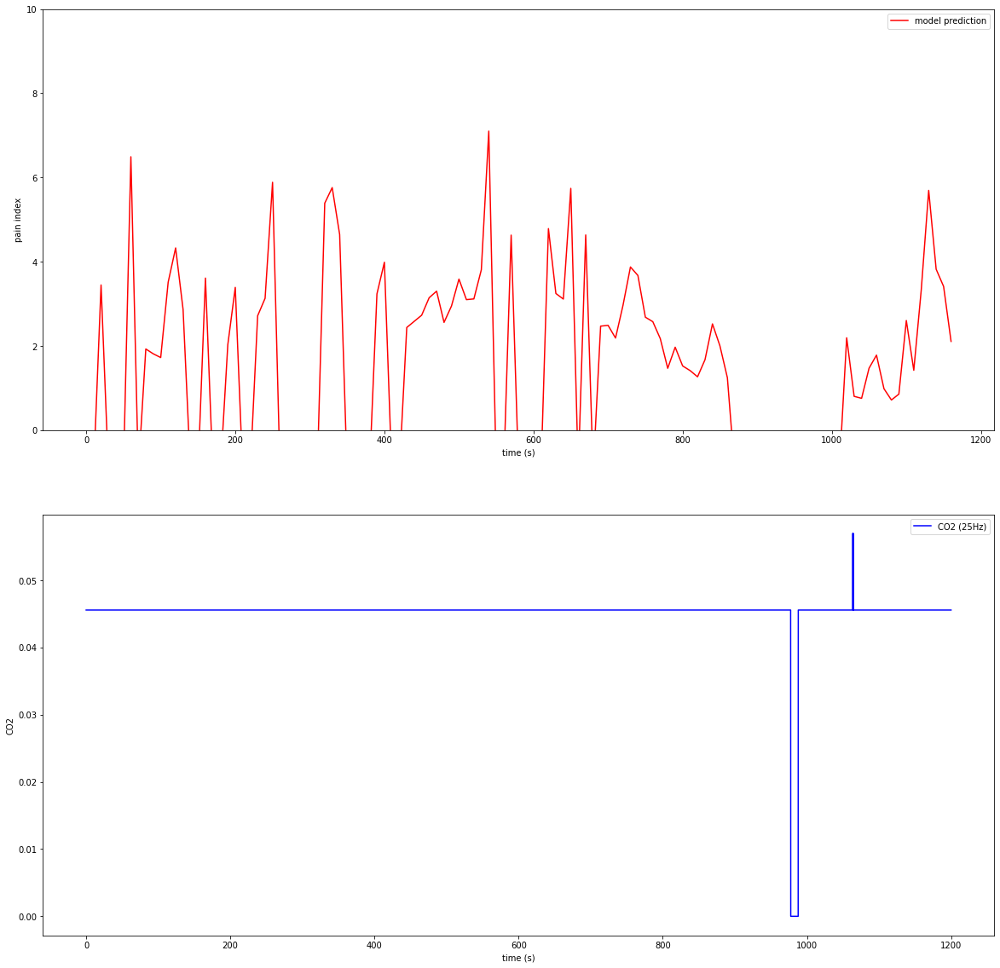

idx: 185,  preop file: E5_190617_145353.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...noise out...ppg0.05555555555555555, ecg1.0failed
input 1 ...noise out...ppg0.10526315789473684, ecg1.0failed
input 2 ...noise out...ppg0.1111111111111111, ecg1.0failed
input 3 ...noise out...ppg0.1111111111111111, ecg1.0failed
input 4 ...noise out...ppg0.3333333333333333, ecg1.0failed
input 5 ...noise out...ppg0.2222222222222222, ecg1.0failed
input 6 ...noise out...ppg0.0, ecg1.0failed
input 7 ...noise out...ppg0.0, ecg1.0failed
input 8 ...noise out...ppg0.05, ecg1.0failed
input 9 ...noise out...ppg0.0, ecg1.0failed
input 10 ...noise out...ppg0.5263157894736842, ecg1.0failed
input 11 ...noise out...ppg0.7894736842105263, ecg1.0failed
input 12 ...noise out...ppg0.35, ecg1.0failed
input 13 ...noise out...ppg0.25, ecg1.0failed
input 14 ...noise out...ppg0.35, ecg1.0failed
input 15 ...noise out...ppg0.19047619047619047, ecg1.0failed
input 16

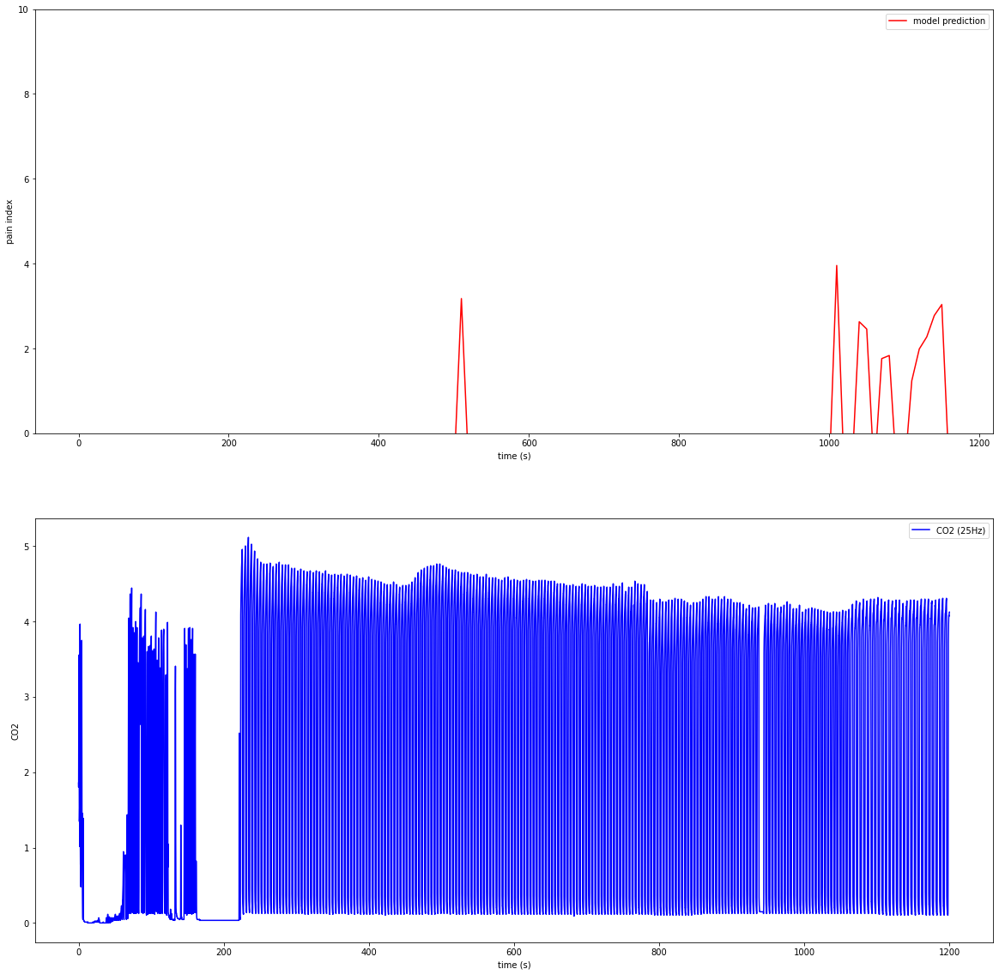

idx: 186,  preop file: F2_191022_111538.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...peak out...failed
input 1 ...noise out...ppg0.13333333333333333, ecg1.0failed
input 2 ...noise out...ppg0.0, ecg1.0failed
input 3 ...noise out...ppg0.0, ecg1.0failed
input 4 ...noise out...ppg0.0, ecg1.0failed
input 5 ...noise out...ppg0.0, ecg1.0failed
input 6 ...noise out...ppg0.0, ecg1.0failed
input 7 ...noise out...ppg0.0, ecg1.0failed
input 8 ...noise out...ppg0.0, ecg1.0failed
input 9 ...noise out...ppg0.0, ecg1.0failed
input 10 ...noise out...ppg0.0, ecg1.0failed
input 11 ...noise out...ppg0.0, ecg1.0failed
input 12 ...noise out...ppg0.0, ecg1.0failed
input 13 ...noise out...ppg0.0, ecg1.0failed
input 14 ...noise out...ppg0.0, ecg1.0failed
input 15 ...noise out...ppg0.0, ecg1.0failed
input 16 ...noise out...ppg0.0625, ecg1.0failed
input 17 ...noise out...ppg0.06666666666666667, ecg1.0failed
input 18 ...noise out...ppg0.0, ecg1.0fa

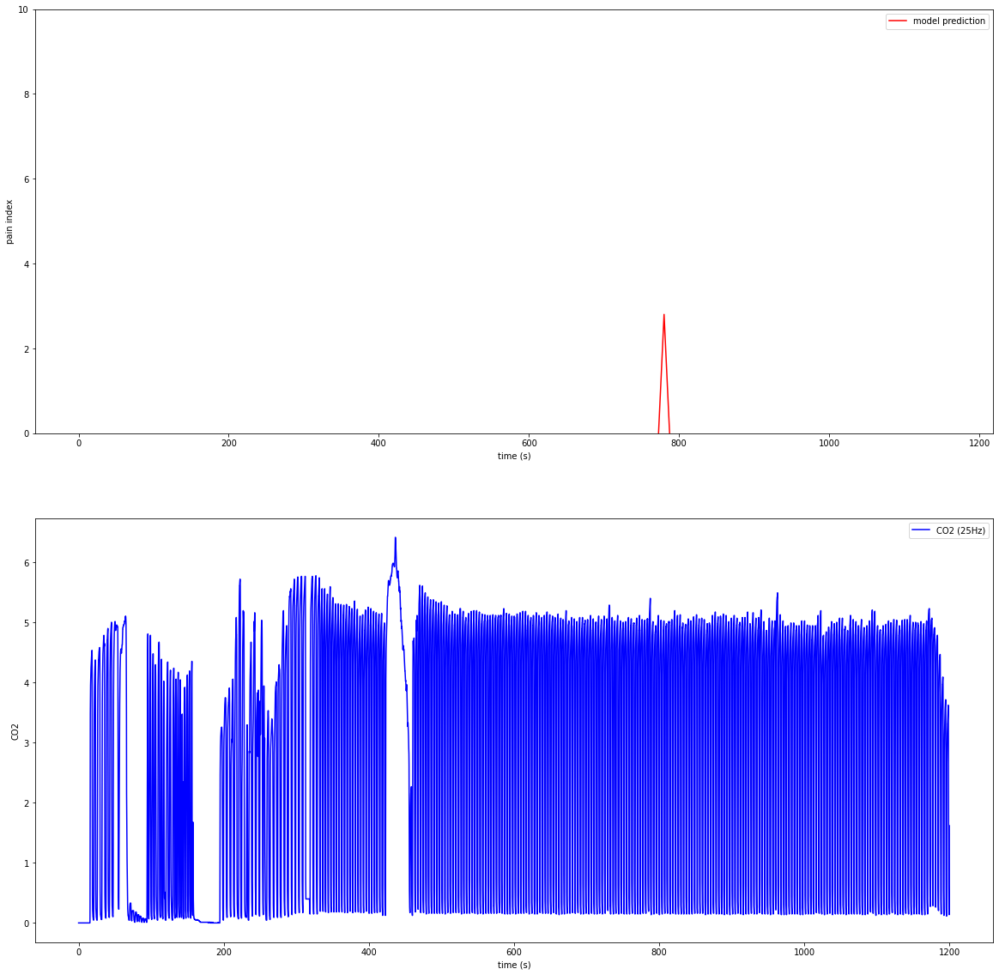

idx: 187,  preop file: F1_190830_124042.vital
no vital co2
idx: 188,  preop file: D1_200311_073833.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...noise out...ppg0.0, ecg0.6956521739130435failed
input 1 ...noise out...ppg0.03225806451612903, ecg0.37037037037037035failed
input 2 ...pass
input 3 ...noise out...ppg0.20689655172413793, ecg0.3103448275862069failed
input 4 ...pass
input 5 ...pass
input 6 ...pass
input 7 ...pass
input 8 ...pass
input 9 ...pass
input 10 ...pass
input 11 ...pass
input 12 ...pass
input 13 ...pass
input 14 ...noise out...ppg0.15384615384615385, ecg0.5769230769230769failed
input 15 ...pass
input 16 ...pass
input 17 ...pass
input 18 ...pass
input 19 ...pass
input 20 ...pass
input 21 ...pass
input 22 ...pass
input 23 ...noise out...ppg0.36, ecg0.03571428571428571failed
input 24 ...noise out...ppg0.4444444444444444, ecg0.4642857142857143failed
input 25 ...noise out...ppg0.35714285714285715, ecg0.821428571

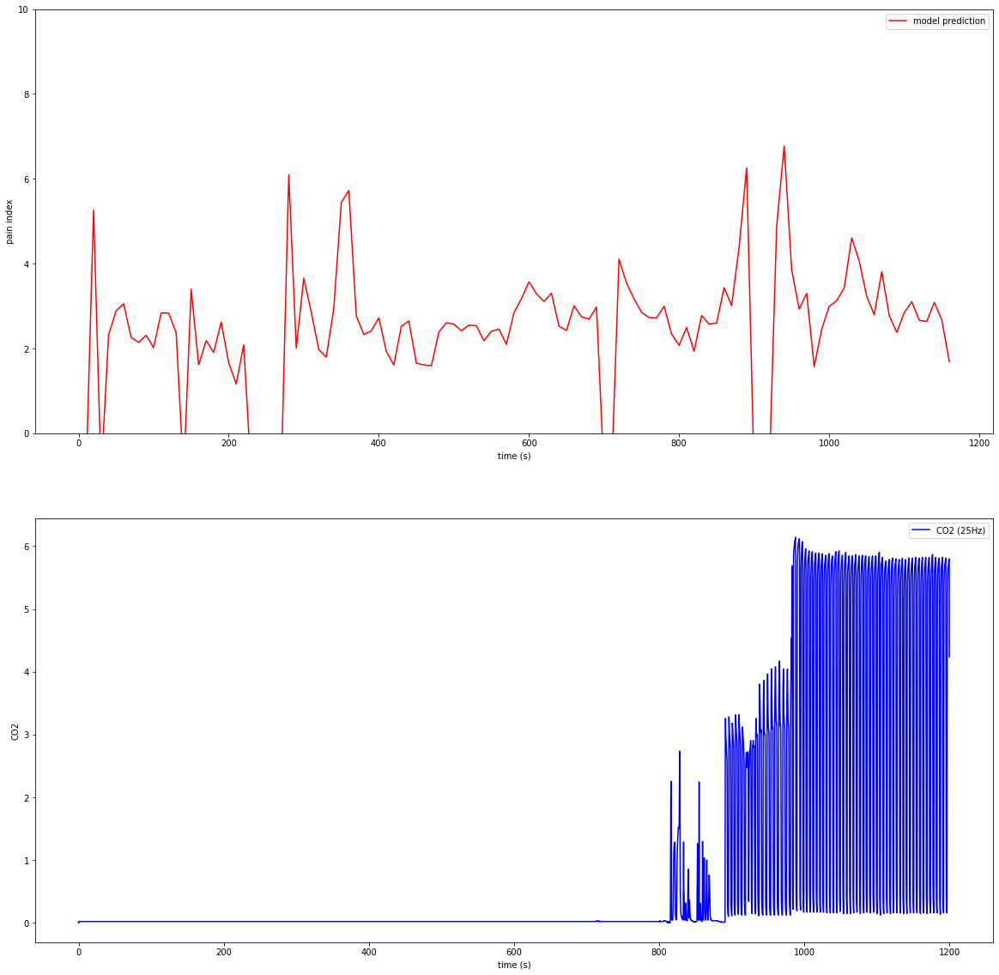

idx: 189,  preop file: R6_200507_113652.vital
no vital co2
idx: 190,  preop file: D2_200629_173736.vital
no vital co2
idx: 191,  preop file: D1_201013_100217.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...nan out...failed
input 1 ...noise out...ppg1.0, ecg1.0failed
input 2 ...noise out...ppg1.0, ecg0.9523809523809523failed
input 3 ...noise out...ppg0.7894736842105263, ecg0.9523809523809523failed
input 4 ...noise out...ppg0.22727272727272727, ecg0.9047619047619048failed
input 5 ...noise out...ppg0.041666666666666664, ecg0.8260869565217391failed
input 6 ...noise out...ppg0.043478260869565216, ecg0.6521739130434783failed
input 7 ...noise out...ppg0.043478260869565216, ecg1.0failed
input 8 ...noise out...ppg0.041666666666666664, ecg1.0failed
input 9 ...noise out...ppg0.041666666666666664, ecg0.7272727272727273failed
input 10 ...noise out...ppg0.08695652173913043, ecg0.5454545454545454failed
input 11 ...noise out...ppg0.0434782

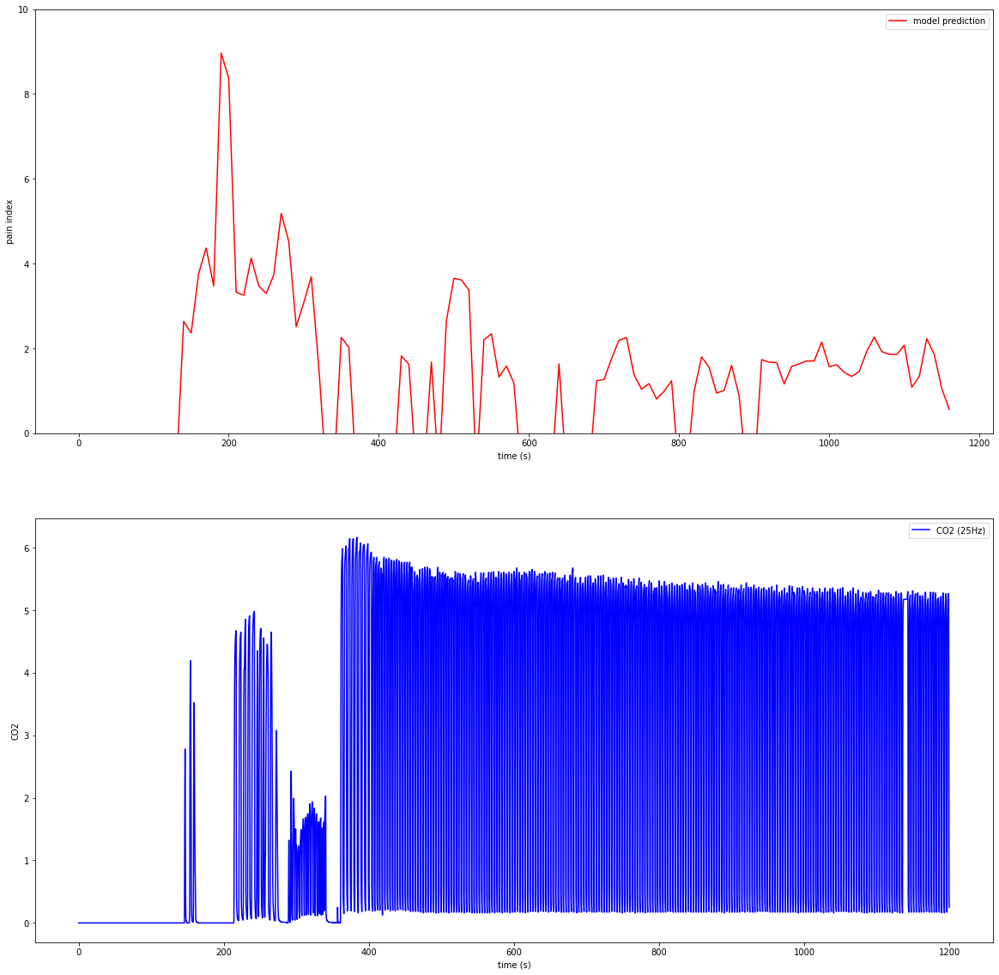

idx: 192,  preop file: F4_190529_115820.vital
no vital co2
idx: 193,  preop file: R2_200701_080220.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...nan out...failed
input 1 ...noise out...ppg0.9166666666666666, ecg1.0failed
input 2 ...noise out...ppg0.9166666666666666, ecg1.0failed
input 3 ...noise out...ppg0.9230769230769231, ecg1.0failed
input 4 ...noise out...ppg0.5333333333333333, ecg1.0failed
input 5 ...noise out...ppg0.6470588235294118, ecg1.0failed
input 6 ...noise out...ppg0.8235294117647058, ecg1.0failed
input 7 ...noise out...ppg0.2631578947368421, ecg1.0failed
input 8 ...noise out...ppg0.047619047619047616, ecg1.0failed
input 9 ...noise out...ppg0.3888888888888889, ecg1.0failed
input 10 ...noise out...ppg0.5333333333333333, ecg1.0failed
input 11 ...noise out...ppg0.9375, ecg1.0failed
input 12 ...noise out...ppg0.7058823529411765, ecg1.0failed
input 13 ...noise out...ppg0.29411764705882354, ecg1.0failed
input 14 ..

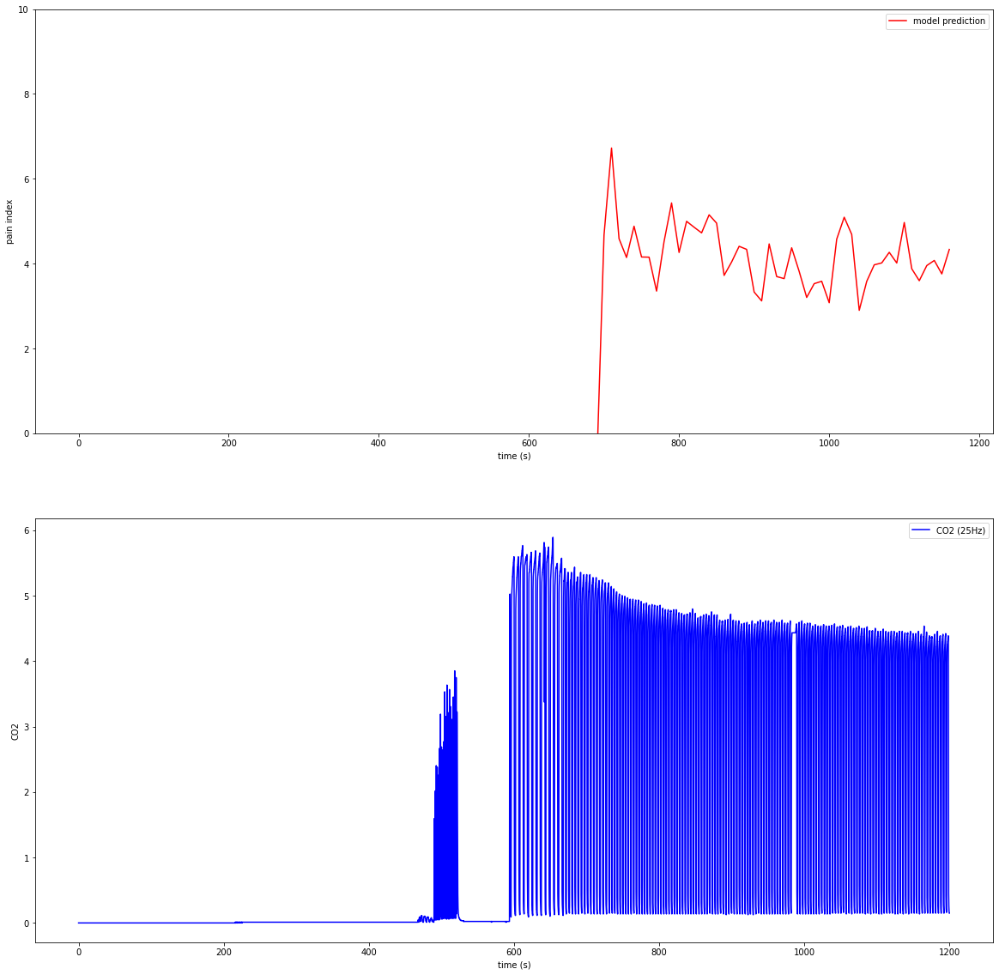

idx: 194,  preop file: R10_200618_092129.vital
existing CO2 curve...existing PPG, ECG data
detecting PPG peak...done..detecting ECG peakdone
input 0 ...nan out...failed
input 1 ...noise out...ppg0.7333333333333333, ecg0.3333333333333333failed
input 2 ...noise out...ppg0.7272727272727273, ecg0.13636363636363635failed
input 3 ...noise out...ppg1.0, ecg0.2608695652173913failed
input 4 ...noise out...ppg1.0, ecg0.43478260869565216failed
input 5 ...noise out...ppg0.375, ecg0.2727272727272727failed
input 6 ...noise out...ppg1.0, ecg0.09090909090909091failed
input 7 ...noise out...ppg0.9166666666666666, ecg0.08695652173913043failed
input 8 ...noise out...ppg1.0, ecg0.2727272727272727failed
input 9 ...noise out...ppg1.0, ecg0.30434782608695654failed
input 10 ...noise out...ppg0.9166666666666666, ecg0.041666666666666664failed
input 11 ...noise out...ppg1.0, ecg0.09523809523809523failed
input 12 ...noise out...ppg0.75, ecg0.05failed
input 13 ...pass
input 14 ...pass
input 15 ...pass
input 16 ...

In [ ]:
import os, sys, pickle
sys.path.append('../../cranberry2/Preprocessing/')
from pyvital2 import vitaldb, arr
from scipy import signal
import statsmodels.api as sm
import pandas as pd
import matplotlib.pyplot as plt
from keras.models import model_from_json
import os
import tensorflow as tf


def best_model_path(models_dir):
    roc_list = []
    model_list = os.listdir(models_dir)
    for f_model in model_list:
        if f_model[0:3]=='roc':
            roc_list.append(f_model[3:9])
        else:
            roc_list.append(0)


    roc_list = np.array(roc_list)
    return os.path.join(models_dir,model_list[np.argmax(roc_list)])

def linear_connection(list, idx):
    '''
        피크 사이 wave를 모두 같은 length로 만들기 위한 함수
    '''
    int_idx = int(idx)
    return list[int_idx] + (list[int_idx+1] - list[int_idx]) * (idx - int_idx)


# Lowess filter
def smooth(y):
    #return savitzky_golay(y, window_size=2001, order=3)
    return lowess(y)

def lowess(y, f=0.2):
    x = np.arange(0, len(y))
    return sm.nonparametric.lowess(y, x, frac=f, it=0)[:, 1].T



# input 설정
LEN_INPUT = 20 # input 10s
OVERLAP = 10
#SRATE = 250


vital_path = '../../cranberry2/Preprocessing/vital_data/'
peak_path = '../../cranberry2/Preprocessing/cache/peaks/'
#for (root, dirs, files) in os.walk(vital_path + '/preop_vital')
#vitaldb.vital_recs(vital_path)
#ppg_val = vitaldb.vital_recs(vital_path+'/'+f_vital, ['SNUADC/ECG_II'], interval = 0.0025).flatten()


idx += 1
f_vital_list = os.listdir(vital_path+'preop_full_vital')
f_vital = f_vital_list[idx]
f_peak = f_vital.split('_',1)[1]
#print('idx: {},  preop file:'.format(idx), f_vital)


x_input = []
y_pred = []

for idx, f_vital in enumerate(f_vital_list):

    x_input = []
    f_peak = f_vital.split('_',1)[1]
    print('idx: {},  preop file:'.format(idx), f_vital)
    
    
    
    '''
    # peaks가 없는 경우는 ECG나 PPG data가 없는 case들
    if not os.path.exists(peak_path+'PPG_100Hz_preop_all/'+f_peak):
        print('no existing PPG peaks: ', f_vital)
        break
    if not os.path.exists(peak_path+'ECG_250Hz_preop_all/'+f_peak):
        print('no existing ECG peaks: ', f_vital)
        break


    # PPG peaks
    ppg_peak = (pickle.load(open(peak_path+'PPG_100Hz_preop_all/'+f_peak, 'rb')))
    ppg_peak = np.array([ppg_peak])
    # ECG peaks
    ecg_peak = np.array(pickle.load(open(peak_path+'ECG_100Hz_preop_all/'+f_peak, 'rb')))
    ecg_peak = np.array([ecg_peak])
    '''
    
    # CO2
    vital_co2 = vitaldb.vital_recs(vital_path+'preop_full_vital/'+f_vital, ['Datex-Ohmeda/CO2'], interval = 1/25).flatten()
    vital_co2 = np.array(pd.DataFrame(vital_co2).fillna(method='ffill', axis=0).fillna(method='bfill', axis=0).values.flatten())
    if len(vital_co2) <= 1:
        print('no vital co2')
        continue
    else:
        print('existing CO2 curve...', end='')
        vital_co2[vital_co2<=0] = 0
    
    
    
    
    # loading vital data
    ppg_val = vitaldb.vital_recs(vital_path+'preop_full_vital/'+f_vital, ['SNUADC/PLETH'], interval = 1/100).flatten()
    ecg_val = vitaldb.vital_recs(vital_path+'preop_full_vital/'+f_vital, ['SNUADC/ECG_II'], interval = 1/100).flatten()
    ecg_samp = vitaldb.vital_recs(vital_path+'preop_full_vital/'+f_vital, ['SNUADC/ECG_II'], interval = 1/250).flatten()
    #ppg_val = pd.DataFrame(ppg_val).fillna(method='ffill', axis=0).fillna(method='bfill', axis=0).values.flatten()
    #ppg_samp = signal.resample(ppg_val, len(ecg_samp))
    
    if len(ppg_val) <=1:
        print('no ppg')
        continue
        
    if  len(ecg_val) <=1:
        print('no ecg')
        continue
    print('existing PPG, ECG data')
    
    # 100Hz PPG의 peak detection
    print('detecting PPG peak...', end='')
    if os.path.exists(peak_path+'preop_full/PPG_100Hz_preop/'+f_peak):
        _, ppg_peak = pickle.load(open(peak_path+'preop_full/PPG_100Hz_preop/'+f_peak, 'rb'))
        
    else:
        min_ppg, ppg_peak = arr.detect_peaks((pd.DataFrame(ppg_val).fillna(method='ffill').fillna(method='bfill').values.flatten()), 100)
        pickle.dump((min_ppg, ppg_peak), open(peak_path+'preop_full/PPG_100Hz_preop/'+f_peak, 'wb'))
    ppg_peak = np.array([ppg_peak])
    print('done..detecting ECG peak', end='')

    
    # 100Hz ECG의 peak detection
    if os.path.exists(peak_path+'preop_full/ECG_100Hz_preop/'+f_peak):
        ecg_peak = pickle.load(open(peak_path+'preop_full/ECG_100Hz_preop/'+f_peak, 'rb'))
                
    else:
        ecg_peak = arr.detect_qrs((pd.DataFrame(ecg_val).fillna(method='ffill').fillna(method='bfill').values.flatten()),100)
        pickle.dump(ecg_peak, open(peak_path+'preop_full/ECG_100Hz_preop/'+f_peak, 'wb'))
    ecg_peak = np.array([ecg_peak])   
    print('done')
    
    
    # 각 window마다 전처리 후 모델에 값을 집어넣어 계산
    n_window = (len(ecg_samp)//250-LEN_INPUT)//OVERLAP + 1
    for i in range(n_window-1):
        
        print('input {} ...'.format(i), end='')    
        SRATE = 100
        bool_process = False
        frac = 0.2 # lowess fraction 계쑤
        
        
        # 전처리 과정
        while True:
            start_idx = i*OVERLAP*SRATE # 2500i
            end_idx = (i*OVERLAP + LEN_INPUT)*SRATE # 2500i + 5000


            seg_ppg, seg_ecg = [np.nan for j in range(LEN_INPUT*SRATE)], [np.nan for j in range(LEN_INPUT*SRATE)] 
            seg_ppg = np.copy(ppg_val[start_idx:end_idx])
            seg_ecg = np.copy(ecg_val[start_idx:end_idx])
            
            
            seg_ppg = seg_ppg - lowess(pd.DataFrame(seg_ppg).fillna(method='ffill', axis=0).fillna(method='bfill', axis=0).values.flatten(), frac)
            seg_ecg = seg_ecg - lowess(pd.DataFrame(seg_ecg).fillna(method='ffill', axis=0).fillna(method='bfill', axis=0).values.flatten(), frac)

            ### 1. 결측치 처리 ###              
            # df.isnull().sum() 하면 더 간단하게 가능하나 애초에 NRS에 해당하는 vital data가 120초 보다 짧은 경우
            nan_ppg_list = np.isnan(seg_ppg)
            nan_ecg_list = np.isnan(seg_ecg)
            nan_ppg_perc = np.sum(nan_ppg_list) / LEN_INPUT / SRATE
            nan_ecg_perc = np.sum(nan_ecg_list) / LEN_INPUT / SRATE

            # ECG, PPG 둘다 결측치인 부분
            nan_both_perc = 0
            for j in range(len(seg_ppg)):
                if nan_ppg_list[j] and  nan_ecg_list[j]:
                    nan_both_perc += 1
            nan_both_perc /= (LEN_INPUT*SRATE)

            # segment의 결측치 비율 정보
            nan_info = [nan_ppg_perc, nan_ecg_perc, nan_both_perc]

            # 결측치가 많은 경우, noise 확인할 것도 없이 False -  이 경우의 noise_info는 -1로 처리
            if nan_ppg_perc > 0.2 or nan_ecg_perc > 0.2:
                print('nan out...', end='')
                break



            ### 2. Noise 처리 ###
            # 10초 segment 내의 ppg, ecg peak idx
            #seg_ppg_min = ppg_min[(start_idx<=np.array(ppg_min)) & (np.array(ppg_min)<end_idx)]
            idx_ppg_peak = ppg_peak[(start_idx<=ppg_peak) & (ppg_peak<end_idx)] - start_idx
            idx_ecg_peak = ecg_peak[(start_idx<=ecg_peak) & (ecg_peak<end_idx)] - start_idx

            # peak가 5개 이하는 noise가 많이 낀 상황 (20초 구간 중 peak가 18초 이상 없으면 문제 -> 즉 peak 개수 범위는 18/2 ~ 18/0.4)
            # 따라서 peak가 18초 이상 있어야하고 이때 최소 peak 개수는 9개
            # peak 개수가 기준 미달이면 noise 계산 자세히 할 필요없이 False - 이 경우의 noise_info는 -2로 처리
            if len(idx_ppg_peak)<=9 or len(idx_ecg_peak)<=9:
                print('peak out...', end='')
                break


            # 10초 segment 내의 ppg, ecg peak value
            #print(len(seg_ppg), idx_ppg_peak)
            val_ppg_peak = [seg_ppg[k] for k in idx_ppg_peak]
            val_ecg_peak = [seg_ecg[k] for k in idx_ecg_peak]

            # peak와 peak 사이 interval에 대한 noise 여부 -> 따라서 길이는 peak - 1
            bool_noise_ppg = [False for k in range(len(idx_ppg_peak)-1)]
            bool_noise_ecg = [False for k in range(len(idx_ecg_peak)-1)]

            #  2.1 peak 간격 이상한 noise (HR 30~150 -> HBI 0.4s ~ 2s로 SRATE 곱해주면 40~200)
            for k in range(len(bool_noise_ppg)):
                if not 40 < idx_ppg_peak[k+1] - idx_ppg_peak[k] < 200:
                    bool_noise_ppg[k] = True
            for k in range(len(bool_noise_ecg)):
                if not 40 < idx_ecg_peak[k+1] - idx_ecg_peak[k] < 200:
                    bool_noise_ecg[k] = True

            # 2.2 모양 이상한 noise
            # wave interval into same length(2s(500))
            len_wave = 500
            norm_seg_ppg, norm_seg_ecg = [], []

            for k in range(len(bool_noise_ppg)):
                len_interval_ppg = idx_ppg_peak[k+1] - idx_ppg_peak[k]

                # peak 사이 wave를 모두 같은 길이로 변환
                norm_seg_ppg.append([linear_connection(seg_ppg[idx_ppg_peak[k]:idx_ppg_peak[k+1]+1], n/len_wave*len_interval_ppg) for n in range(len_wave)])

            for k in range(len(bool_noise_ecg)):
                len_interval_ecg = idx_ecg_peak[k+1] - idx_ecg_peak[k]

                # peak 사이 wave를 모두 같은 길이로 변환
                norm_seg_ecg.append([linear_connection(seg_ecg[idx_ecg_peak[k]:idx_ecg_peak[k+1]+1], n/len_wave*len_interval_ecg) for n in range(len_wave)])


            # wave interval 사이 correlation 계산 - PPG
            mean_wave_ppg = np.nanmean(norm_seg_ppg, axis = 0)
            mean_wave_ppg = pd.DataFrame(mean_wave_ppg).fillna(method='ffill', axis=0).fillna(method='bfill', axis=0).values.flatten()
            norm_seg_ppg = pd.DataFrame(norm_seg_ppg).fillna(method='ffill', axis=1).fillna(method='bfill', axis=1).values
            for k in range(len(bool_noise_ppg)):
                if np.corrcoef(norm_seg_ppg[k], mean_wave_ppg)[0,1] < 0.9:
                    bool_noise_ppg[k] = True
            noise_ppg_perc = np.sum(bool_noise_ppg) / len(bool_noise_ppg)

            # wave interval 사이 correlation 계산 - ECG                
            mean_wave_ecg = np.nanmean(norm_seg_ecg, axis = 0)
            mean_wave_ecg = pd.DataFrame(mean_wave_ecg).fillna(method='ffill', axis=0).fillna(method='bfill', axis=0).values.flatten()
            norm_seg_ecg = pd.DataFrame(norm_seg_ecg).fillna(method='ffill', axis=1).fillna(method='bfill', axis=1).values
            for k in range(len(bool_noise_ecg)):
                if np.corrcoef(norm_seg_ecg[k], mean_wave_ecg)[0,1] < 0.9:
                    bool_noise_ecg[k] = True
            noise_ecg_perc = np.sum(bool_noise_ecg) / len(bool_noise_ecg)

            # segment의 noise 비율 정보
            noise_info = [noise_ppg_perc, noise_ecg_perc]

            # segment를 input으로 써도 되는지
            if nan_ppg_perc < 0.2 and nan_ecg_perc < 0.2 and noise_ppg_perc < 0.3 and noise_ecg_perc < 0.3:
                bool_process = True
                print('pass')
                break
            else:
                print('noise out...ppg{}, ecg{}'.format(noise_ppg_perc, noise_ecg_perc), end='')
                break

        
        # 전처리 실패한 경우
        if not bool_process:
            print('failed')
            x_input.append(np.nan)
            continue
        
        
        # 전처리 통과한 경우 모델어 넣을 input 뽑기
        SRATE = 250
        start_idx2 = i*OVERLAP*SRATE # 2500i
        end_idx2 = (i*OVERLAP + LEN_INPUT)*SRATE # 2500i + 5000
        
        #seg_ppg, seg_ecg = [np.nan for j in range(LEN_INPUT*SRATE)], [np.nan for j in range(LEN_INPUT*SRATE)] 
        seg_ppg = np.copy(ppg_val[start_idx:end_idx])
        seg_ppg = pd.DataFrame(seg_ppg).fillna(method='ffill', axis=0).fillna(method='bfill', axis=0).values.flatten()
        seg_ppg = signal.resample(seg_ppg, LEN_INPUT*SRATE)

        seg_ecg = np.copy(ecg_samp[start_idx2:end_idx2])
        seg_ecg = pd.DataFrame(seg_ecg).fillna(method='ffill', axis=0).fillna(method='bfill', axis=0).values.flatten()
        

        seg_ppg = seg_ppg - smooth(seg_ppg)
        seg_ecg = seg_ecg - smooth(seg_ecg)
        
        seg_ppg = seg_ppg - np.mean(seg_ppg)
        
        seg_ecg = (seg_ecg - np.mean(seg_ecg)) / np.std(seg_ecg)
        
        x_input.append([seg_ppg,seg_ecg])
        #y_pred.append(model.predict([seg_ppg, seg_ecg]).flatten())

        #break


    
    mask = [~np.isnan(x).all() for x in x_input]

    x_model = []
    for x in x_input:
        if not np.isnan(x).all():
            x_model.append(x)

    try:
        x_model= np.transpose(x_model, [0,2,1])
    except:
        continue
        
    print('x_input length:', len(x_input))
    print('x_model.shape:', x_model.shape)


    strategy = tf.distribute.MirroredStrategy(devices=["/gpu:1"])
    with strategy.scope():

        models_dir = '1D-CNN_ECG+PPG/NRS>=4/1D_CNN_5layers_sample-weighted_3class_lowess_filtered'
        load_path = best_model_path(models_dir)
        load_weight_path = load_path+'/weights.hdf5'

        print('best model:', load_path)
        print('loading model...', flush=True, end='')
        with open(load_path+"/model.json", 'r') as f_json:
            loaded_model_json = f_json.read()

        model = model_from_json(loaded_model_json)
        print('done')
        print('loading weights...', flush=True, end='')
        model.load_weights(load_weight_path)
        print('done')

        y_pred = model.predict(x_model).flatten()
        #tf.keras.backend.clear_session()

    y = np.array([-1. for i in range(len(x_input))])
    y[mask] = y_pred*10


    # CO2
    vital_co2 = vitaldb.vital_recs(vital_path+'preop_full_vital/'+f_vital, ['Datex-Ohmeda/CO2'], interval = 1/25).flatten()
    vital_co2 = np.array(pd.DataFrame(vital_co2).fillna(method='ffill', axis=0).fillna(method='bfill', axis=0).values.flatten())
    if len(vital_co2) <= 1:
        print('no vital co2')
    else:
        vital_co2[vital_co2<=0] = 0


    # plotting
    fig = plt.figure(figsize=(20,20))
    ax1.set_title('idx: {}, vital: {}'.format(idx, f_vital))
    ax1 = fig.add_subplot(2,1,1)
    ax1.plot([i*10 for i in range(len(x_input))], y, 'r', label='model prediction')
    #ax1.set_xticks([i*5 for i in range(len(x_input))])
    ax1.set_ylim(0, 10)
    ax1.set_ylabel('pain index')
    ax1.set_xlabel('time (s)')
    ax1.legend(loc='best')


    ax2 = fig.add_subplot(2,1,2)
    ax2.plot([i/25 for i in range(len(vital_co2))], vital_co2, 'b', label='CO2 (25Hz)')
    #ax2.plot([i/250 for i in range(len(ecg_samp))], ecg_samp, 'b', label='ECG (250Hz)')
    ax2.set_xlabel('time (s)')
    ax2.set_ylabel('CO2')
    ax2.legend(loc='best')
    
    plt.savefig('prospective/OP_result/{}.png'.format(f_vital), bbox_inches="tight", pad_inches=0.5)
    #ax2.plot(np.reshape(ecg_samp,[-1,])

    plt.show()


In [84]:
[i for i in []]

[]

## Checking

In [44]:
print('loading train...', flush=True, end='')

# x를 loading해서 (batch_size, step, channel)
input_path = 'dataset/preprocess4/input2/'
x_train = np.load(input_path+'x_train.npz', allow_pickle=True)['arr_0']
x_test = np.load(input_path+'x_test.npz', allow_pickle=True)['arr_0']
x_val = np.load(input_path+'x_val.npz', allow_pickle=True)['arr_0']
y_train = np.load(input_path+'y_train.npz')['arr_0']
y_test = np.load(input_path+'y_test.npz')['arr_0']
y_val = np.load(input_path+'y_val.npz')['arr_0']

print('done', flush=True)

# binary classification
y_train_bin = y_train >= 4
y_test_bin = y_test >= 4
y_val_bin = y_val >= 4

loading train...done


In [88]:
x_model

array([[[ -5.94602557,  -0.64776607],
        [ -8.87673352,  -0.64781212],
        [ -7.50869898,  -0.8043933 ],
        ...,
        [ 12.21206012,  -0.18744228],
        [  6.74303585,  -0.13534821],
        [ -2.15584641,  -0.08325392]],

       [[-22.07642322,  -0.80182419],
        [-21.36679354,  -0.85390052],
        [-22.00871752,  -0.7486392 ],
        ...,
        [ -9.42091607,  -0.06582544],
        [ -7.61233088,  -0.06429499],
        [ -4.74893967,  -0.06276357]],

       [[ 18.63928056,  -0.3905661 ],
        [ 20.77340267,  -0.38974378],
        [ 18.33723692,  -0.38892212],
        ...,
        [-13.93953828,  -0.81978733],
        [ -8.39299337,  -0.82036472],
        [  0.81413597,  -0.82094231]],

       ...,

       [[ 24.35007199,  -0.09547973],
        [ 29.0466445 ,  -0.2136139 ],
        [ 25.59555726,  -0.27262011],
        ...,
        [-11.38868523,  -0.90148472],
        [ -1.80703173,  -0.9021432 ],
        [ 14.11670531,  -0.90280237]],

       [[ -9.54

In [71]:
x_train

array([[[ 6.84806442e+00,  6.49612956e-03],
        [ 5.48328543e+00, -2.17051923e-01],
        [ 4.33989143e+00, -4.68326300e-01],
        ...,
        [-1.14864063e+01, -3.59624952e-01],
        [-1.15206251e+01, -3.59830350e-01],
        [-1.15426922e+01, -3.60036075e-01]],

       [[-2.52696571e+01, -1.21821254e-01],
        [-2.48009930e+01, -1.49597853e-01],
        [-2.40391426e+01, -2.05191702e-01],
        ...,
        [ 8.50644588e+00, -1.70271635e+00],
        [ 7.36480618e+00, -1.03472793e+00],
        [ 6.31402493e+00, -6.44914508e-01]],

       [[-3.32219529e+00,  3.90423946e-02],
        [-3.57780814e+00,  3.88347991e-02],
        [-3.90752935e+00,  3.86274531e-02],
        ...,
        [-9.97785759e+00, -3.87857109e-01],
        [-1.01983232e+01, -3.59610081e-01],
        [-1.04225950e+01, -3.59740049e-01]],

       ...,

       [[-2.35048938e+00,  6.58539176e-01],
        [-2.40696502e+00,  6.58483863e-01],
        [-2.51715040e+00,  6.58428550e-01],
        ...,
     

In [97]:
y_ppg_pred

array([0.00683776, 0.00446503, 0.00942713, 0.00765087, 0.01766094,
       0.00633501, 0.00899354, 0.00836624, 0.00540059, 0.0073032 ,
       0.00937377, 0.00468922, 0.00635701, 0.00568811, 0.00605555,
       0.00562673, 0.0066361 , 0.00334255, 0.00411482, 0.00458964,
       0.00307898, 0.00613682, 0.0084975 , 0.00472259, 0.00418557,
       0.0069624 , 0.00572818, 0.00415587, 0.00397049, 0.00440398,
       0.00414577, 0.00353932, 0.00149388, 0.00549133, 0.00408243,
       0.00273586, 0.00467385, 0.00626361, 0.00512972, 0.00413801,
       0.01091501, 0.0036388 , 0.00434699, 0.00454123, 0.0048351 ,
       0.00694996, 0.00506883, 0.00592814, 0.00882837, 0.00672124,
       0.0075756 , 0.01002576, 0.0089537 , 0.00882234, 0.00735704,
       0.00729894, 0.01157005, 0.00888793, 0.00645548, 0.00640395,
       0.00739158, 0.00596741, 0.00770854, 0.00312389, 0.00467915,
       0.0043443 , 0.00449765, 0.00639389, 0.00803164, 0.00953911,
       0.00956372, 0.00580582, 0.00917056, 0.01021649, 0.00343

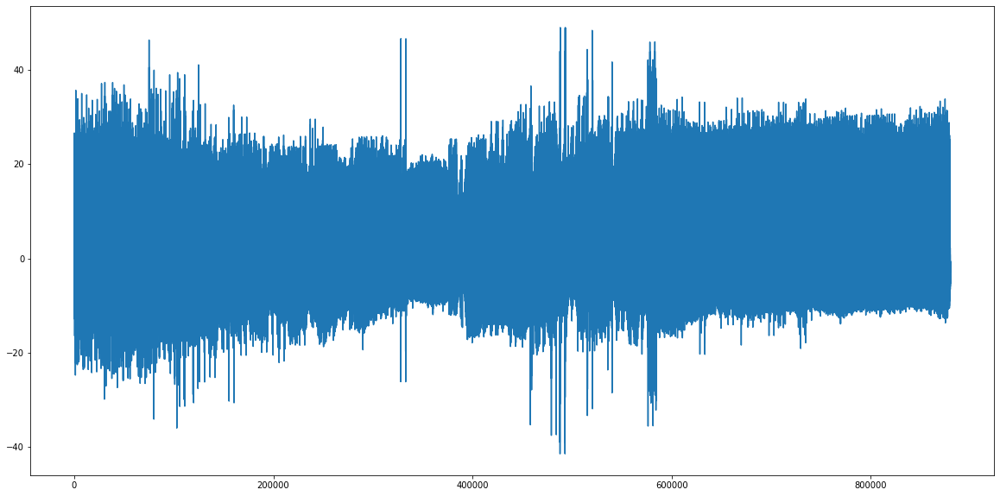

In [118]:
ab = np.reshape(x_model, [-1])

plt.figure(figsize=(20,10))
plt.plot(ab)

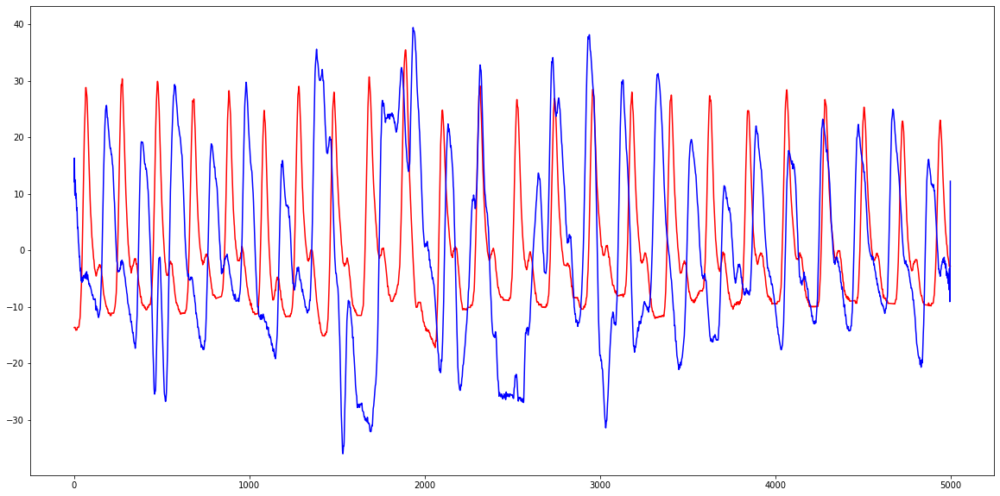

In [115]:
k = 10

plt.figure(figsize=(20,10))
plt.plot(x_train[k,:,0], 'r')
plt.plot(x_model[k,:,0], 'b')

In [ ]:
model.predict(x_test).flatten()

In [102]:
y_pred1 = model.predict(x_test).flatten()

np.mean((y_pred1>=0.5)==(y_test_bin))*100

75.21318931210915

In [103]:
y_pred1

array([0.8948152 , 0.900638  , 0.9109948 , ..., 0.38132286, 0.47529235,
       0.48071966], dtype=float32)

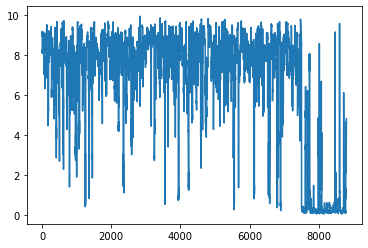

In [104]:
plt.plot(y_pred1*10)

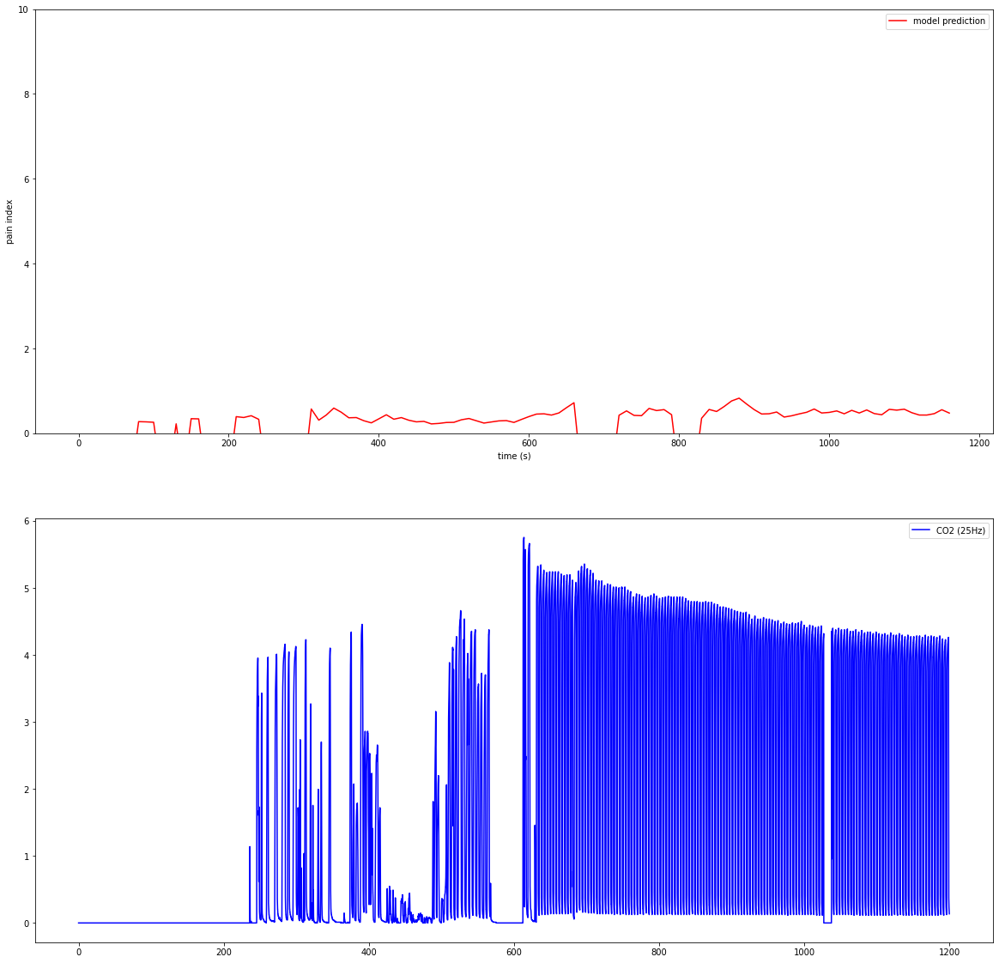

In [123]:
# CO2
vital_co2 = vitaldb.vital_recs(vital_path+'preop_full_vital/'+f_vital, ['Datex-Ohmeda/CO2'], interval = 1/25).flatten()
vital_co2 = np.array(pd.DataFrame(vital_co2).fillna(method='ffill', axis=0).fillna(method='bfill', axis=0).values.flatten())
vital_co2[vital_co2<=0] = 0


# plotting
fig = plt.figure(figsize=(20,20))
ax1 = fig.add_subplot(2,1,1)
ax1.plot([i*10 for i in range(len(x_input))], y, 'r', label='model prediction')
#ax1.set_xticks([i*5 for i in range(len(x_input))])
ax1.set_ylim(0, 10)
ax1.set_ylabel('pain index')
ax1.set_xlabel('time (s)')
ax1.legend(loc='best')


ax2 = fig.add_subplot(2,1,2)
ax2.plot([i/25 for i in range(len(vital_co2))], vital_co2, 'b', label='CO2 (25Hz)')
ax2.legend(loc='best')
#ax2.plot(np.reshape(ecg_samp,[-1,])

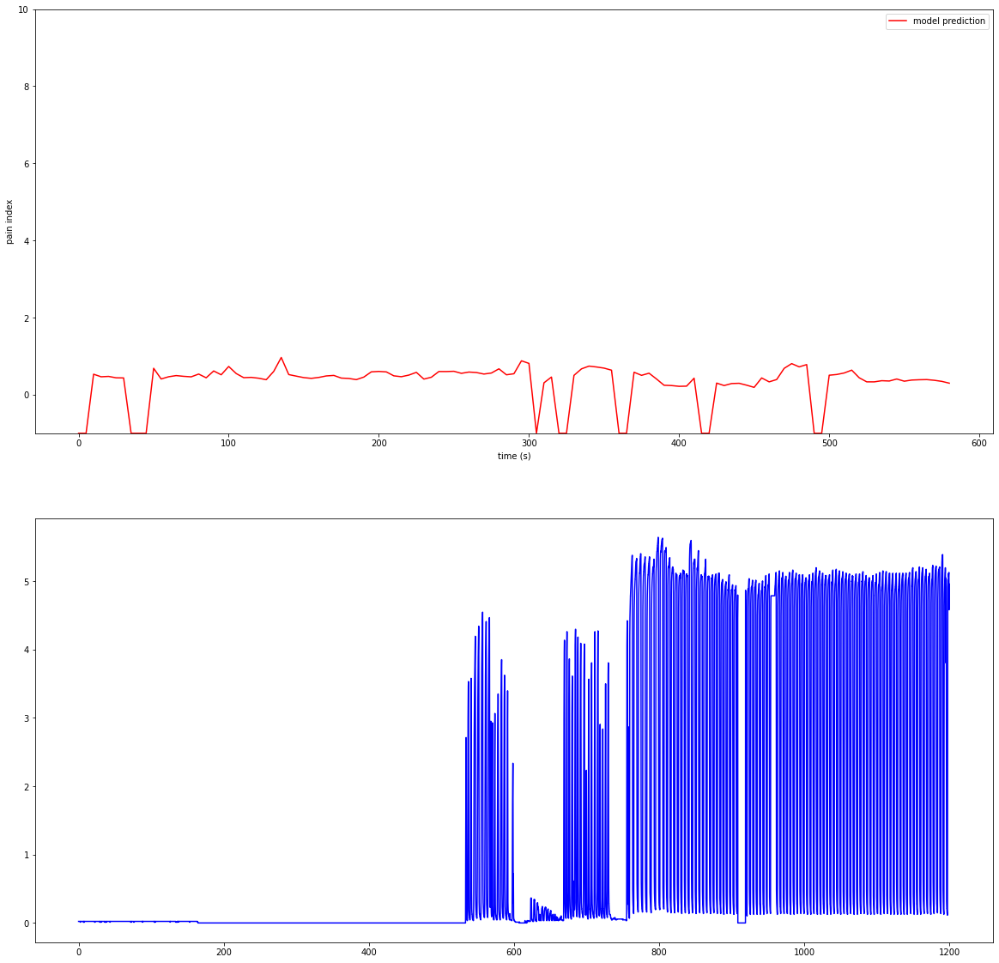

In [11]:
import matplotlib.pyplot as plt



for j in range(len(x_input)*5//240):
    fig = plt.figure(figsize=(20,20))
    ax1 = fig.add_subplot(2,1,1)
    ax1.plot([i*5 for i in range(len(x_input))], y, 'r', label='model prediction')
    #ax1.set_xticks([i*5 for i in range(len(x_input))])
    ax1.set_ylim(0, 10)
    ax1.set_ylabel('pain index')
    ax1.set_xlabel('time (s)')
    ax1.legend(loc='best')


    ax2 = fig.add_subplot(2,1,2)
    ax2.plot([i/25 for i in range(len(vital_co2))], vital_co2, 'b', label='CO2 (25Hz)')
    #ax2.plot(np.reshape(ecg_samp,[-1,])

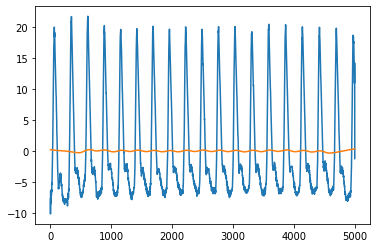

In [14]:
plt.plot(seg_ppg)
#plt.plot(smooth(seg_ecg))
plt.plot(lowess(seg_ppg,0.2))

In [22]:
len(ppg_val)

119995

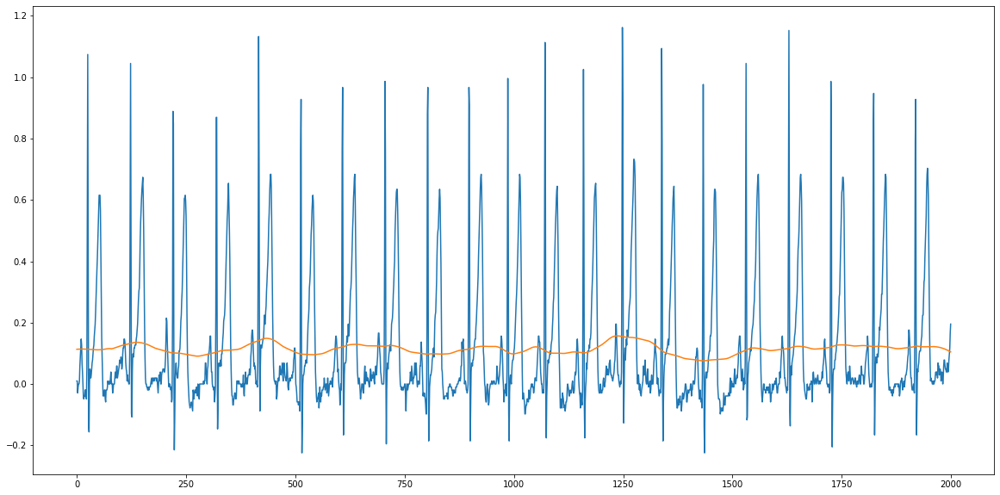

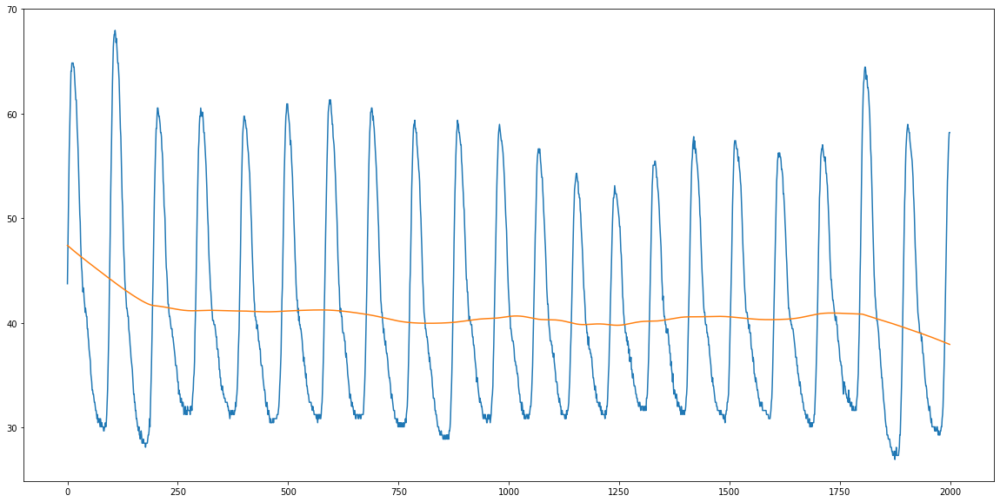

In [41]:
start_idx = 30000
end_idx = start_idx + 2000

seg_ppg = np.copy(ppg_val[start_idx:end_idx])
seg_ecg = np.copy(ecg_val[start_idx:end_idx])

plt.figure(figsize=(20,10))
plt.plot(seg_ecg)
#plt.plot(smooth(seg_ecg))
plt.plot(lowess(seg_ecg,0.08))
plt.show()


plt.figure(figsize=(20,10))
plt.plot(seg_ppg)
#plt.plot(smooth(seg_ecg))
plt.plot(lowess(seg_ppg,0.2))
plt.show()

In [ ]:

seg_ecg = np.copy(ecg_samp[start_idx:end_idx])

plt.figure(figsize=(20,10))
plt.plot(seg_ecg)
#plt.plot(smooth(seg_ecg))
plt.plot(lowess(seg_ecg,0.2))
plt.show()